<a href="https://colab.research.google.com/github/AndSiq97/COVID-and-Vaccination-Analysis/blob/main/COVID_and_Vaccination_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import os
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix

In [ ]:
# Uncomment this cell, run it, then comment out cell and restart runtime to run entire notebook
# !pip install --upgrade matplotlib

Load Data

In [ ]:
covid_data_url = 'https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv'
owid_covid_data = pd.read_csv(covid_data_url)

Data Analysis and Inference and Visualizations

In [ ]:
# Shape of owid_covid_data
owid_covid_data.shape

(147495, 67)

In [ ]:
# Columns of owid_covid_data
owid_covid_data.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [ ]:
# Specify some columns not needed (to drop from dataframe)
drop_columns = ['new_cases_smoothed', 'new_deaths_smoothed', 'total_cases_per_million', 'new_cases_per_million', 'new_cases_smoothed_per_million',
                'total_deaths_per_million', 'new_deaths_per_million', 'new_deaths_smoothed_per_million', 'icu_patients_per_million',
                'hosp_patients_per_million', 'weekly_icu_admissions_per_million', 'weekly_hosp_admissions_per_million', 'total_tests_per_thousand',
                'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'new_vaccinations_smoothed',
                'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred','people_fully_vaccinated_per_hundred', 'total_boosters_per_hundred',
                'new_vaccinations_smoothed_per_million','new_people_vaccinated_smoothed', 'new_people_vaccinated_smoothed_per_hundred']

len(drop_columns)

24

In [ ]:
# Drop these columns as stated above
owid_covid_data.drop(drop_columns, axis = 1, inplace = True)

In [ ]:
# Check number of columns now after dropping columns
len(owid_covid_data.columns)

43

In [ ]:
# Check first 5 rows of dataframe
owid_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [ ]:
# Check last 5 rows of dataframe
owid_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
147490,ZWE,Africa,Zimbabwe,2021-12-12,167140.0,2138.0,4738.0,3.0,NaN,NaN,NaN,NaN,NaN,8682.0,1567117.0,0.3551,2.8,tests performed,6933837.0,3956872.0,2976965.0,NaN,22139.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147491,ZWE,Africa,Zimbabwe,2021-12-13,167140.0,0.0,4738.0,0.0,NaN,NaN,NaN,NaN,NaN,13289.0,1580406.0,0.3343,3.0,tests performed,6956144.0,3967781.0,2988363.0,NaN,22307.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147492,ZWE,Africa,Zimbabwe,2021-12-14,172012.0,4872.0,4740.0,2.0,NaN,NaN,NaN,NaN,NaN,16793.0,1597199.0,0.3406,2.9,tests performed,6980400.0,3981769.0,2998631.0,NaN,24256.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147493,ZWE,Africa,Zimbabwe,2021-12-15,177690.0,5678.0,4745.0,5.0,NaN,NaN,NaN,NaN,NaN,12690.0,1609889.0,0.3082,3.2,tests performed,7013400.0,4000022.0,3013378.0,NaN,33000.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147494,ZWE,Africa,Zimbabwe,2021-12-16,182057.0,4367.0,4759.0,14.0,NaN,NaN,NaN,NaN,NaN,12390.0,1622279.0,0.3006,3.3,tests performed,7058474.0,4023289.0,3035185.0,NaN,45074.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [ ]:
# Import library from datetime
from datetime import date
from datetime import datetime

# Convert columns to datetime types
owid_covid_data['date'] = pd.to_datetime(owid_covid_data['date'])

In [ ]:
# Number of Unique Locations
len(owid_covid_data['location'].unique())

238

In [ ]:
# Unique Locations (World, Countries, Continents, Income Types)
owid_covid_data['location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Asia', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethi

# Entire World COVID Data

In [ ]:
# Extract data only corresponding to the Entire Worldwide
world_covid_data = owid_covid_data[owid_covid_data.location == 'World']

In [ ]:
# Check first 5 rows of dataframe
world_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
138380,OWID_WRL,NaN,World,2020-01-22,557.0,0.0,17.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
138381,OWID_WRL,NaN,World,2020-01-23,655.0,98.0,18.0,1.0,3.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
138382,OWID_WRL,NaN,World,2020-01-24,941.0,286.0,26.0,8.0,3.28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
138383,OWID_WRL,NaN,World,2020-01-25,1434.0,493.0,42.0,16.0,3.43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
138384,OWID_WRL,NaN,World,2020-01-26,2118.0,684.0,56.0,14.0,3.50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN


In [ ]:
# Check last 5 rows of dataframe
world_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
139069,OWID_WRL,NaN,World,2021-12-11,269739121.0,488565.0,5301760.0,5709.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.463493e+09,4.428073e+09,3.625488e+09,369834945.0,43705940.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
139070,OWID_WRL,NaN,World,2021-12-12,270159882.0,420761.0,5306078.0,4318.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.492473e+09,4.433428e+09,3.632827e+09,375155871.0,28979581.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
139071,OWID_WRL,NaN,World,2021-12-13,270795523.0,635641.0,5312553.0,6475.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.521395e+09,4.437671e+09,3.641403e+09,381239234.0,28921738.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
139072,OWID_WRL,NaN,World,2021-12-14,271469226.0,673703.0,5320822.0,8269.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.560305e+09,4.445147e+09,3.654569e+09,388011946.0,38910942.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN
139073,OWID_WRL,NaN,World,2021-12-15,272205417.0,736191.0,5329879.0,9057.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.585280e+09,4.452957e+09,3.665465e+09,393673659.0,24974484.0,NaN,7.874966e+09,58.045,30.9,8.696,5.355,15469.207,10.0,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN,NaN,NaN


In [ ]:
# Shape of world_covid_data
world_covid_data.shape

(694, 43)

In [ ]:
# Number of Null Values in Each Column
world_covid_data.isnull().sum()

iso_code                                     0
continent                                  694
location                                     0
date                                         0
total_cases                                  0
new_cases                                    0
total_deaths                                 0
new_deaths                                   0
reproduction_rate                            6
icu_patients                               694
hosp_patients                              694
weekly_icu_admissions                      694
weekly_hosp_admissions                     694
new_tests                                  694
total_tests                                694
positive_rate                              694
tests_per_case                             694
tests_units                                694
total_vaccinations                         314
people_vaccinated                          314
people_fully_vaccinated                    326
total_booster

In [ ]:
# Columns
np.array(world_covid_data.columns)

array(['iso_code', 'continent', 'location', 'date', 'total_cases',
       'new_cases', 'total_deaths', 'new_deaths', 'reproduction_rate',
       'icu_patients', 'hosp_patients', 'weekly_icu_admissions',
       'weekly_hosp_admissions', 'new_tests', 'total_tests',
       'positive_rate', 'tests_per_case', 'tests_units',
       'total_vaccinations', 'people_vaccinated',
       'people_fully_vaccinated', 'total_boosters', 'new_vaccinations',
       'stringency_index', 'population', 'population_density',
       'median_age', 'aged_65_older', 'aged_70_older', 'gdp_per_capita',
       'extreme_poverty', 'cardiovasc_death_rate', 'diabetes_prevalence',
       'female_smokers', 'male_smokers', 'handwashing_facilities',
       'hospital_beds_per_thousand', 'life_expectancy',
       'human_development_index', 'excess_mortality_cumulative_absolute',
       'excess_mortality_cumulative', 'excess_mortality',
       'excess_mortality_cumulative_per_million'], dtype=object)

## Worldwide Population

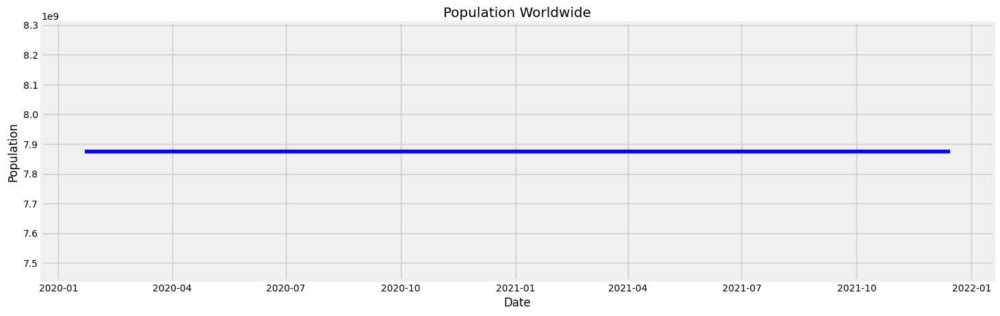

In [ ]:
# Note that Population Worldwide Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['population'], color='blue')
title = 'Population Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [ ]:
group = world_covid_data.groupby("location")["population"].max()
print("Worldwide Population")
print("                   ")
group

Worldwide Population
                   


location
World    7.874966e+09
Name: population, dtype: float64

## Worldwide Population Density

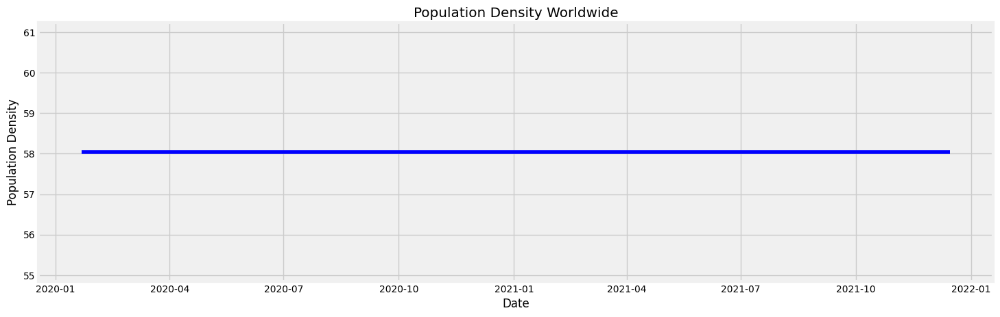

In [ ]:
# Note that Population Density Worldwide Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['population_density'], color='blue')
title = 'Population Density Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population Density')
plt.show()

In [ ]:
group = world_covid_data.groupby("location")["population_density"].max()
print("Worldwide Population Density")
print("                   ")
group

Worldwide Population Density
                   


location
World    58.045
Name: population_density, dtype: float64

## Worldwide Cases (Cumulative and Daily New Number of Cases) Over Time 

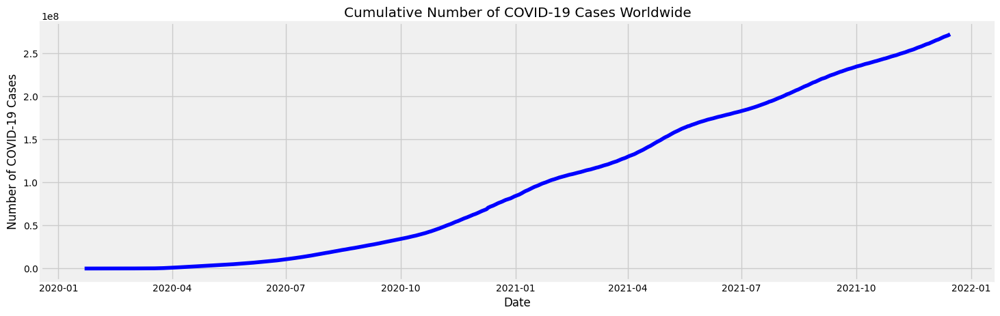

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_cases'], color='blue')
title = 'Cumulative Number of COVID-19 Cases Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Cases')
plt.show()

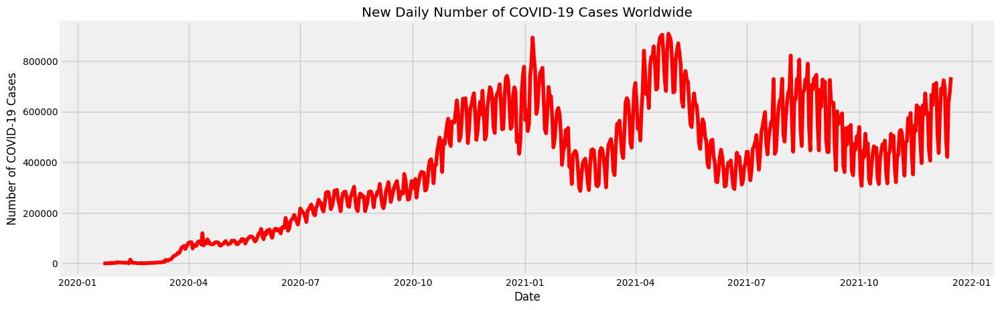

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_cases'], color='red')
title = 'New Daily Number of COVID-19 Cases Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Cases')
plt.show()

## Worldwide Deaths (Cumulative and Daily New Number of Deaths) Over Time

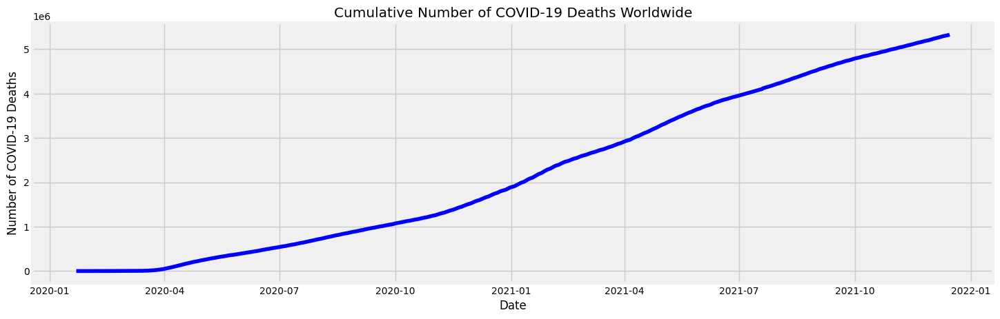

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_deaths'], color='blue')
title = 'Cumulative Number of COVID-19 Deaths Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Deaths')
plt.show()

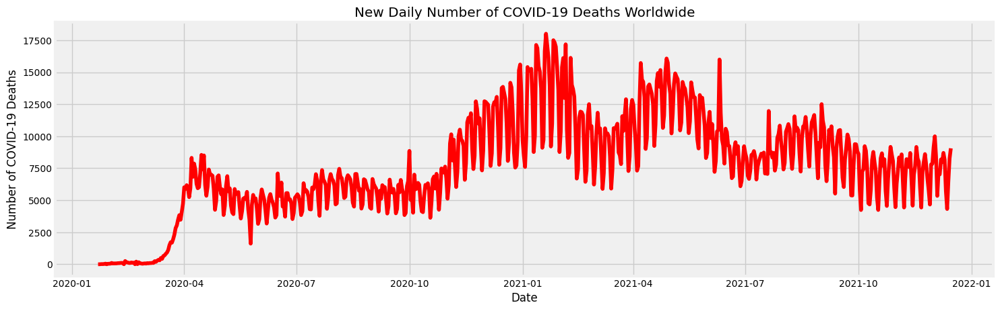

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_deaths'], color='red')
title = 'New Daily Number of COVID-19 Deaths Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Deaths')
plt.show()

## Worldwide Vaccinations (Cumulative and Daily New Number of Vaccinations) for COVID-19 Over Time

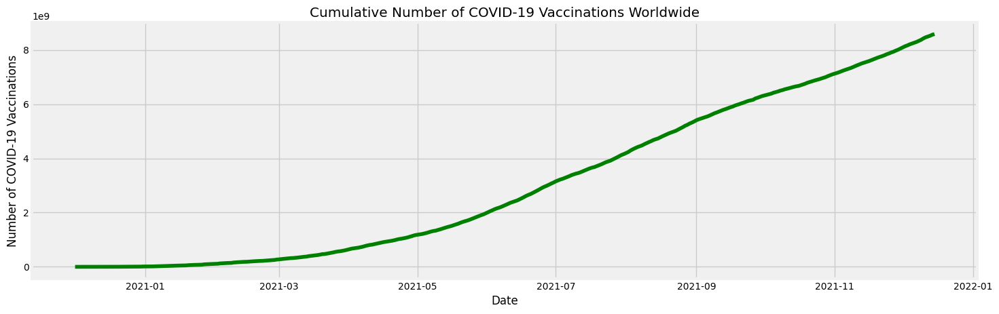

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['total_vaccinations'], color='green')
title = 'Cumulative Number of COVID-19 Vaccinations Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Vaccinations')
plt.show()

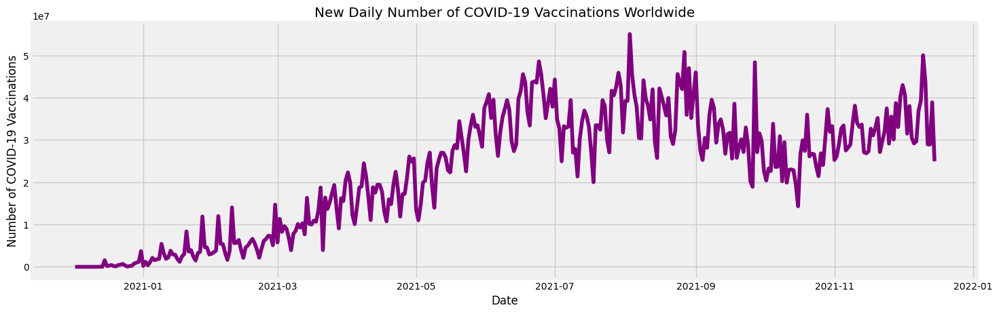

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['new_vaccinations'], color='purple')
title = 'New Daily Number of COVID-19 Vaccinations Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of COVID-19 Vaccinations')
plt.show()

## Worldwide Cumulative Number of Fully and Partially Vaccinated People for COVID-19 Over Time

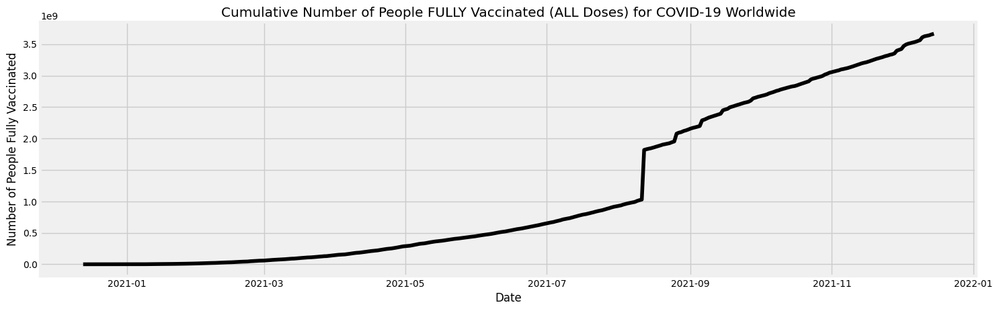

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['people_fully_vaccinated'], color='black')
title = 'Cumulative Number of People FULLY Vaccinated (ALL Doses) for COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of People Fully Vaccinated')
plt.show()

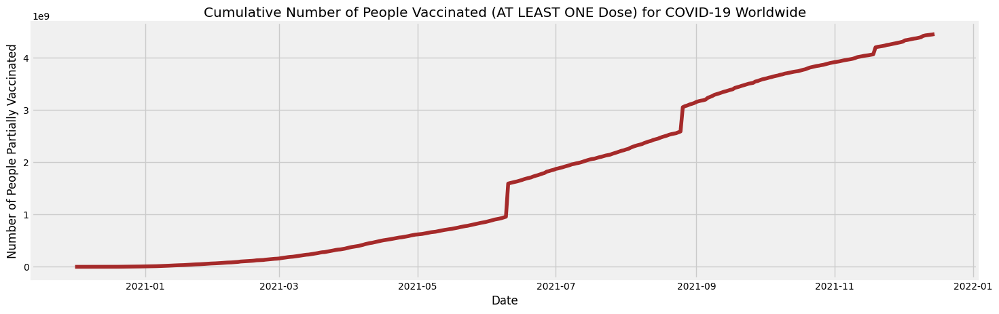

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['people_vaccinated'], color='brown')
title = 'Cumulative Number of People Vaccinated (AT LEAST ONE Dose) for COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Number of People Partially Vaccinated')
plt.show()

## Total Number of COVID-19 Cases Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Worldwide")
print("                   ")
group

Total Number of COVID-19 Cases Worldwide
                   


location
World    271607055.0
Name: new_cases, dtype: float64

## Mean Daily New Number of COVID-19 Cases Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Worldwide
                   


location
World    391364.632565
Name: new_cases, dtype: float64

## Total Number of COVID-19 Deaths Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Worldwide")
print("                   ")
group

Total Number of COVID-19 Deaths Worldwide
                   


location
World    5312952.0
Name: new_deaths, dtype: float64

## Mean Daily New Number of COVID-19 Deaths Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Worldwide
                   


location
World    7655.550432
Name: new_deaths, dtype: float64

## Total Number of COVID-19 Vaccinations Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Worldwide")
print("                   ")
group

Total Number of COVID-19 Vaccinations Worldwide
                   


location
World    8.585280e+09
Name: new_vaccinations, dtype: float64

## Mean Daily New Number of COVID-19 Vaccinations Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Worldwide")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Worldwide
                   


location
World    2.265245e+07
Name: new_vaccinations, dtype: float64

## Total Number of People Vaccinated (At LEAST One Dose) Against COVID-19 Worldwide

In [ ]:
group = world_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Worldwide")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Worldwide
                   


location
World    4.452957e+09
Name: people_vaccinated, dtype: float64

## Total Number of FULLY Vaccinated People Against COVID-19 Worldwide

In [ ]:
group = world_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Worldwide")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Worldwide
                   


location
World    3.665465e+09
Name: people_fully_vaccinated, dtype: float64

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Worldwide

In [ ]:
world_covid_data['Proportion_of_cases_of_population'] = world_covid_data['total_cases'] / world_covid_data['population']
world_covid_data['Proportion_of_deaths_of_population'] = world_covid_data['total_deaths'] / world_covid_data['population']
world_covid_data['Proportion_of_deaths_of_pos_cases'] = world_covid_data['total_deaths'] / world_covid_data['total_cases']
world_covid_data['Proportion_of_vaccinated_of_population'] = world_covid_data['people_vaccinated'] / world_covid_data['population']
world_covid_data['Proportion_of_fully_vaccinated_of_population'] = world_covid_data['people_fully_vaccinated'] / world_covid_data['population']

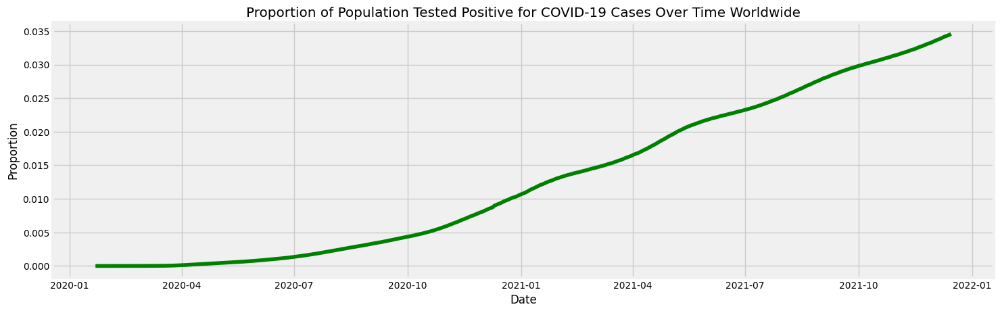

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_cases_of_population'], color='green')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

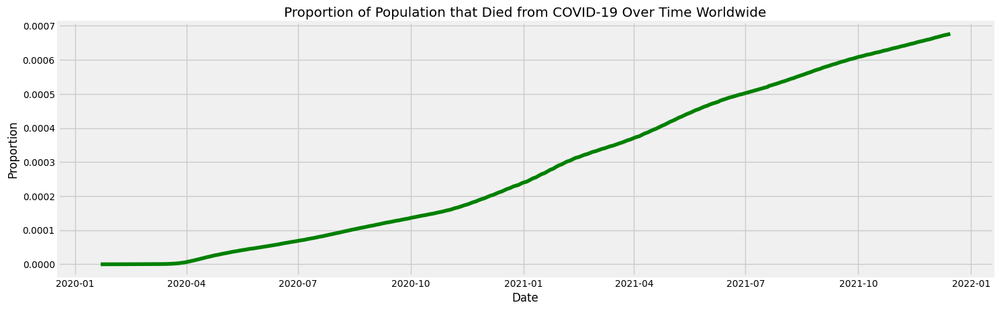

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_deaths_of_population'], color='green')
title = 'Proportion of Population that Died from COVID-19 Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

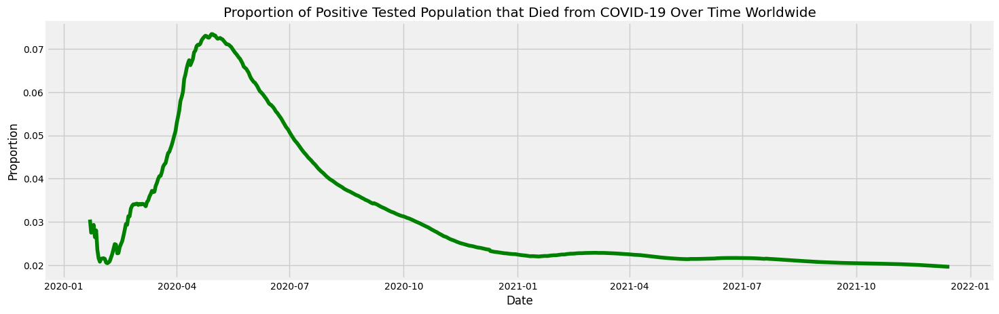

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_deaths_of_pos_cases'], color='green')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

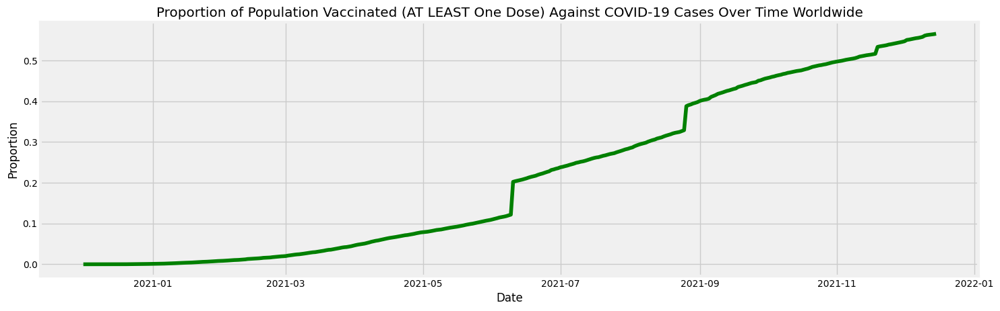

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_vaccinated_of_population'], color='green')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

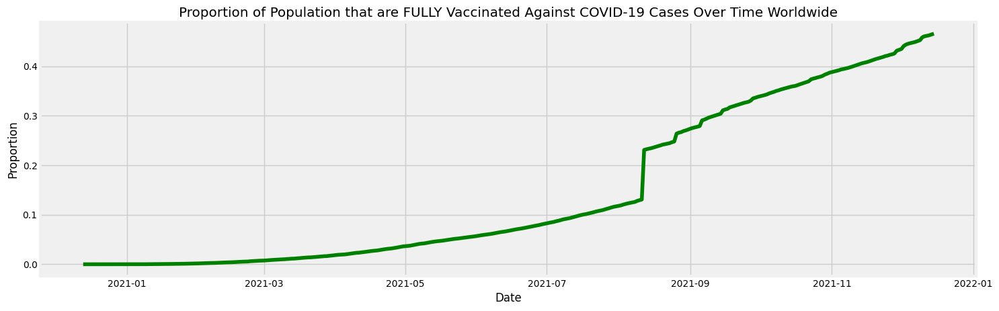

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['Proportion_of_fully_vaccinated_of_population'], color='green')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_cases"].sum() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Worldwide")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Worldwide
                   


location
World    0.03449
dtype: float64

In [ ]:
group = world_covid_data.groupby("location")["new_deaths"].sum() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Worldwide")
print("                   ")
group

Proportion of Population that Died from COVID-19 Worldwide
                   


location
World    0.000675
dtype: float64

## Proportion of Population Tested Positive for COVID-19 that Have Died From COVID-19 Worldwide

In [ ]:
group = world_covid_data.groupby("location")["new_deaths"].sum() / world_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Worldwide")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Worldwide
                   


location
World    0.019561
dtype: float64

## Proportion of Population Vaccinated (Fully or Partially) Against COVID-19 Worldwide

In [ ]:
group = world_covid_data.groupby("location")["people_vaccinated"].max() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Worldwide")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Worldwide
                   


location
World    0.565457
dtype: float64

In [ ]:
group = world_covid_data.groupby("location")["people_fully_vaccinated"].max() / world_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Worldwide")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Worldwide
                   


location
World    0.465458
dtype: float64

## Worldwide Reproduction Rate of COVID-19

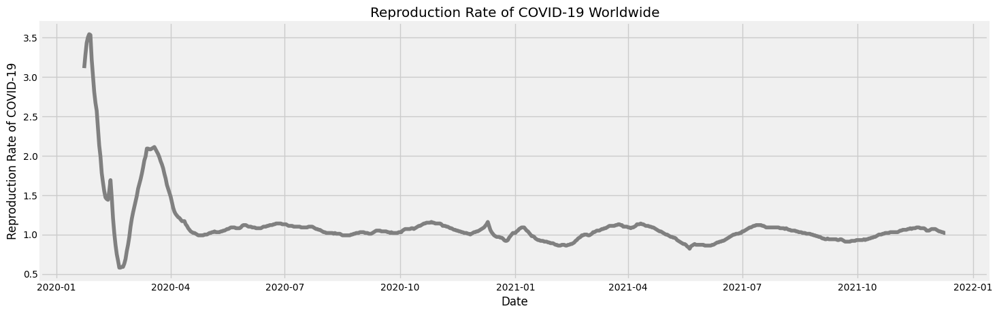

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
plt.plot(world_covid_data['date'], world_covid_data['reproduction_rate'], color='gray')
title = 'Reproduction Rate of COVID-19 Worldwide'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Reproduction Rate of COVID-19')
plt.show()

In [ ]:
group = world_covid_data.groupby("location")["reproduction_rate"].mean()
print("Average Daily Reproduction Rate of COVID-19 Worldwide")
print("                   ")
group

Average Daily Reproduction Rate of COVID-19 Worldwide
                   


location
World    1.106017
Name: reproduction_rate, dtype: float64

## Continents COVID-19 Data

In [ ]:
# Extracting data only corresponding to Continents in the World
continents = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania']
continents_covid_data = owid_covid_data[owid_covid_data['location'].isin(continents)]

In [ ]:
# Check first 5 rows of dataframe
continents_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
662,OWID_AFR,NaN,Africa,2020-02-13,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
663,OWID_AFR,NaN,Africa,2020-02-14,1.0,1.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
664,OWID_AFR,NaN,Africa,2020-02-15,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
665,OWID_AFR,NaN,Africa,2020-02-16,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
666,OWID_AFR,NaN,Africa,2020-02-17,1.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.373486e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Check last 5 rows of dataframe
continents_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
123561,OWID_SAM,NaN,South America,2021-12-12,39147204.0,11675.0,1185747.0,224.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,615783616.0,324750382.0,265006393.0,37677242.0,694884.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123562,OWID_SAM,NaN,South America,2021-12-13,39151030.0,3826.0,1185846.0,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,617553639.0,325128563.0,265827899.0,38422372.0,1770023.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123563,OWID_SAM,NaN,South America,2021-12-14,39184858.0,33828.0,1186573.0,727.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,619535458.0,325507123.0,266663209.0,39186385.0,1981819.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123564,OWID_SAM,NaN,South America,2021-12-15,39203060.0,18202.0,1187056.0,483.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,621359922.0,325808763.0,267572486.0,39799343.0,1824464.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
123565,OWID_SAM,NaN,South America,2021-12-16,39217095.0,14035.0,1187292.0,236.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,622663257.0,326031103.0,267966492.0,40485955.0,1303335.0,NaN,434260137.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Shape of continents_covid_data
continents_covid_data.shape

(4113, 43)

In [ ]:
# Number of Null Values in Each Column
continents_covid_data.isnull().sum()

iso_code                                      0
continent                                  4113
location                                      0
date                                          0
total_cases                                   4
new_cases                                     0
total_deaths                                134
new_deaths                                    0
reproduction_rate                          4113
icu_patients                               4113
hosp_patients                              4113
weekly_icu_admissions                      4113
weekly_hosp_admissions                     4113
new_tests                                  4113
total_tests                                4113
positive_rate                              4113
tests_per_case                             4113
tests_units                                4113
total_vaccinations                         2002
people_vaccinated                          2002
people_fully_vaccinated                 

In [ ]:
# Check to see unique Continents 
continents_covid_data['location'].unique()

array(['Africa', 'Asia', 'Europe', 'North America', 'Oceania',
       'South America'], dtype=object)

In [ ]:
# Set Index to Date
continents_covid_data.set_index('date', inplace = True)

## Population Between Continents

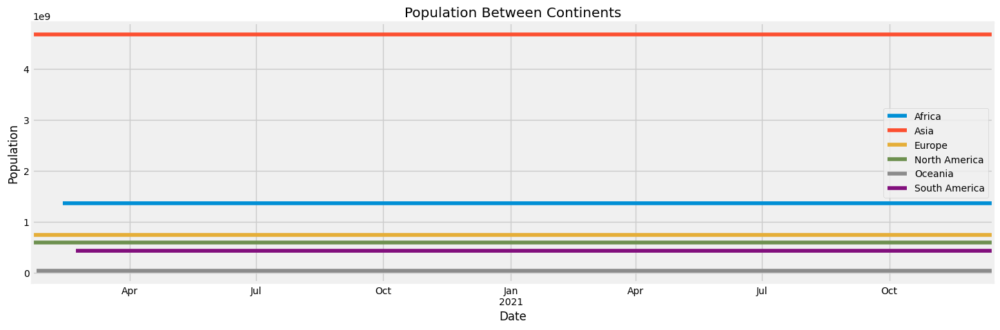

In [ ]:
# Note that Population Between Continents Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['population'].plot(legend='True')
title = 'Population Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [ ]:
group = continents_covid_data.groupby("location")["population"].max()
print("Population Between Continents")
print("                   ")
group

Population Between Continents
                   


location
Africa           1.373486e+09
Asia             4.678445e+09
Europe           7.489630e+08
North America    5.965813e+08
Oceania          4.321995e+07
South America    4.342601e+08
Name: population, dtype: float64

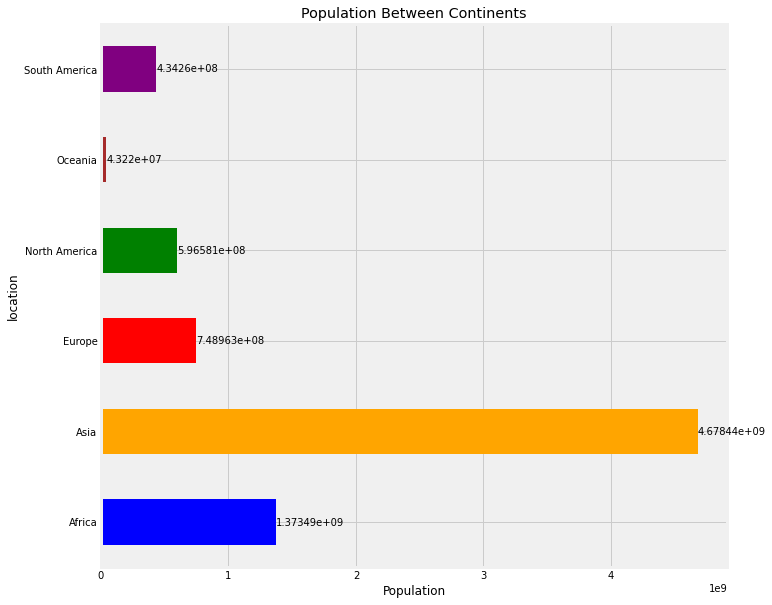

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Population Between Continents")
plt.xlabel("Population")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Continents

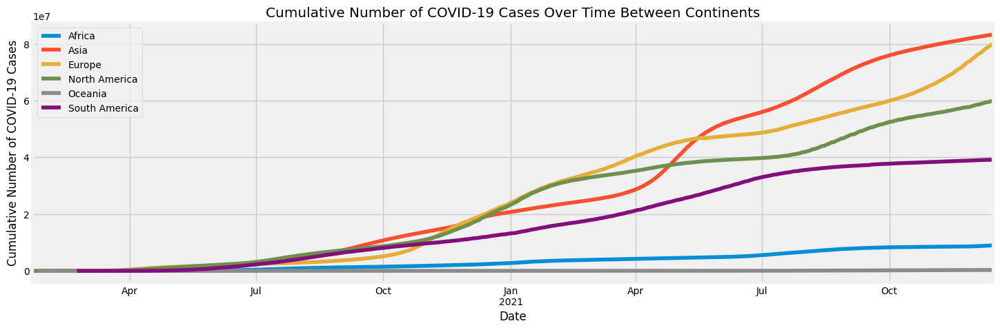

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_cases'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
plt.show()

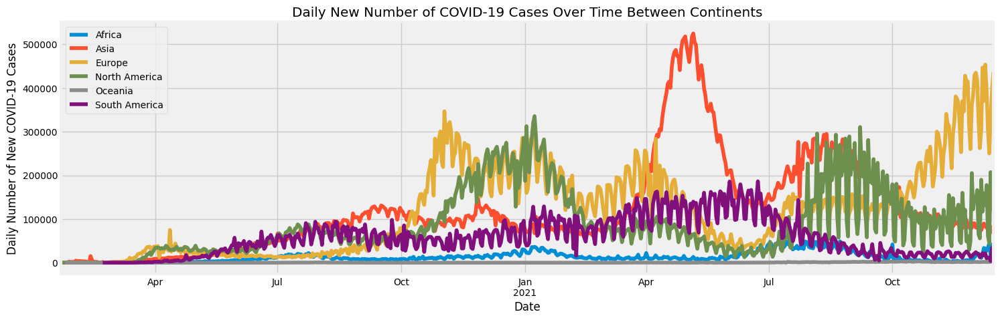

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_cases'].plot(legend='True')
title = 'Daily New Number of COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Continents

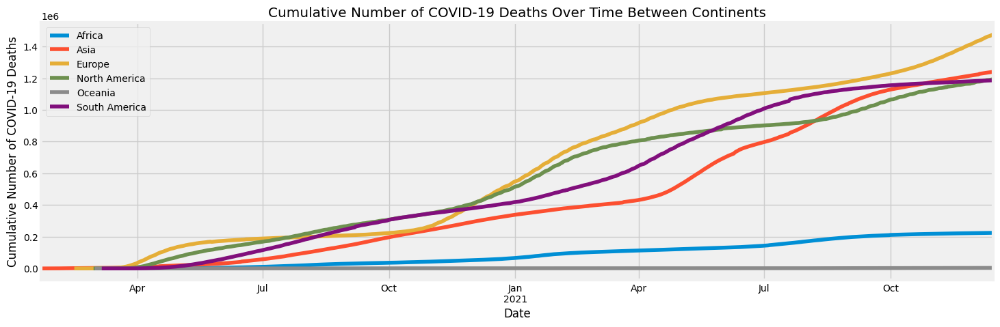

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_deaths'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Deaths Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
plt.show()

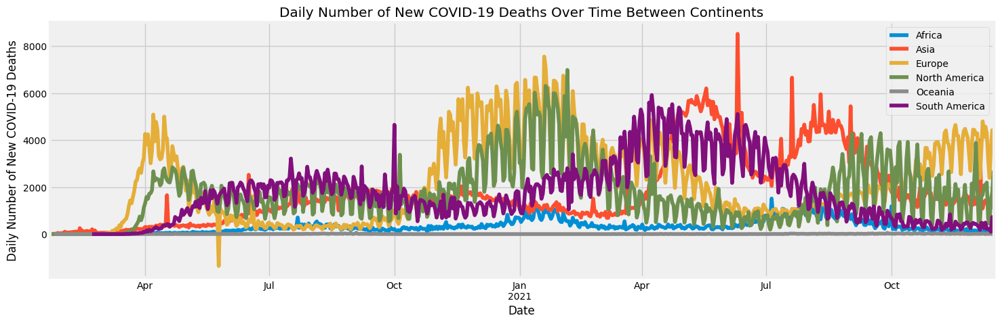

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_deaths'].plot(legend='True')
title = 'Daily Number of New COVID-19 Deaths Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Against COVID-19 Over Time Between Continents

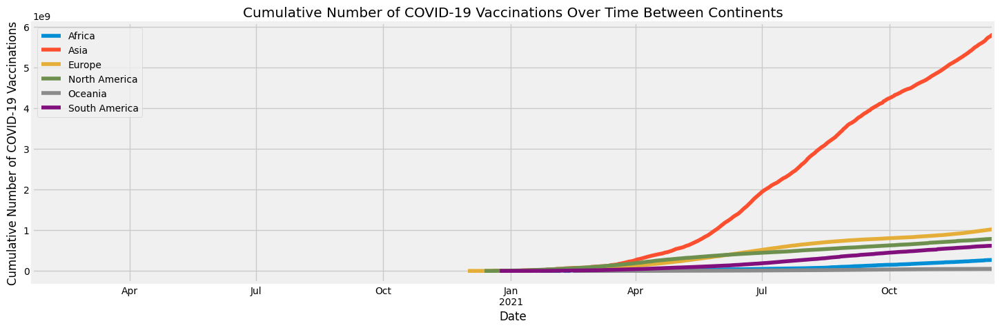

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['total_vaccinations'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
plt.show()

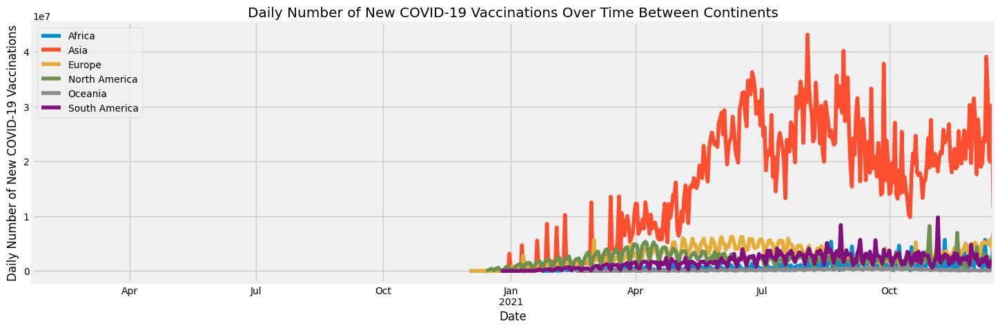

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['new_vaccinations'].plot(legend='True')
title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Continents

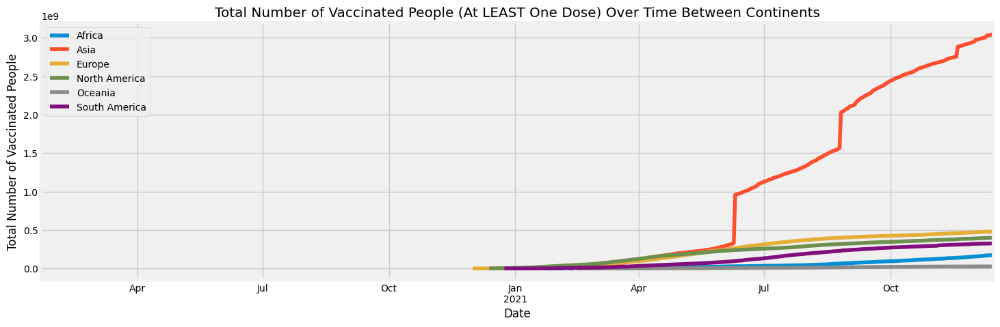

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['people_vaccinated'].plot(legend='True')
title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Vaccinated People')
plt.show()

## Total Number of Fully Vaccinated People Against COVID-19 Over Time Between Continents

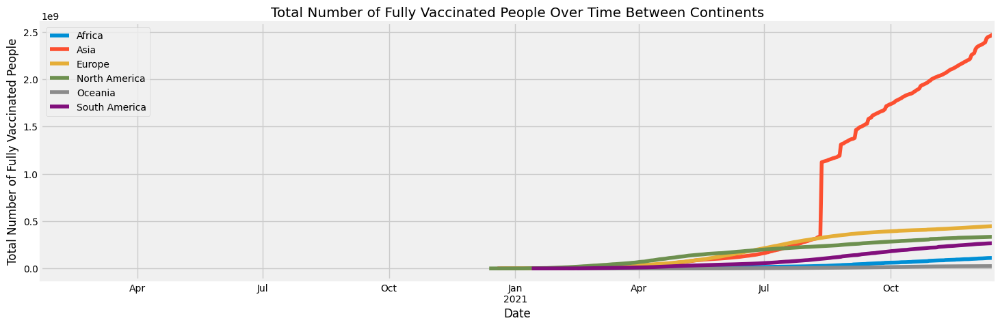

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['people_fully_vaccinated'].plot(legend='True')
title = 'Total Number of Fully Vaccinated People Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_cases"].sum() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Between Continents")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Between Continents
                   


location
Africa           0.006570
Asia             0.017633
Europe           0.107681
North America    0.100649
Oceania          0.007886
South America    0.089930
dtype: float64

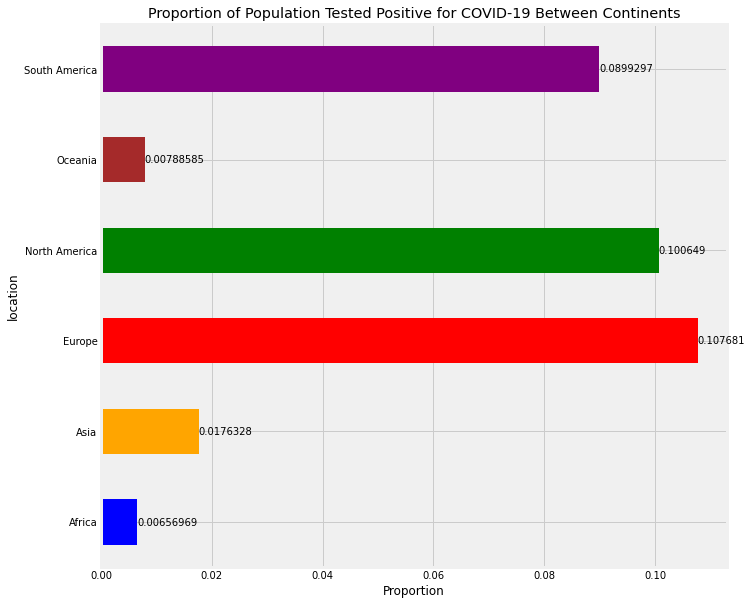

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population Tested Positive for COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [ ]:
group = continents_covid_data.groupby("location")["new_deaths"].sum() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Between Continents")
print("                   ")
group

Proportion of Population that Died from COVID-19 Between Continents
                   


location
Africa           0.000164
Asia             0.000265
Europe           0.001974
North America    0.001997
Oceania          0.000080
South America    0.002704
dtype: float64

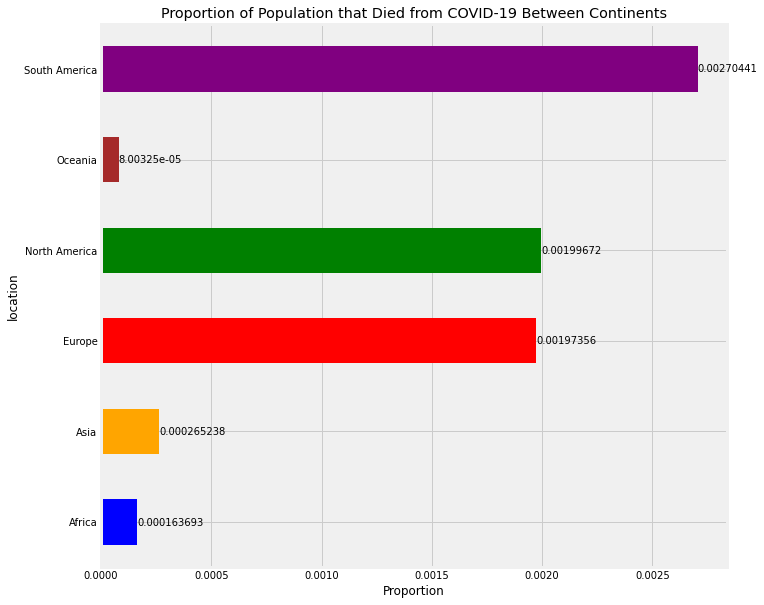

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population that Died from COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_deaths"].sum() / continents_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Between Continents")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Between Continents
                   


location
Africa           0.024916
Asia             0.015042
Europe           0.018328
North America    0.019838
Oceania          0.010149
South America    0.030073
dtype: float64

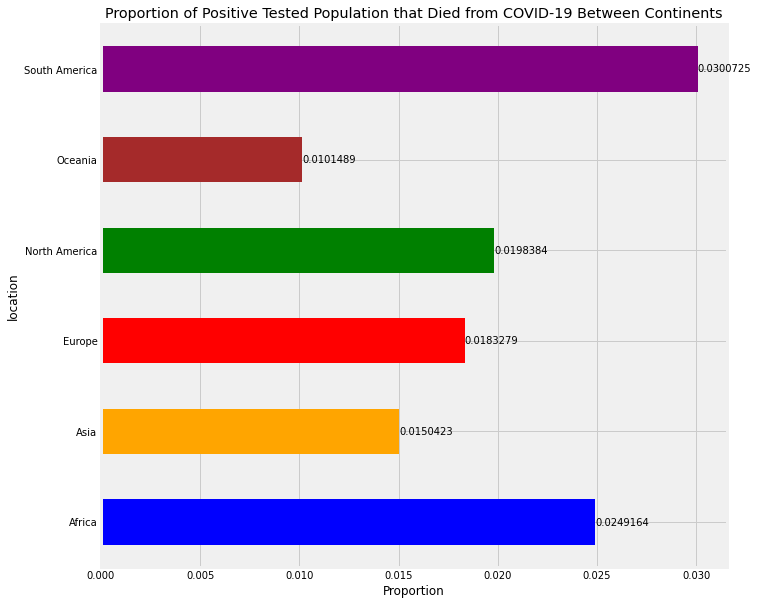

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Positive Tested Population that Died from COVID-19 Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["people_vaccinated"].max() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents
                   


location
Africa           0.127497
Asia             0.651132
Europe           0.640551
North America    0.670775
Oceania          0.603952
South America    0.749627
dtype: float64

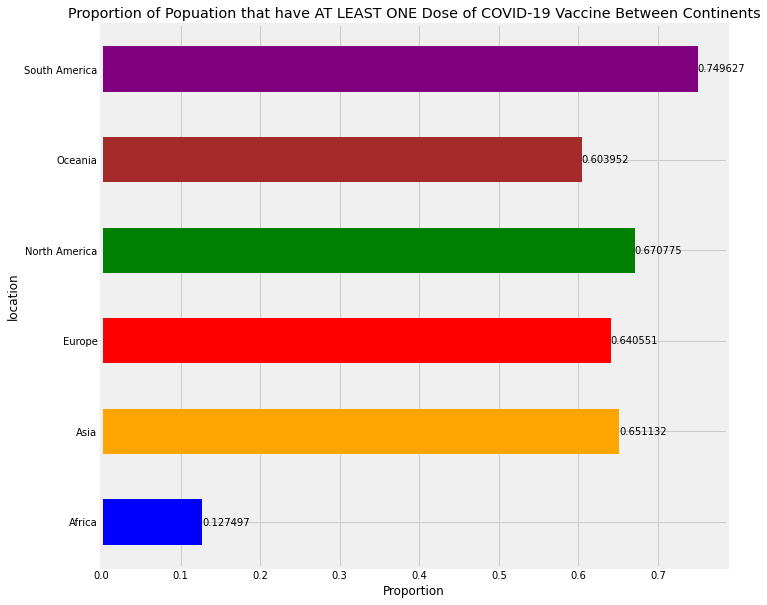

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [ ]:
group = continents_covid_data.groupby("location")["people_fully_vaccinated"].max() / continents_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Between Continents")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Between Continents
                   


location
Africa           0.082808
Asia             0.529338
Europe           0.598155
North America    0.562048
Oceania          0.570653
South America    0.615490
dtype: float64

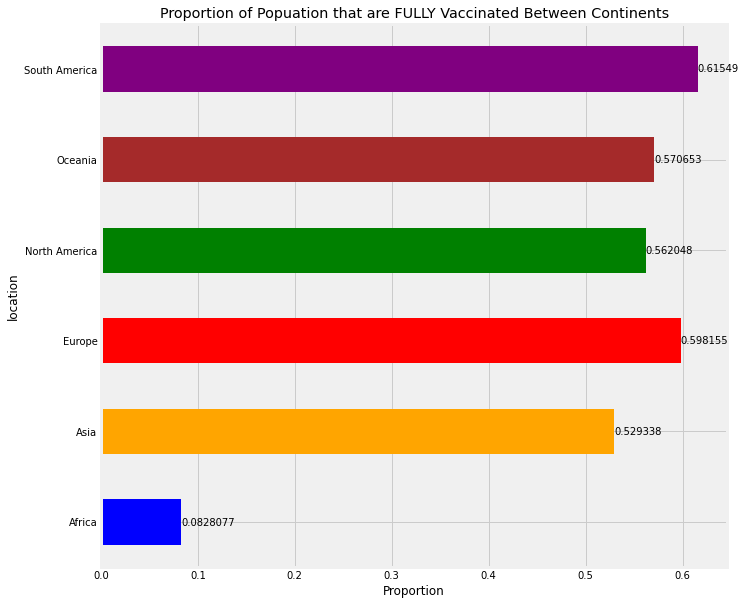

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that are FULLY Vaccinated Between Continents")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Continents 

In [ ]:
continents_covid_data['Proportion_of_cases_of_population'] = continents_covid_data['total_cases'] / continents_covid_data['population']
continents_covid_data['Proportion_of_deaths_of_population'] = continents_covid_data['total_deaths'] / continents_covid_data['population']
continents_covid_data['Proportion_of_deaths_of_pos_cases'] = continents_covid_data['total_deaths'] / continents_covid_data['total_cases']
continents_covid_data['Proportion_of_vaccinated_of_population'] = continents_covid_data['people_vaccinated'] / continents_covid_data['population']
continents_covid_data['Proportion_of_fully_vaccinated_of_population'] = continents_covid_data['people_fully_vaccinated'] / continents_covid_data['population']

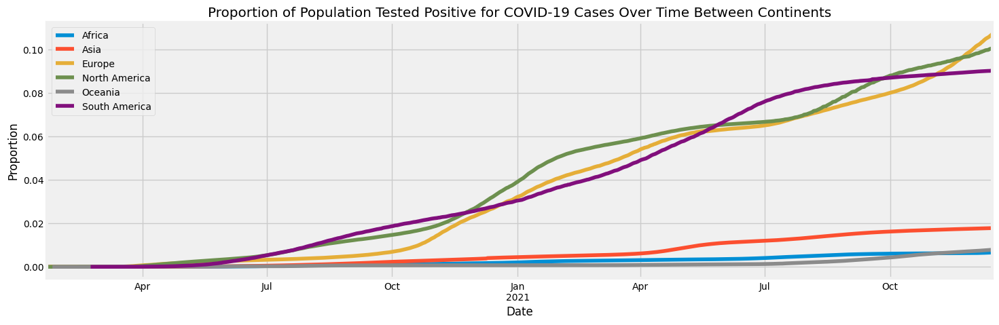

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

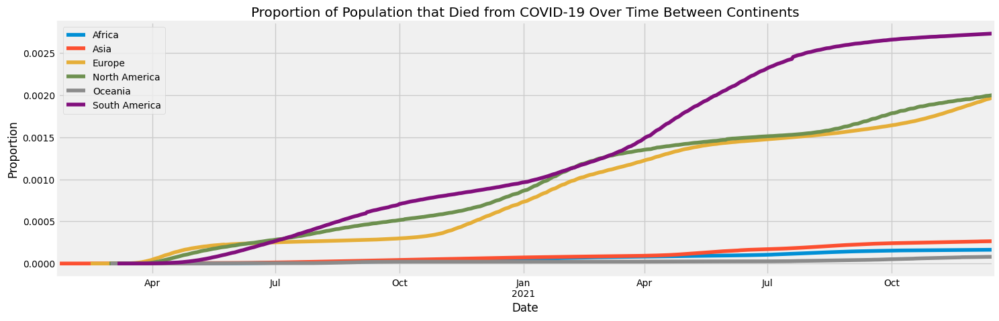

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
title = 'Proportion of Population that Died from COVID-19 Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

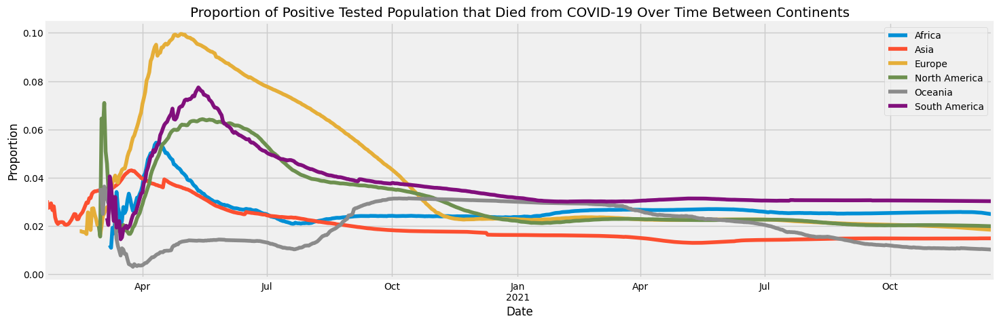

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

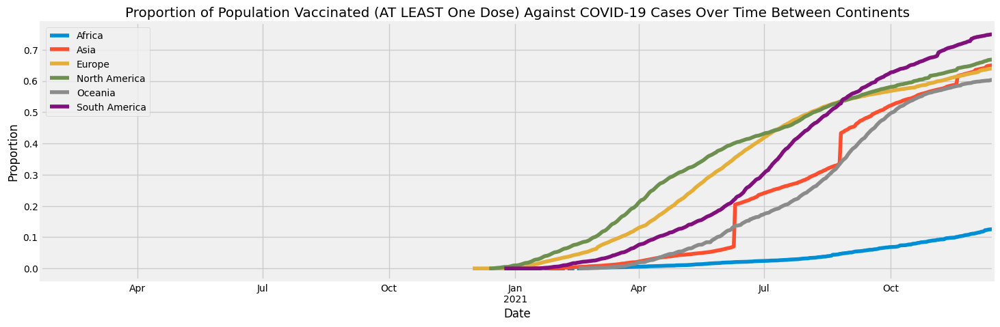

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

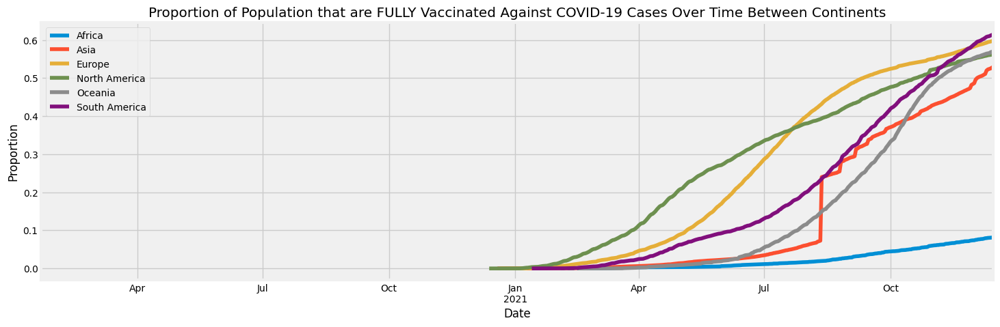

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
continents_covid_data.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Continents'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Total Number of COVID-19 Cases Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Between Continents")
print("                   ")
group

Total Number of COVID-19 Cases Between Continents
                   


location
Africa            9023375.0
Asia             82494005.0
Europe           80648839.0
North America    60045553.0
Oceania            340826.0
South America    39052871.0
Name: new_cases, dtype: float64

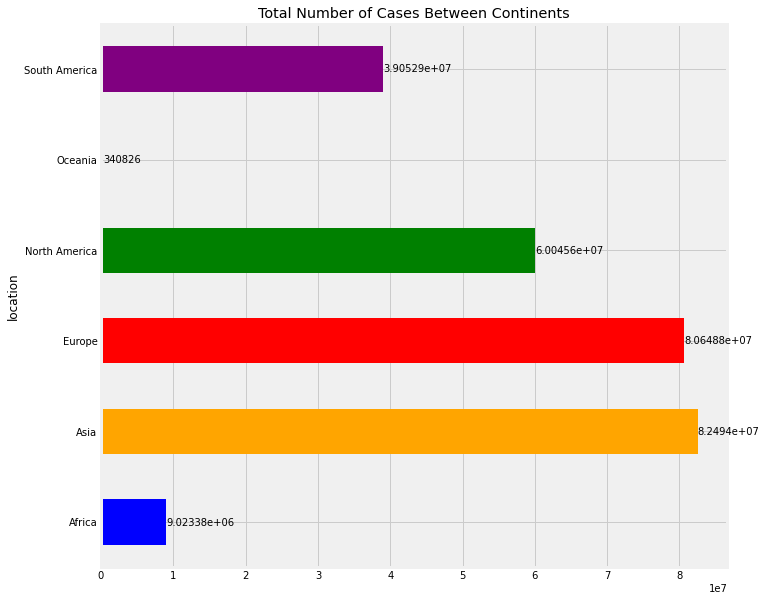

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Cases Between Continents")
plt.ylabel("Total Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Between Continents
                   


location
Africa            13427.641369
Asia             118867.442363
Europe           116376.391053
North America     86520.969741
Oceania             493.235890
South America     58903.274510
Name: new_cases, dtype: float64

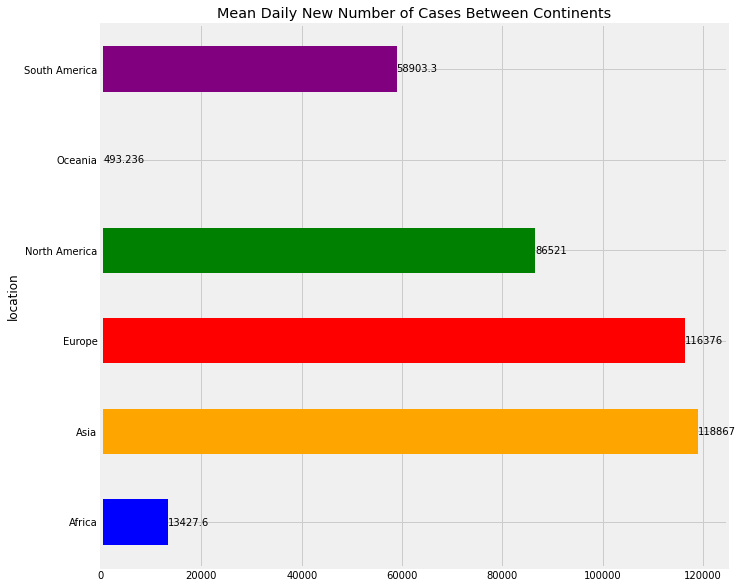

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Cases Between Continents")
plt.ylabel("Mean Daily New Number of Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Between Continents")
print("                   ")
group

Total Number of COVID-19 Deaths Between Continents
                   


location
Africa            224830.0
Asia             1240901.0
Europe           1478124.0
North America    1191205.0
Oceania             3459.0
South America    1174418.0
Name: new_deaths, dtype: float64

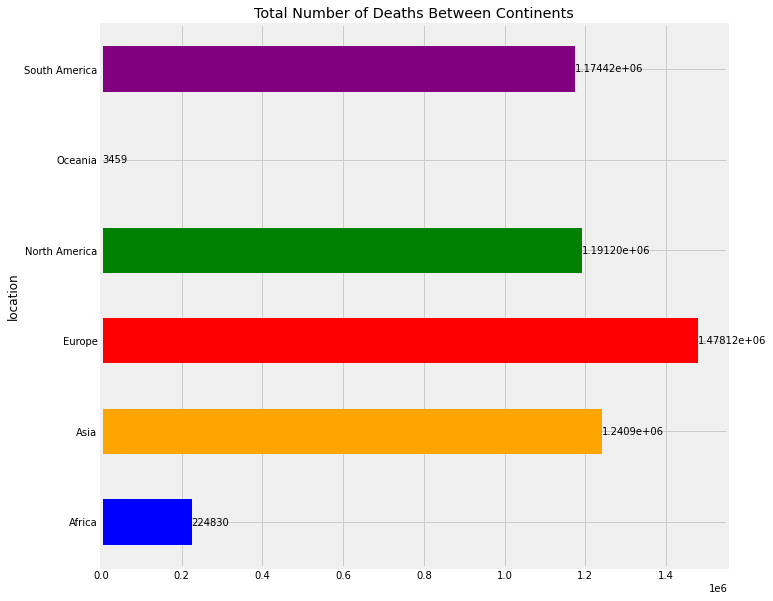

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Deaths Between Continents")
plt.ylabel("Total Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Between Continents
                   


location
Africa            334.568452
Asia             1788.041787
Europe           2132.935065
North America    1716.433718
Oceania             5.005789
South America    1771.369532
Name: new_deaths, dtype: float64

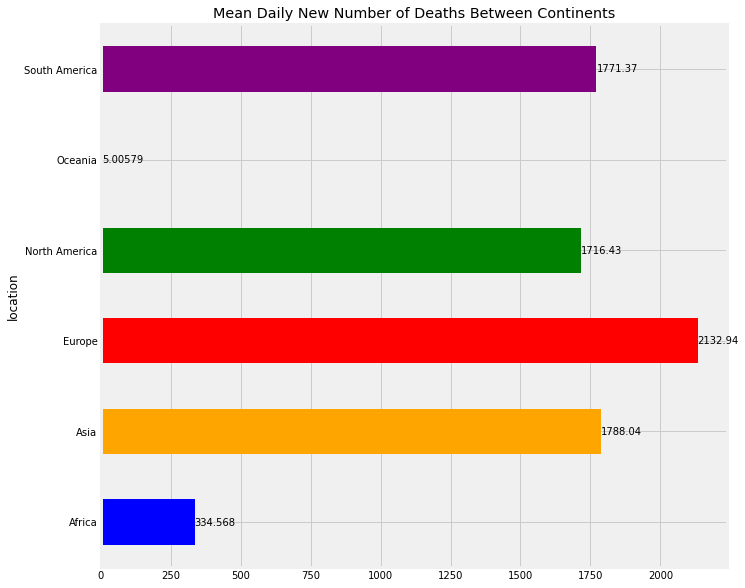

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Deaths Between Continents")
plt.ylabel("Mean Daily New Number of Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Between Continents")
print("                   ")
group

Total Number of COVID-19 Vaccinations Between Continents
                   


location
Africa           2.757913e+08
Asia             5.817146e+09
Europe           1.029102e+09
North America    7.886620e+08
Oceania          5.195066e+07
South America    6.206745e+08
Name: new_vaccinations, dtype: float64

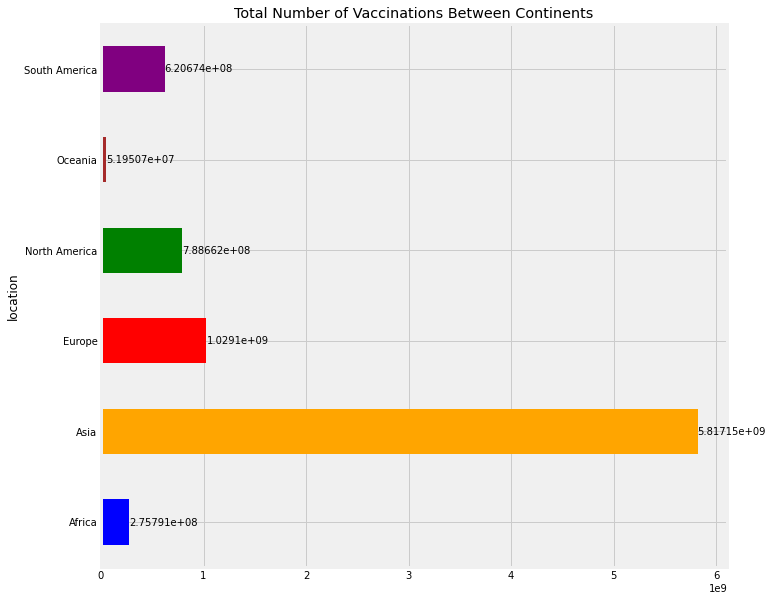

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinations Between Continents")
plt.ylabel("Total Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Between Continents")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Between Continents
                   


location
Africa           8.485885e+05
Asia             1.611398e+07
Europe           2.715309e+06
North America    2.148943e+06
Oceania          1.720220e+05
South America    1.743468e+06
Name: new_vaccinations, dtype: float64

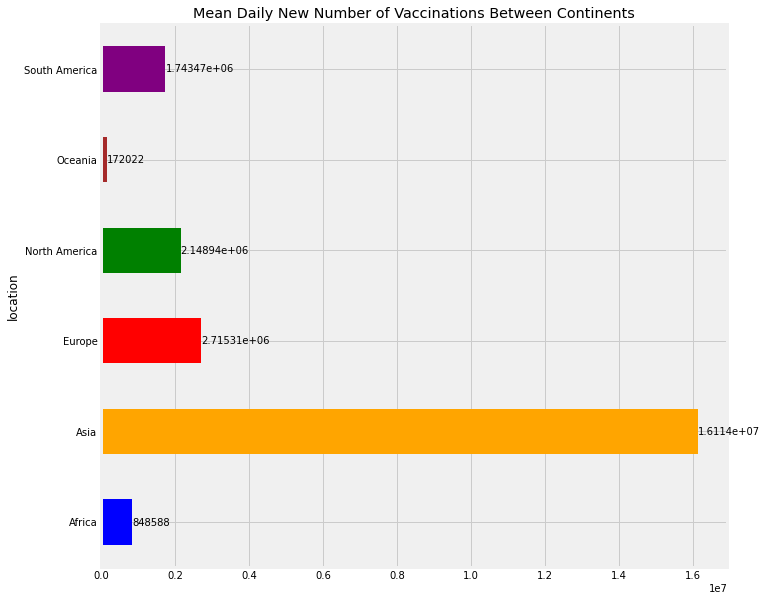

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Vaccinations Between Continents")
plt.ylabel("Mean Daily New Number of Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents
                   


location
Africa           1.751160e+08
Asia             3.046284e+09
Europe           4.797492e+08
North America    4.001719e+08
Oceania          2.610276e+07
South America    3.255331e+08
Name: people_vaccinated, dtype: float64

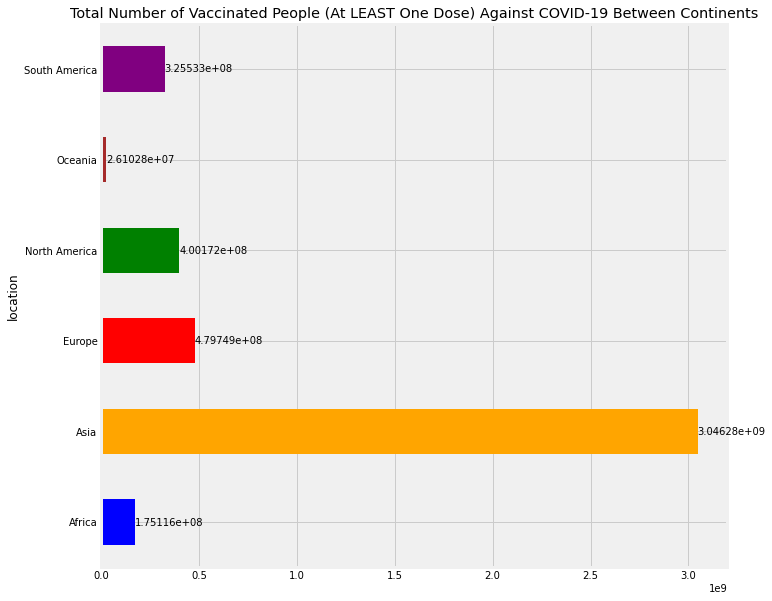

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Continents")
plt.ylabel("Total Number of Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Continents

In [ ]:
group = continents_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Between Continents")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Between Continents
                   


location
Africa           1.137353e+08
Asia             2.476481e+09
Europe           4.479959e+08
North America    3.353071e+08
Oceania          2.466360e+07
South America    2.672829e+08
Name: people_fully_vaccinated, dtype: float64

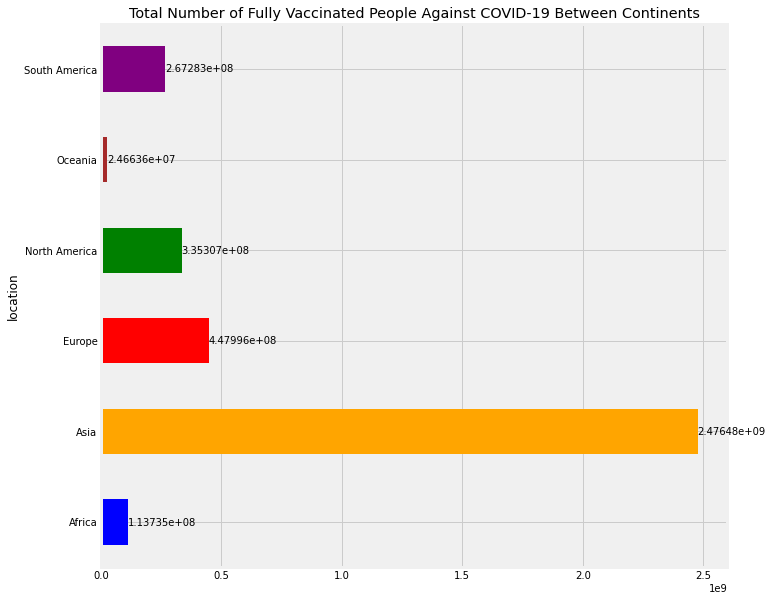

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Fully Vaccinated People Against COVID-19 Between Continents")
plt.ylabel("Total Number of Fully Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green', 'brown', 'purple'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

# Countries COVID-19 Data

In [ ]:
# Getting data corresponding to Countries only around the World
drop_values = ['Africa', 'Asia', 'Europe', 'North America', 'South America', 'Oceania', 'World', 'European Union',
               'High income', 'Low income', 'Lower middle income', 'Upper middle income', 'International']
countries_covid_data = owid_covid_data[~owid_covid_data['location'].isin(drop_values)]

In [ ]:
# Check first 5 rows of dataframe
countries_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.33,39835428.0,54.422,18.6,2.581,1.337,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN,NaN,NaN


In [ ]:
# Check last 5 rows of dataframe
countries_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
147490,ZWE,Africa,Zimbabwe,2021-12-12,167140.0,2138.0,4738.0,3.0,NaN,NaN,NaN,NaN,NaN,8682.0,1567117.0,0.3551,2.8,tests performed,6933837.0,3956872.0,2976965.0,NaN,22139.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147491,ZWE,Africa,Zimbabwe,2021-12-13,167140.0,0.0,4738.0,0.0,NaN,NaN,NaN,NaN,NaN,13289.0,1580406.0,0.3343,3.0,tests performed,6956144.0,3967781.0,2988363.0,NaN,22307.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147492,ZWE,Africa,Zimbabwe,2021-12-14,172012.0,4872.0,4740.0,2.0,NaN,NaN,NaN,NaN,NaN,16793.0,1597199.0,0.3406,2.9,tests performed,6980400.0,3981769.0,2998631.0,NaN,24256.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147493,ZWE,Africa,Zimbabwe,2021-12-15,177690.0,5678.0,4745.0,5.0,NaN,NaN,NaN,NaN,NaN,12690.0,1609889.0,0.3082,3.2,tests performed,7013400.0,4000022.0,3013378.0,NaN,33000.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN
147494,ZWE,Africa,Zimbabwe,2021-12-16,182057.0,4367.0,4759.0,14.0,NaN,NaN,NaN,NaN,NaN,12390.0,1622279.0,0.3006,3.3,tests performed,7058474.0,4023289.0,3035185.0,NaN,45074.0,NaN,15092171.0,42.729,19.6,2.822,1.882,1899.775,21.4,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN,NaN,NaN


In [ ]:
# Shape of countries_covid_data
countries_covid_data.shape

(138566, 43)

In [ ]:
# Number of Null Values in Each Column
countries_covid_data.isnull().sum()

iso_code                                        0
continent                                       0
location                                        0
date                                            0
total_cases                                  2905
new_cases                                    2917
total_deaths                                18938
new_deaths                                  18942
reproduction_rate                           28724
icu_patients                               121295
hosp_patients                              118831
weekly_icu_admissions                      137222
weekly_hosp_admissions                     136330
new_tests                                   79549
total_tests                                 79398
positive_rate                               71503
tests_per_case                              72165
tests_units                                 65300
total_vaccinations                         105666
people_vaccinated                          107176


In [ ]:
# List of all Countries and How Many there are 
print("There are " + str(len(countries_covid_data['location'].unique())) + " countries")
print("                   ")
countries_covid_data['location'].unique()

There are 225 countries
                   


array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Anguilla', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bonaire Sint Eustatius and Saba',
       'Bosnia and Herzegovina', 'Botswana', 'Brazil',
       'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso',
       'Burundi', 'Cambodia', 'Cameroon', 'Canada', 'Cape Verde',
       'Cayman Islands', 'Central African Republic', 'Chad', 'Chile',
       'China', 'Colombia', 'Comoros', 'Congo', 'Cook Islands',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao',
       'Cyprus', 'Czechia', 'Democratic Republic of Congo', 'Denmark',
       'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt',
       'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Faeroe Isl

In [ ]:
# Grouping Countries by their Respective Continents they are in
countries_continent_map = countries_covid_data.groupby('continent')['location'].agg(set).to_dict()
for continent, countries in countries_continent_map.items():
  countries_continent_map[continent] = list(countries_continent_map[continent])
np.array(countries_continent_map)

array({'Africa': ['Cape Verde', 'Egypt', 'Guinea', 'Namibia', 'Somalia', 'Togo', 'Lesotho', 'Tunisia', 'Comoros', 'Eswatini', 'Djibouti', 'Chad', 'Uganda', 'Ethiopia', 'Niger', 'South Africa', 'Zambia', 'Kenya', 'Sudan', 'Saint Helena', 'Cameroon', 'Morocco', 'Sao Tome and Principe', 'South Sudan', 'Nigeria', 'Mali', 'Central African Republic', 'Libya', 'Algeria', 'Gambia', 'Senegal', 'Ghana', 'Zimbabwe', 'Congo', 'Botswana', 'Democratic Republic of Congo', 'Mozambique', 'Guinea-Bissau', 'Benin', 'Eritrea', 'Sierra Leone', 'Madagascar', 'Burkina Faso', 'Gabon', 'Seychelles', 'Equatorial Guinea', 'Malawi', 'Rwanda', 'Mauritius', 'Tanzania', 'Mauritania', 'Angola', 'Burundi', 'Liberia', "Cote d'Ivoire"], 'Asia': ['Cambodia', 'Saudi Arabia', 'Philippines', 'India', 'Afghanistan', 'Armenia', 'Kazakhstan', 'Nepal', 'Timor', 'Vietnam', 'Maldives', 'Yemen', 'Mongolia', 'Iran', 'Kuwait', 'Kyrgyzstan', 'Bangladesh', 'Syria', 'Pakistan', 'China', 'Azerbaijan', 'Indonesia', 'Turkey', 'Singapore',

In [ ]:
# Number of Countries In Each Continent
print("There are " + str(len(countries_continent_map['Africa'])) + " African countries")
print("There are " + str(len(countries_continent_map['Asia'])) + " Asian countries")
print("There are " + str(len(countries_continent_map['Europe'])) + " European countries")
print("There are " + str(len(countries_continent_map['North America'])) + " North American countries")
print("There are " + str(len(countries_continent_map['South America'])) + " South American countries")
print("There are " + str(len(countries_continent_map['Oceania'])) + " Oceanian countries")

There are 55 African countries
There are 50 Asian countries
There are 51 European countries
There are 35 North American countries
There are 13 South American countries
There are 21 Oceanian countries


In [ ]:
# Function to choose countries from a given Continent (At LEAST One Country Chosen to Compare Countries from Different Continents)

def choose_countries(continent, country_options):
  adding_country = True
  countries_chosen = []
  country_options_copy = country_options.copy()

  while adding_country is True:
    country_at_index = {}
    for idx, element in enumerate(country_options_copy):
      country_at_index[idx+1] = element

    add_country = input("Want to Input Country From " + continent + "? (Y/N):    ")

    if add_country.upper() == 'Y':
      print("Please choose from Remaining Countries from " + continent)
      for idx, element in enumerate(country_options_copy):
        print("{}) {}".format(idx+1,element))
      index = int(input("Enter valid number corresponding to country from " + continent + ": "))
      try:
        if country_at_index[index] is not None:
          print('country chosen: ', country_at_index[index])
          countries_chosen.append(country_at_index[index])
          print("current countries added from " + continent + ": ", countries_chosen)
          country_options_copy.remove(country_at_index[index])
      except:
        print("Not a valid number corresponding to country! Choose a valid number!")
        print("current countries chosen from " + continent + ": ", countries_chosen)

    elif add_country.upper() == 'N':
      if len(countries_chosen) == 0:
        print("You must enter AT LEAST one country from " + continent + "!")
      else:
        adding_country = False

    else:
      print("Not a valid answer! Select Y or N")

  return countries_chosen

In [ ]:
# Choose countries from Africa 
african_countries_chosen = choose_countries('Africa', countries_continent_map['Africa'])

Want to Input Country From Africa? (Y/N):    y
Please choose from Remaining Countries from Africa
1) Cape Verde
2) Egypt
3) Guinea
4) Namibia
5) Somalia
6) Togo
7) Lesotho
8) Tunisia
9) Comoros
10) Eswatini
11) Djibouti
12) Chad
13) Uganda
14) Ethiopia
15) Niger
16) South Africa
17) Zambia
18) Kenya
19) Sudan
20) Saint Helena
21) Cameroon
22) Morocco
23) Sao Tome and Principe
24) South Sudan
25) Nigeria
26) Mali
27) Central African Republic
28) Libya
29) Algeria
30) Gambia
31) Senegal
32) Ghana
33) Zimbabwe
34) Congo
35) Botswana
36) Democratic Republic of Congo
37) Mozambique
38) Guinea-Bissau
39) Benin
40) Eritrea
41) Sierra Leone
42) Madagascar
43) Burkina Faso
44) Gabon
45) Seychelles
46) Equatorial Guinea
47) Malawi
48) Rwanda
49) Mauritius
50) Tanzania
51) Mauritania
52) Angola
53) Burundi
54) Liberia
55) Cote d'Ivoire
Enter valid number corresponding to country from Africa: 16
country chosen:  South Africa
current countries added from Africa:  ['South Africa']
Want to Input Coun

In [ ]:
# Choose countries from Asia 
asian_countries_chosen = choose_countries('Asia', countries_continent_map['Asia'])

Want to Input Country From Asia? (Y/N):    y
Please choose from Remaining Countries from Asia
1) Cambodia
2) Saudi Arabia
3) Philippines
4) India
5) Afghanistan
6) Armenia
7) Kazakhstan
8) Nepal
9) Timor
10) Vietnam
11) Maldives
12) Yemen
13) Mongolia
14) Iran
15) Kuwait
16) Kyrgyzstan
17) Bangladesh
18) Syria
19) Pakistan
20) China
21) Azerbaijan
22) Indonesia
23) Turkey
24) Singapore
25) Turkmenistan
26) Sri Lanka
27) Iraq
28) Brunei
29) Qatar
30) Palestine
31) Laos
32) South Korea
33) Northern Cyprus
34) Malaysia
35) Oman
36) Georgia
37) Bhutan
38) Macao
39) Lebanon
40) Thailand
41) Myanmar
42) Bahrain
43) Japan
44) Hong Kong
45) United Arab Emirates
46) Uzbekistan
47) Taiwan
48) Israel
49) Tajikistan
50) Jordan
Enter valid number corresponding to country from Asia: 20
country chosen:  China
current countries added from Asia:  ['China']
Want to Input Country From Asia? (Y/N):    y
Please choose from Remaining Countries from Asia
1) Cambodia
2) Saudi Arabia
3) Philippines
4) India
5)

In [ ]:
# Choose countries from Europe 
european_countries_chosen = choose_countries('Europe', countries_continent_map['Europe'])

Want to Input Country From Europe? (Y/N):    y
Please choose from Remaining Countries from Europe
1) Bosnia and Herzegovina
2) Gibraltar
3) North Macedonia
4) Estonia
5) Portugal
6) Albania
7) Croatia
8) Malta
9) Luxembourg
10) Czechia
11) Kosovo
12) Germany
13) Belgium
14) Denmark
15) Lithuania
16) Bulgaria
17) San Marino
18) Italy
19) Latvia
20) Austria
21) Greece
22) Serbia
23) Slovakia
24) Switzerland
25) Norway
26) Iceland
27) Netherlands
28) Isle of Man
29) Liechtenstein
30) Romania
31) Faeroe Islands
32) United Kingdom
33) France
34) Ireland
35) Belarus
36) Ukraine
37) Spain
38) Guernsey
39) Andorra
40) Moldova
41) Russia
42) Sweden
43) Vatican
44) Monaco
45) Jersey
46) Finland
47) Hungary
48) Montenegro
49) Poland
50) Cyprus
51) Slovenia
Enter valid number corresponding to country from Europe: 32
country chosen:  United Kingdom
current countries added from Europe:  ['United Kingdom']
Want to Input Country From Europe? (Y/N):    y
Please choose from Remaining Countries from Euro

In [ ]:
# Choose countries from North America 
north_american_countries_chosen = choose_countries('North America', countries_continent_map['North America'])

Want to Input Country From North America? (Y/N):    y
Please choose from Remaining Countries from North America
1) British Virgin Islands
2) Cayman Islands
3) Mexico
4) Jamaica
5) Sint Maarten (Dutch part)
6) Haiti
7) Costa Rica
8) Barbados
9) Greenland
10) Panama
11) Saint Lucia
12) Bermuda
13) Turks and Caicos Islands
14) Aruba
15) Canada
16) Bahamas
17) Saint Pierre and Miquelon
18) Grenada
19) Anguilla
20) Nicaragua
21) Saint Vincent and the Grenadines
22) Curacao
23) Dominica
24) El Salvador
25) Belize
26) Saint Kitts and Nevis
27) Antigua and Barbuda
28) Guatemala
29) United States
30) Bonaire Sint Eustatius and Saba
31) Dominican Republic
32) Montserrat
33) Honduras
34) Trinidad and Tobago
35) Cuba
Enter valid number corresponding to country from North America: 15
country chosen:  Canada
current countries added from North America:  ['Canada']
Want to Input Country From North America? (Y/N):    y
Please choose from Remaining Countries from North America
1) British Virgin Islands


In [ ]:
# Choose countries from South America 
south_american_countries_chosen = choose_countries('South America', countries_continent_map['South America'])

Want to Input Country From South America? (Y/N):    y
Please choose from Remaining Countries from South America
1) Uruguay
2) Venezuela
3) Brazil
4) Colombia
5) Guyana
6) Suriname
7) Peru
8) Bolivia
9) Falkland Islands
10) Paraguay
11) Ecuador
12) Chile
13) Argentina
Enter valid number corresponding to country from South America: 3
country chosen:  Brazil
current countries added from South America:  ['Brazil']
Want to Input Country From South America? (Y/N):    y
Please choose from Remaining Countries from South America
1) Uruguay
2) Venezuela
3) Colombia
4) Guyana
5) Suriname
6) Peru
7) Bolivia
8) Falkland Islands
9) Paraguay
10) Ecuador
11) Chile
12) Argentina
Enter valid number corresponding to country from South America: 3
country chosen:  Colombia
current countries added from South America:  ['Brazil', 'Colombia']
Want to Input Country From South America? (Y/N):    n


In [ ]:
# Choose countries from Oceania 
oceanian_countries_chosen = choose_countries('Oceania', countries_continent_map['Oceania'])

Want to Input Country From Oceania? (Y/N):    y
Please choose from Remaining Countries from Oceania
1) Cook Islands
2) New Zealand
3) Wallis and Futuna
4) French Polynesia
5) Kiribati
6) Tokelau
7) Marshall Islands
8) Pitcairn
9) Papua New Guinea
10) Samoa
11) Vanuatu
12) Tonga
13) New Caledonia
14) Tuvalu
15) Fiji
16) Palau
17) Nauru
18) Australia
19) Micronesia (country)
20) Solomon Islands
21) Niue
Enter valid number corresponding to country from Oceania: 18
country chosen:  Australia
current countries added from Oceania:  ['Australia']
Want to Input Country From Oceania? (Y/N):    y
Please choose from Remaining Countries from Oceania
1) Cook Islands
2) New Zealand
3) Wallis and Futuna
4) French Polynesia
5) Kiribati
6) Tokelau
7) Marshall Islands
8) Pitcairn
9) Papua New Guinea
10) Samoa
11) Vanuatu
12) Tonga
13) New Caledonia
14) Tuvalu
15) Fiji
16) Palau
17) Nauru
18) Micronesia (country)
19) Solomon Islands
20) Niue
Enter valid number corresponding to country from Oceania: 2
cou

In [84]:
# Countries dataframes for Each Continent
african_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Africa'])]
asian_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Asia'])]
european_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Europe'])]
north_american_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['North America'])]
south_american_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['South America'])]
oceanian_countries = countries_covid_data[countries_covid_data['location'].isin(countries_continent_map['Oceania'])]

In [85]:
# Countries chosen by Continent
african_countries = african_countries[african_countries['location'].isin(african_countries_chosen)]
asian_countries = asian_countries[asian_countries['location'].isin(asian_countries_chosen)]
european_countries = european_countries[european_countries['location'].isin(european_countries_chosen)]
north_american_countries = north_american_countries[north_american_countries['location'].isin(north_american_countries_chosen)]
south_american_countries = south_american_countries[south_american_countries['location'].isin(south_american_countries_chosen)]
oceanian_countries = oceanian_countries[oceanian_countries['location'].isin(oceanian_countries_chosen)]

In [72]:
# Set Date to Index for Dataframes
countries_covid_data.set_index('date', inplace=True)
african_countries.set_index('date', inplace=True)
asian_countries.set_index('date', inplace=True)
european_countries.set_index('date', inplace=True)
north_american_countries.set_index('date', inplace=True)
south_american_countries.set_index('date', inplace=True)
oceanian_countries.set_index('date', inplace=True)

In [86]:
# List of Dataframes by Continents
countries_continents_lst = [african_countries, asian_countries, european_countries, north_american_countries, south_american_countries, oceanian_countries]

## Population Between Countries

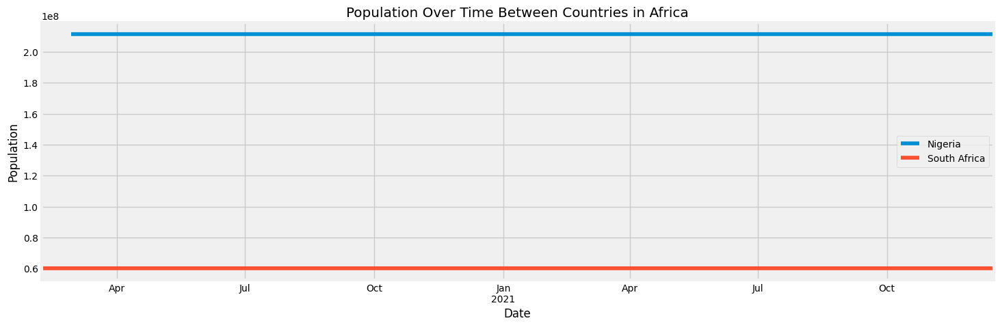

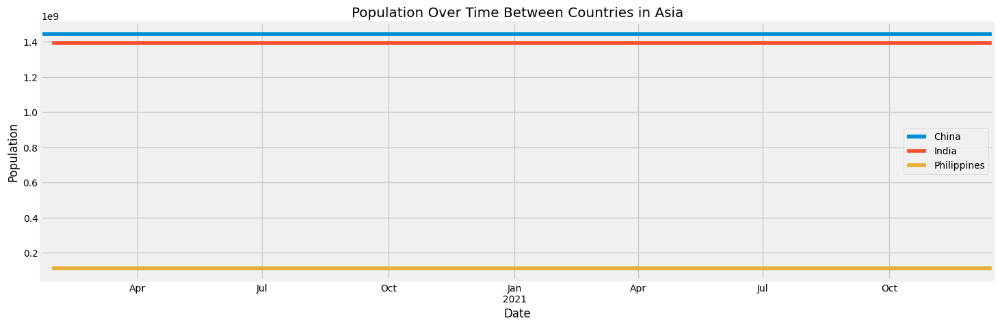

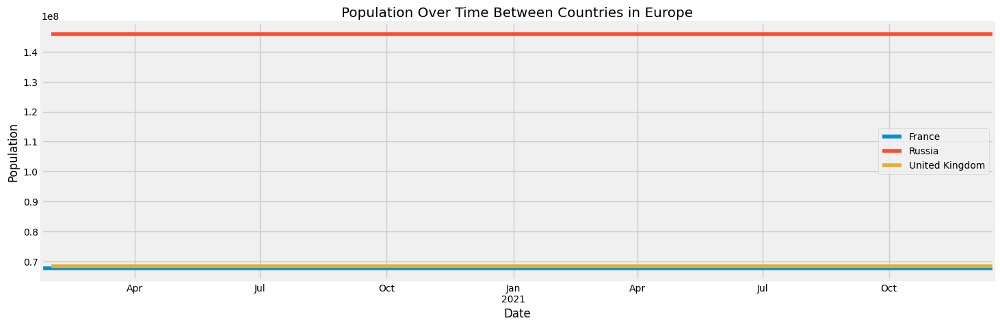

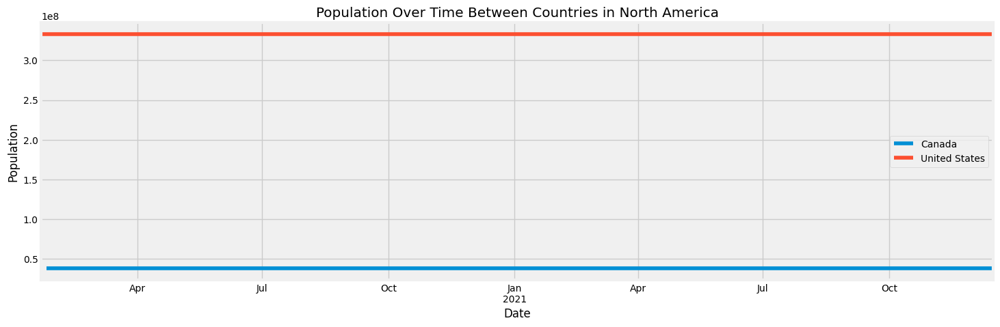

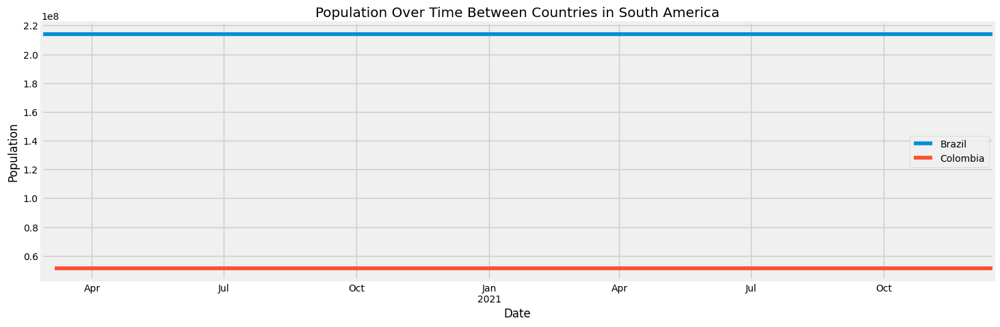

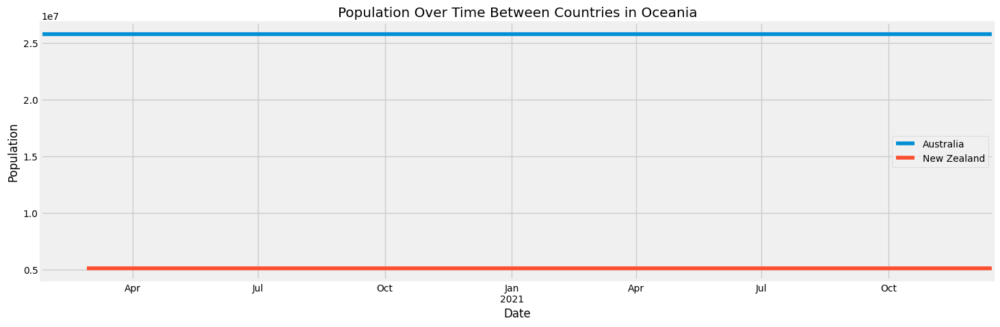

In [91]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['population'].plot(legend='True')
  title = 'Population Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Population')
  plt.show()

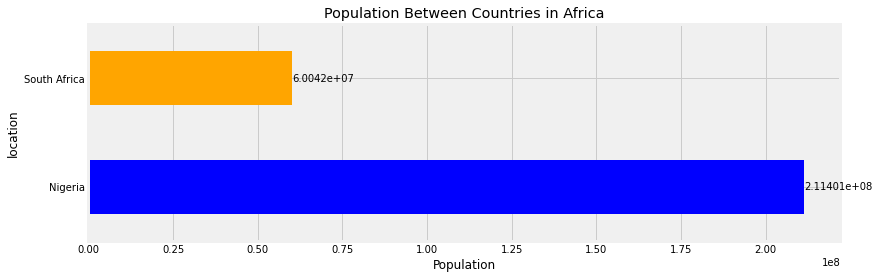

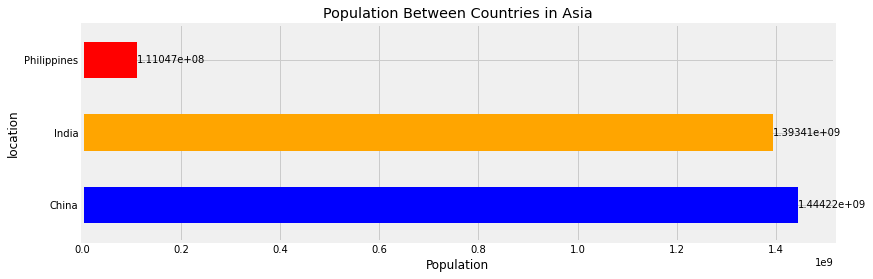

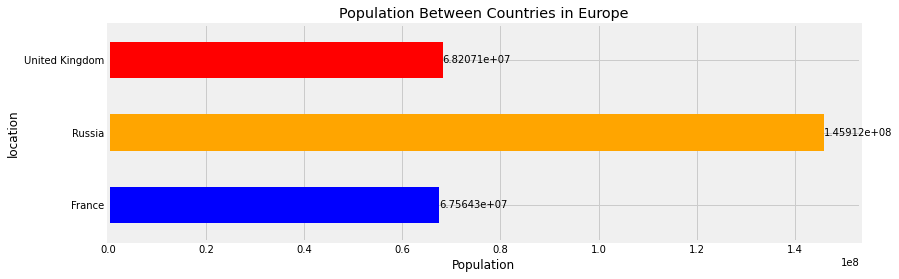

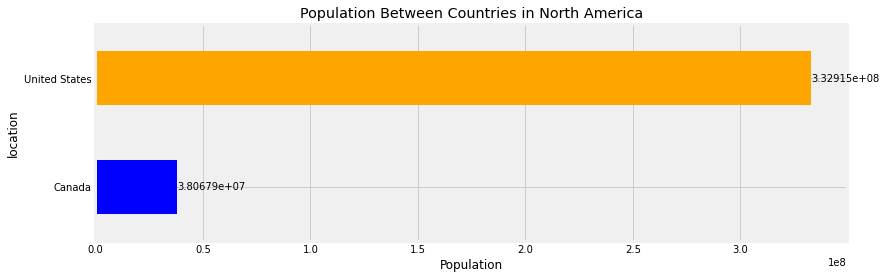

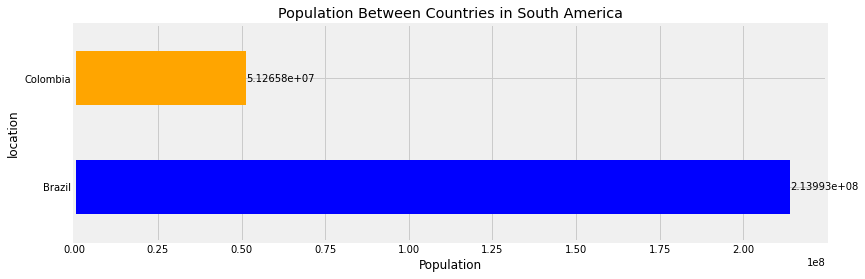

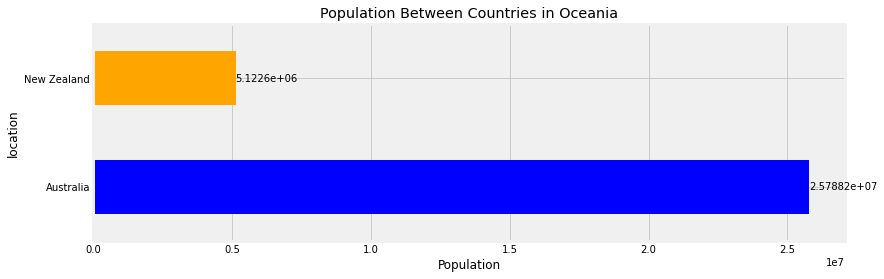

In [143]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Population Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Population")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Population Density Between Countries

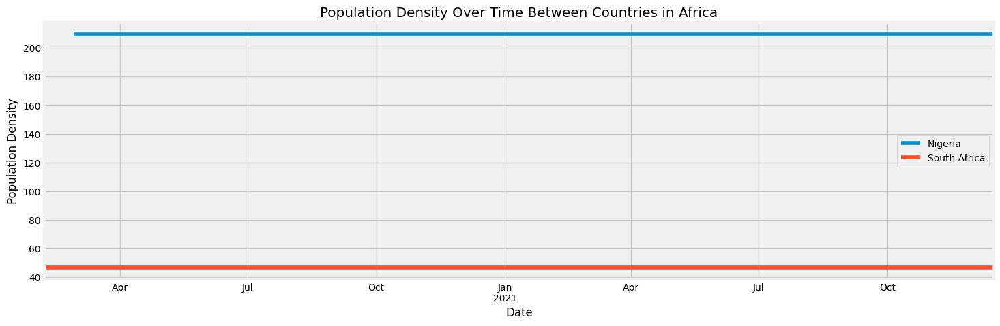

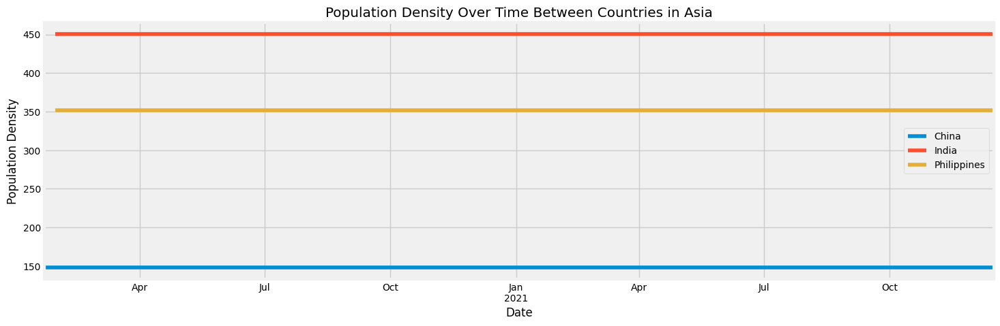

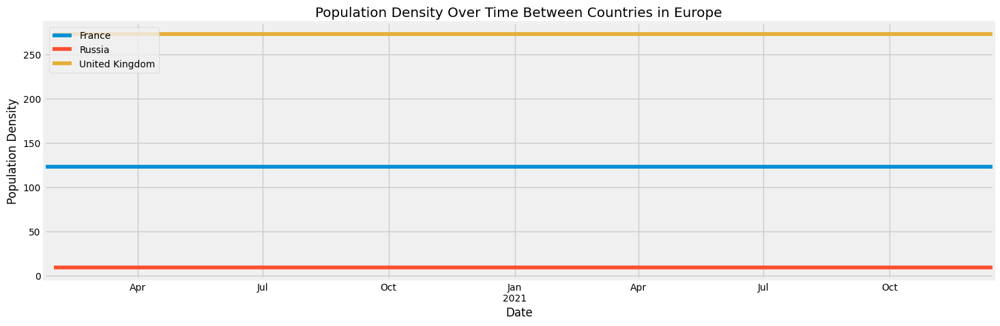

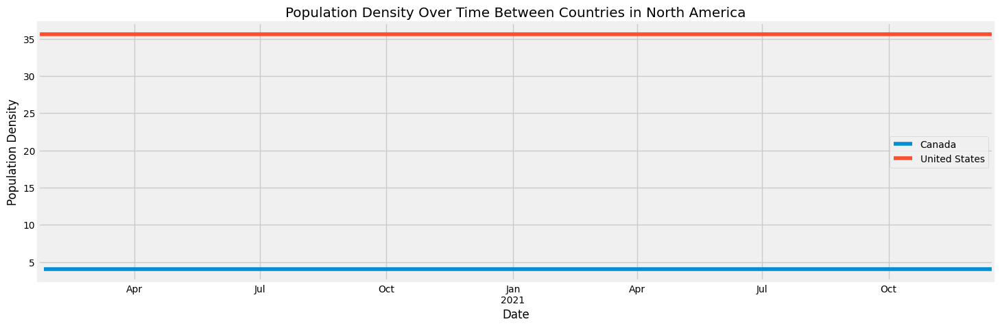

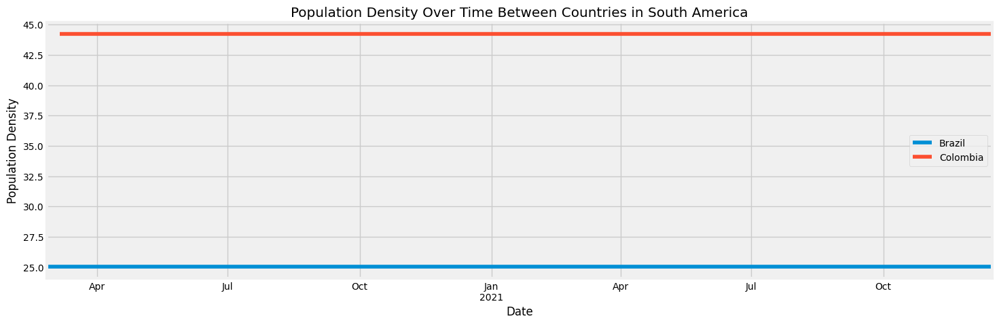

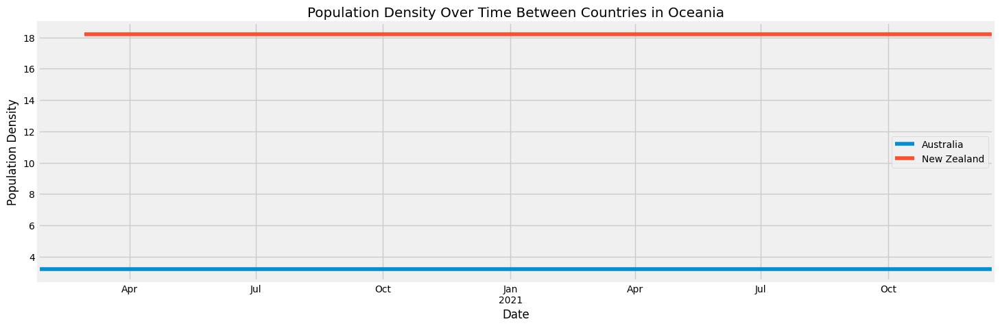

In [94]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['population_density'].plot(legend='True')
  title = 'Population Density Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Population Density')
  plt.show()

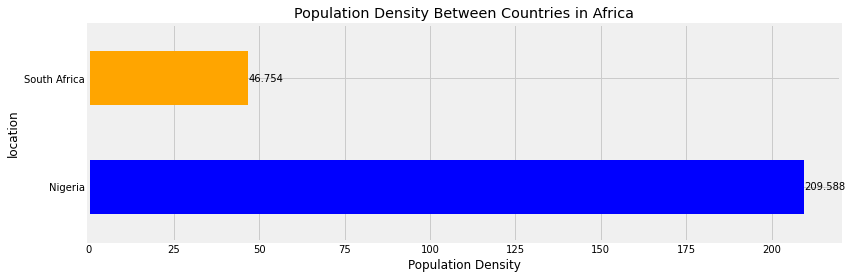

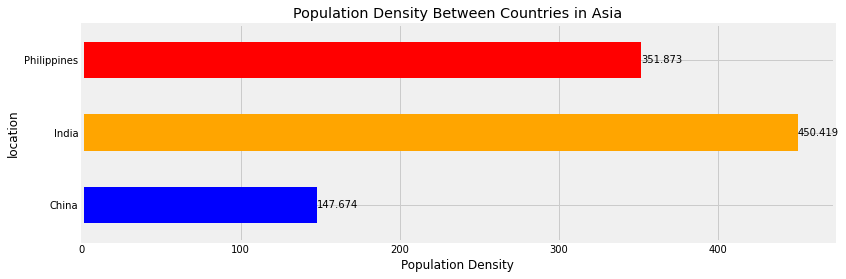

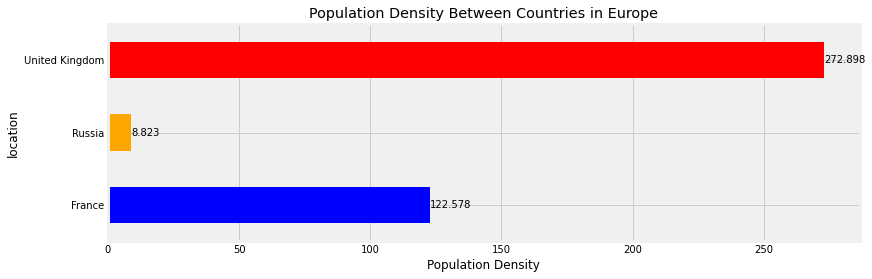

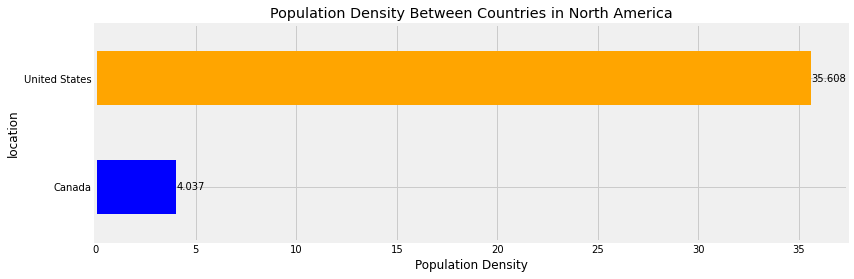

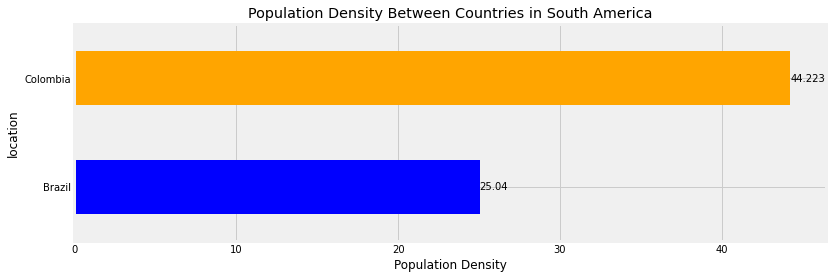

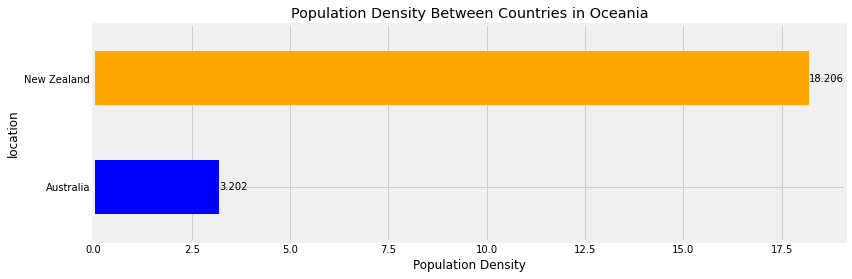

In [142]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["population_density"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Population Density Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Population Density")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Countries



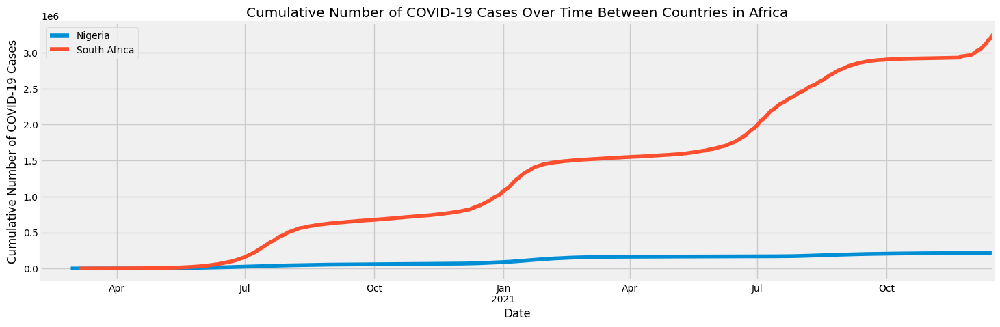

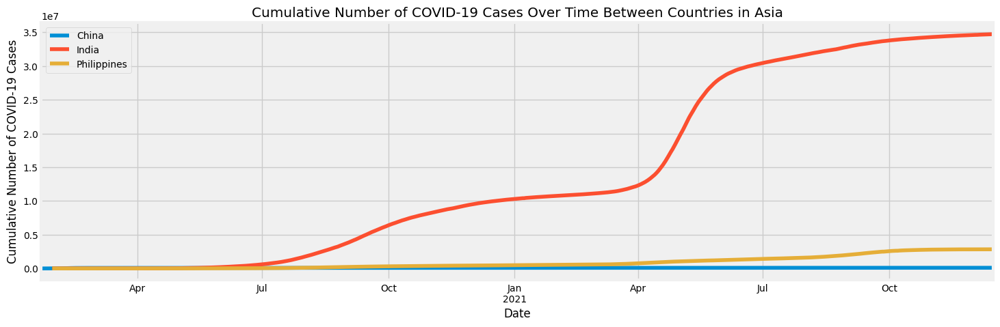

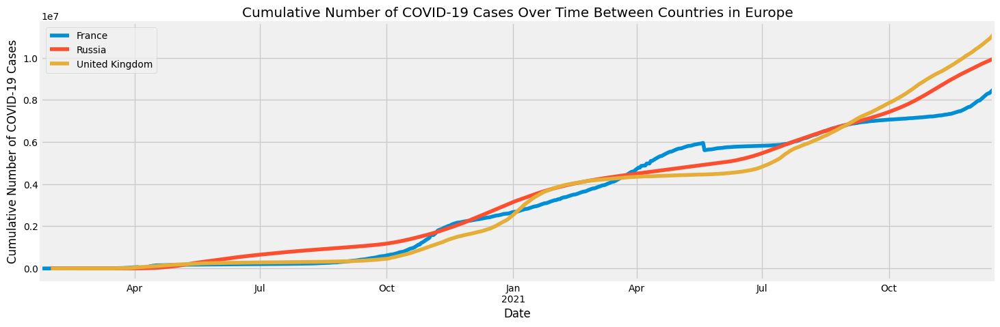

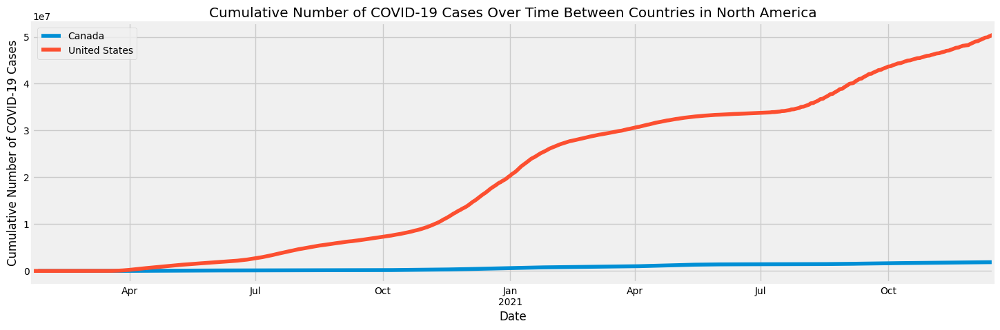

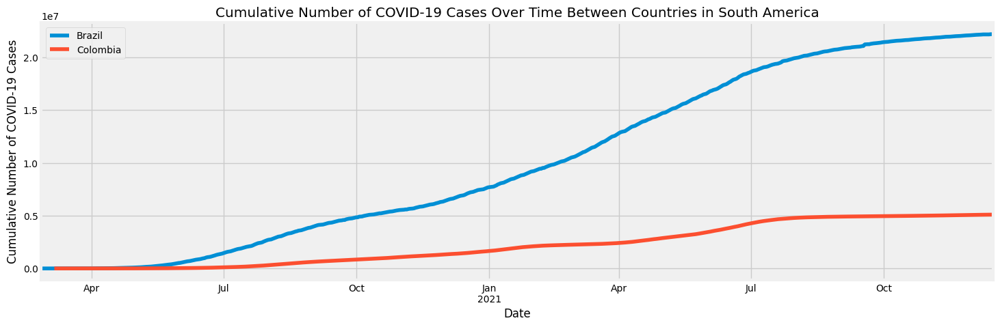

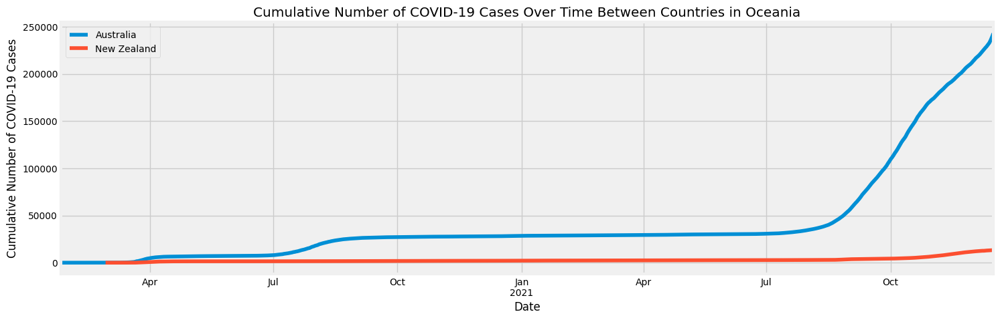

In [98]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_cases'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
  plt.show()

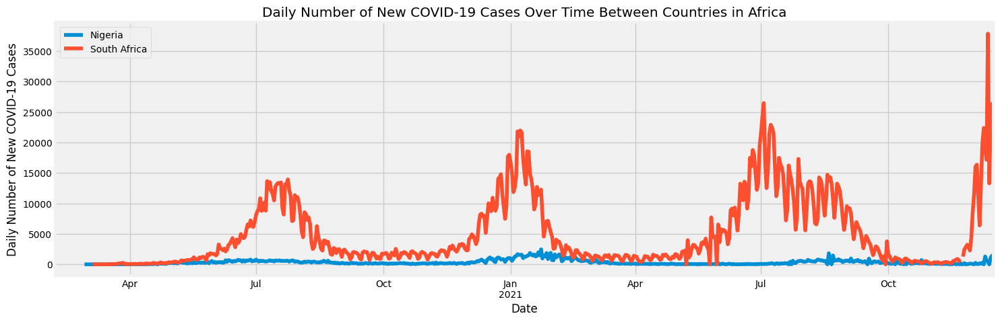

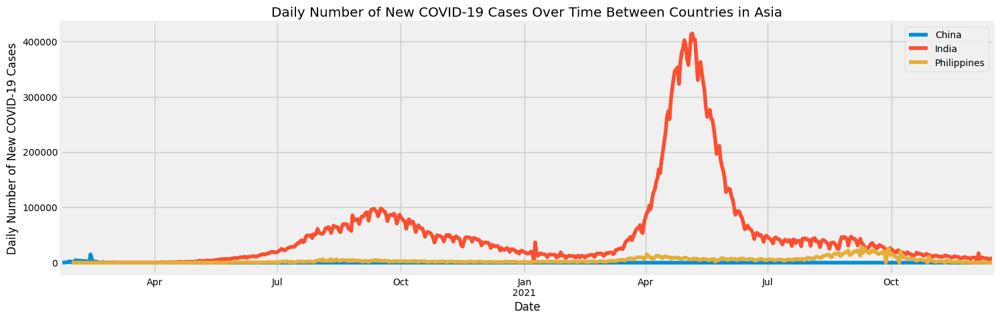

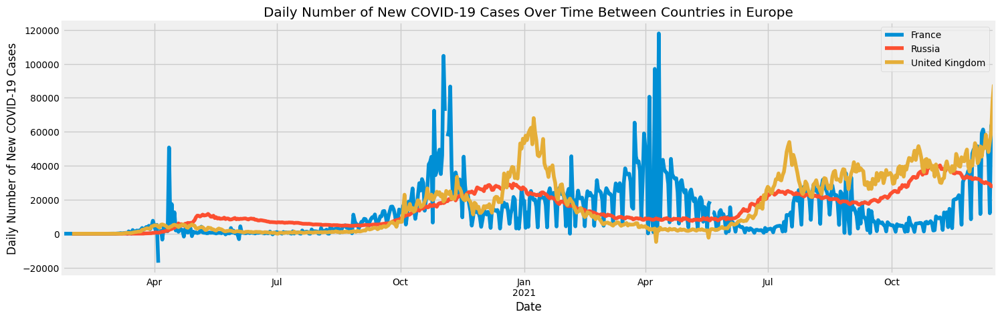

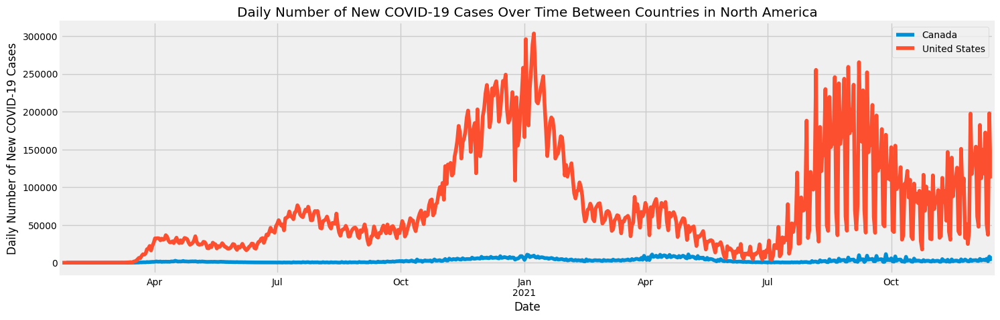

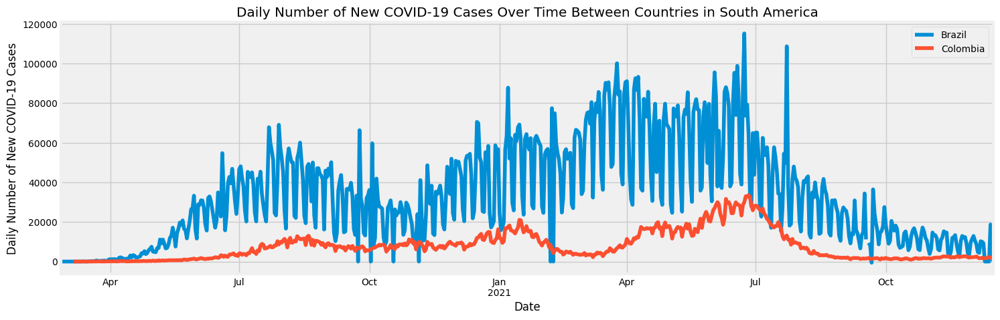

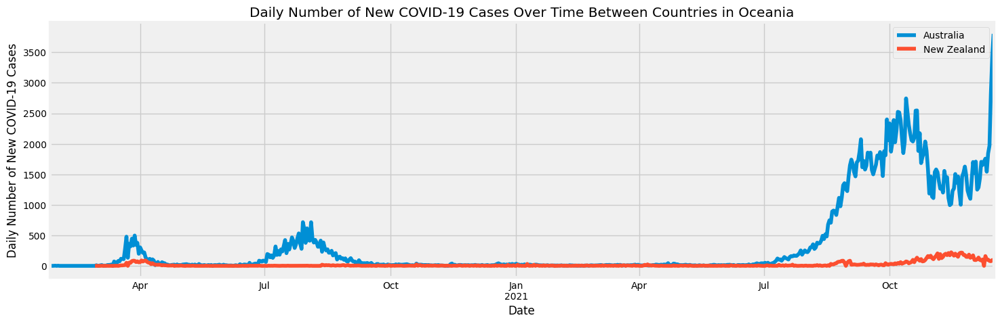

In [99]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_cases'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
  plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Countries

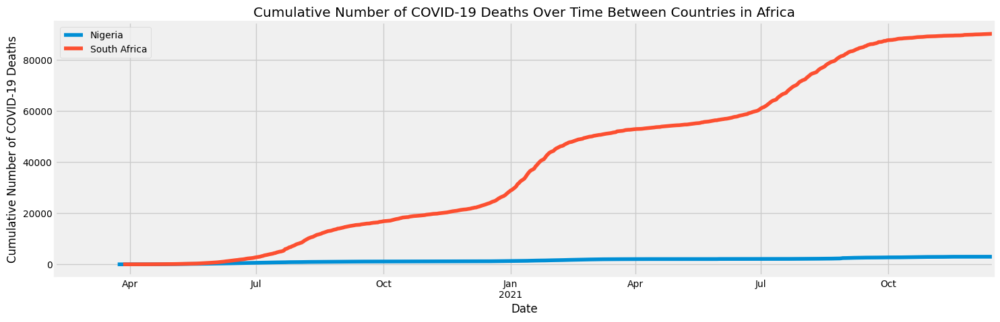

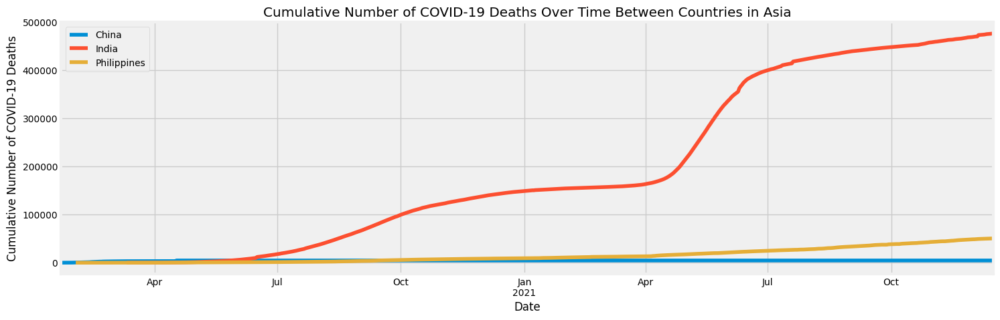

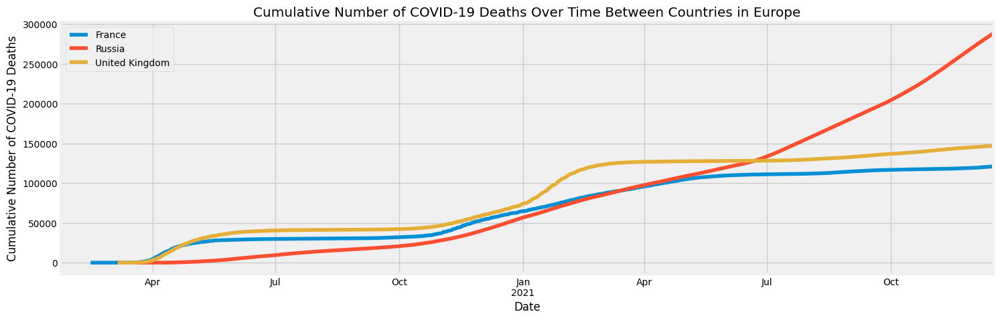

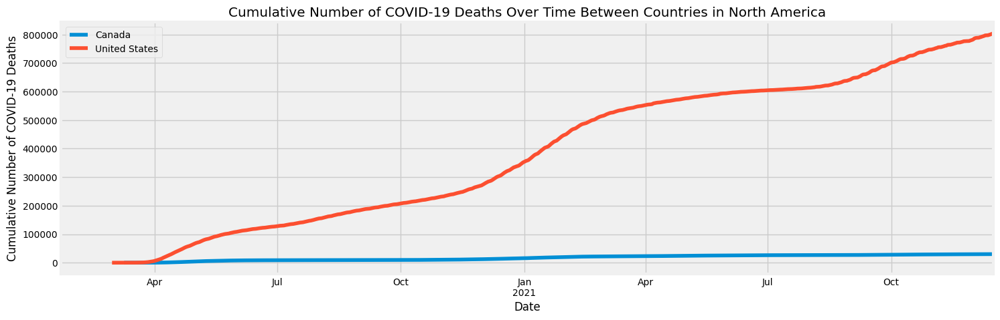

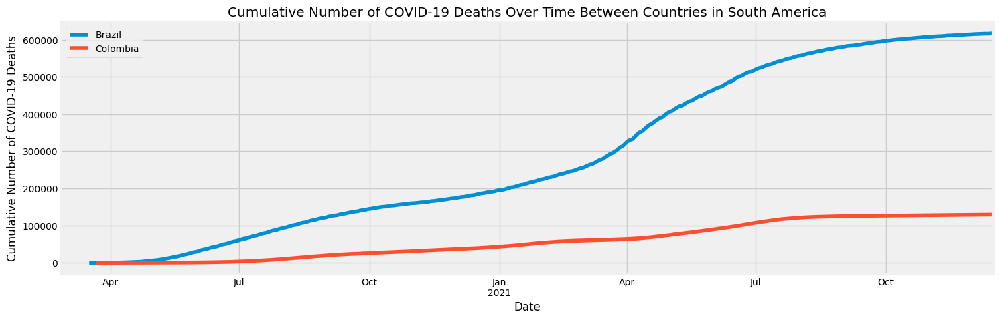

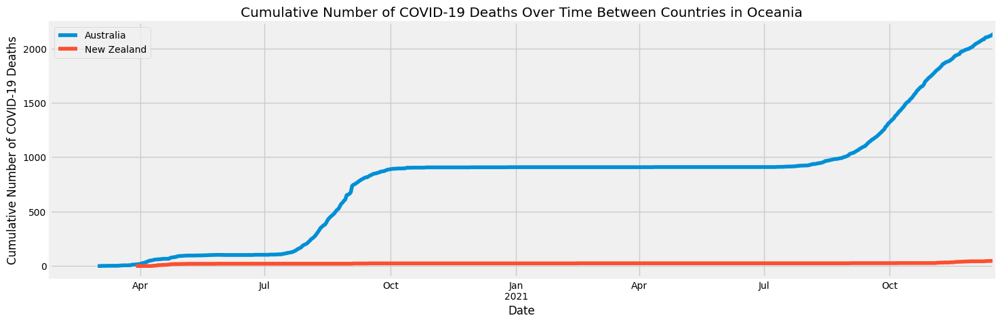

In [100]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_deaths'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Deaths Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
  plt.show()

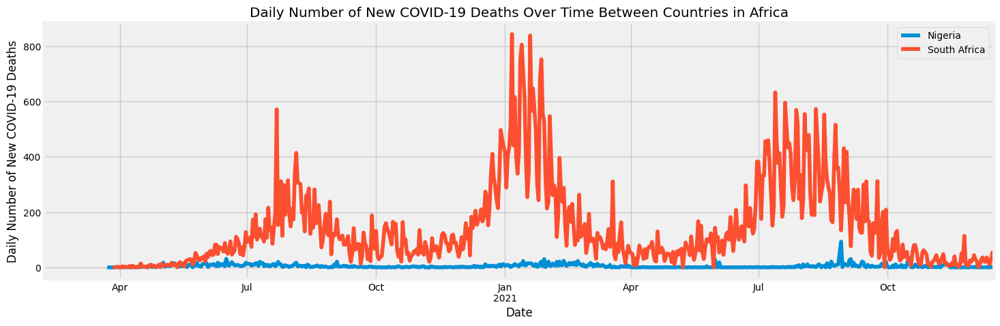

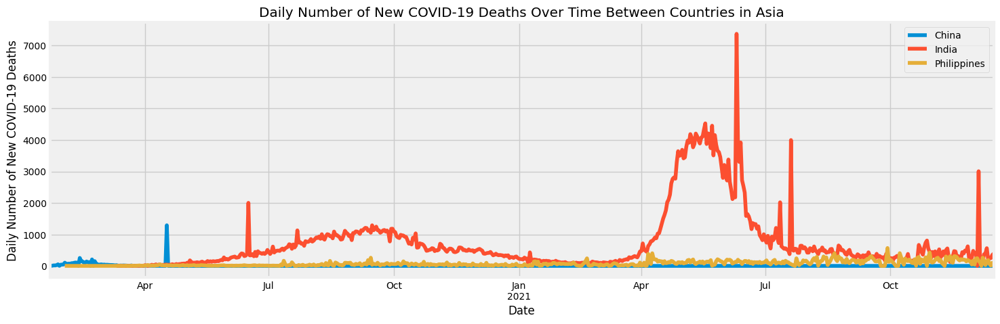

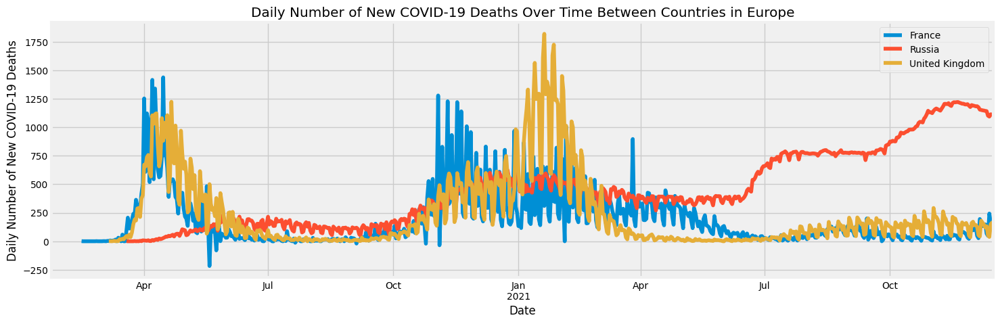

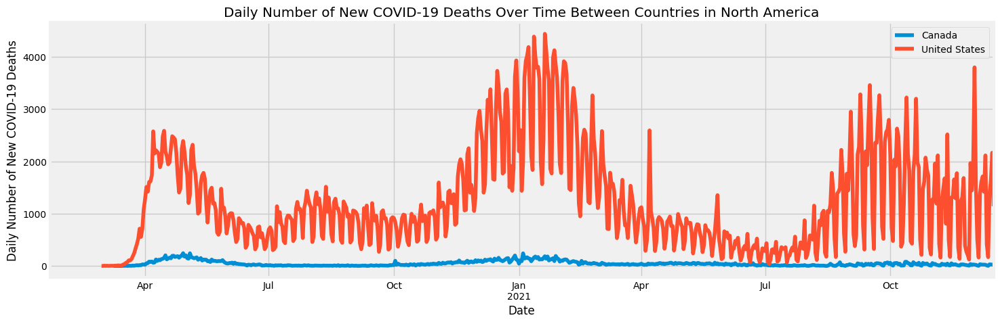

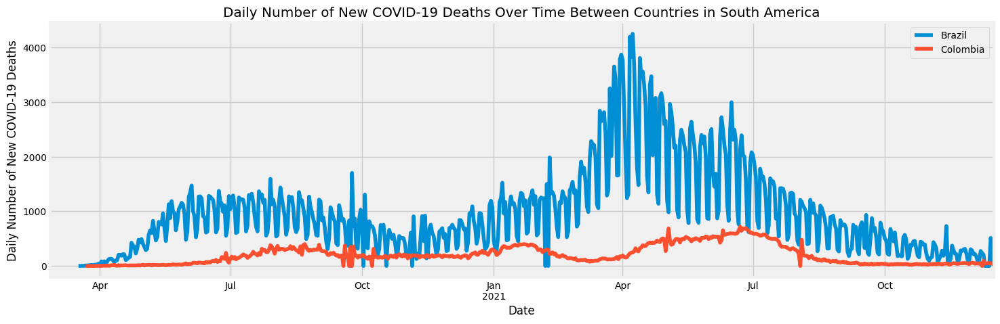

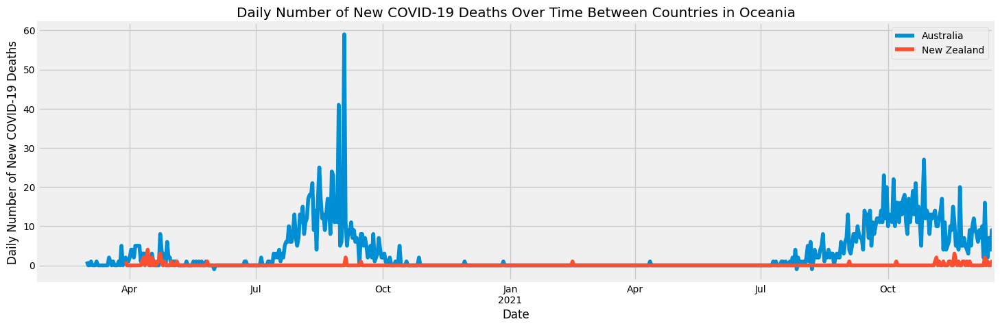

In [101]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_deaths'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Deaths Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
  plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Over Time Between Countries

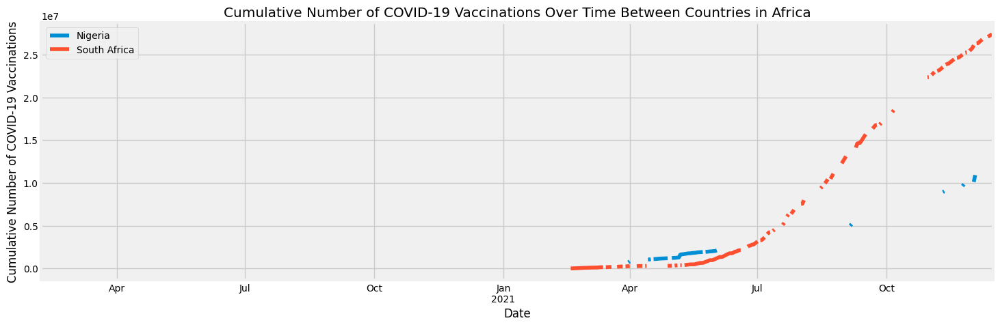

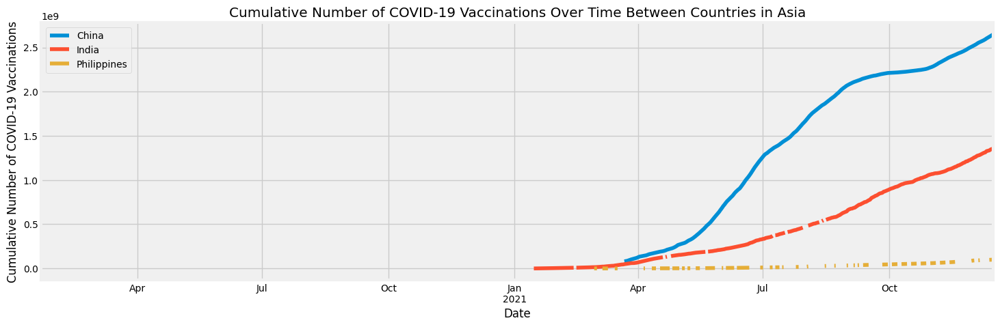

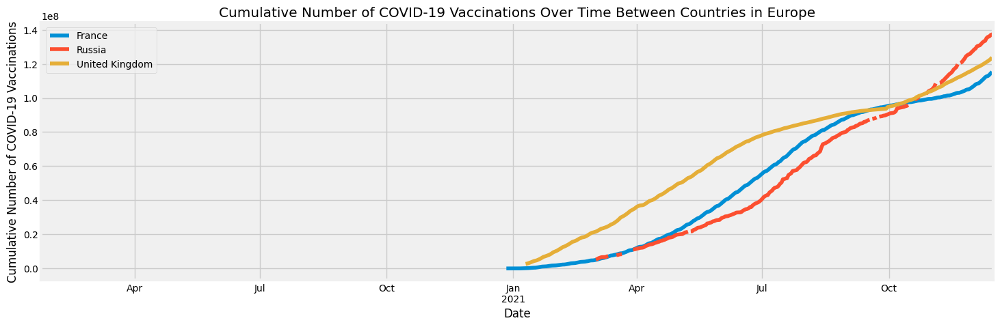

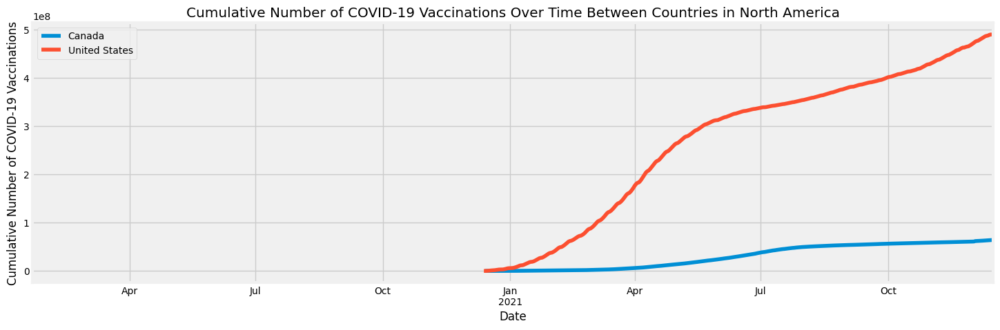

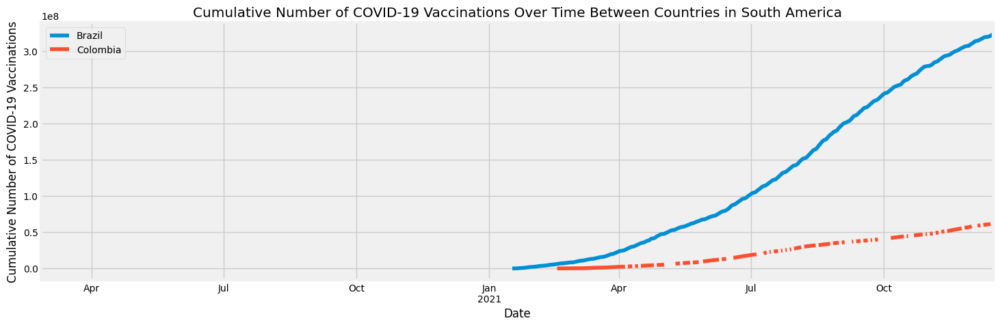

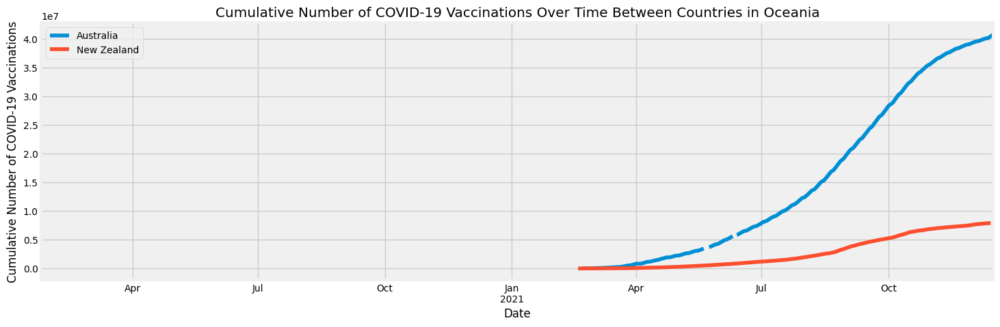

In [102]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_vaccinations'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
  plt.show()

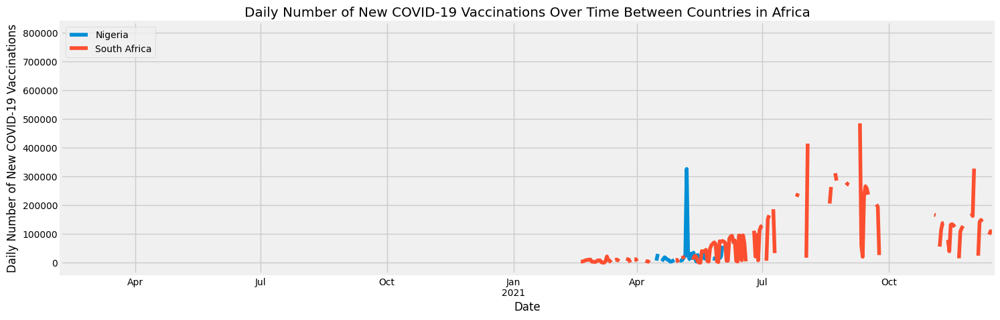

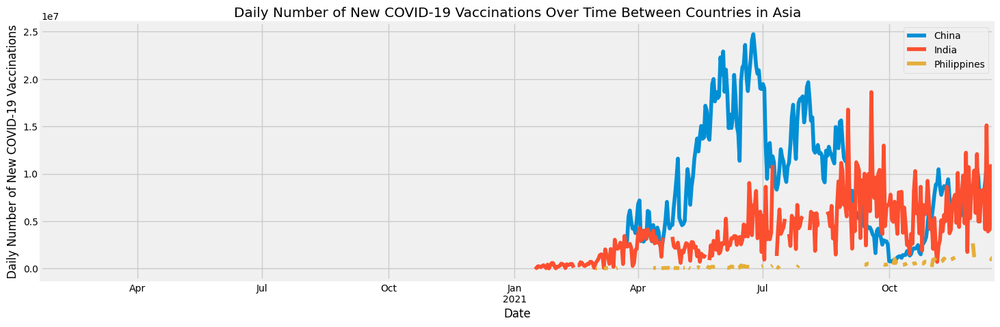

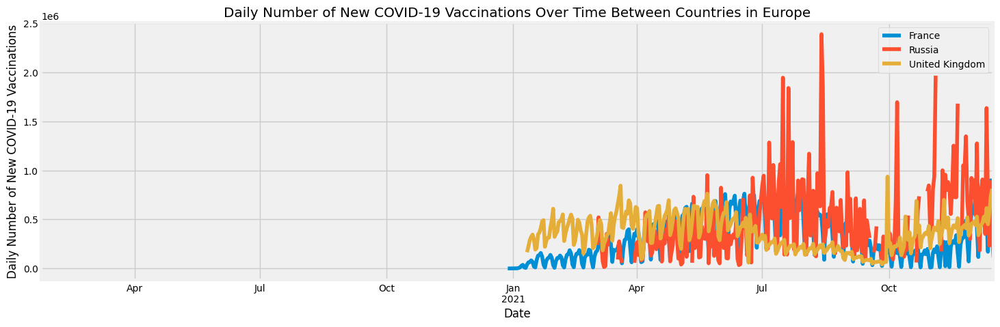

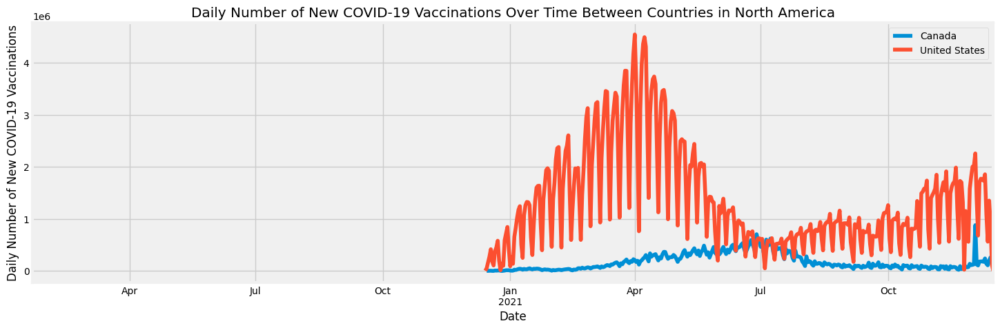

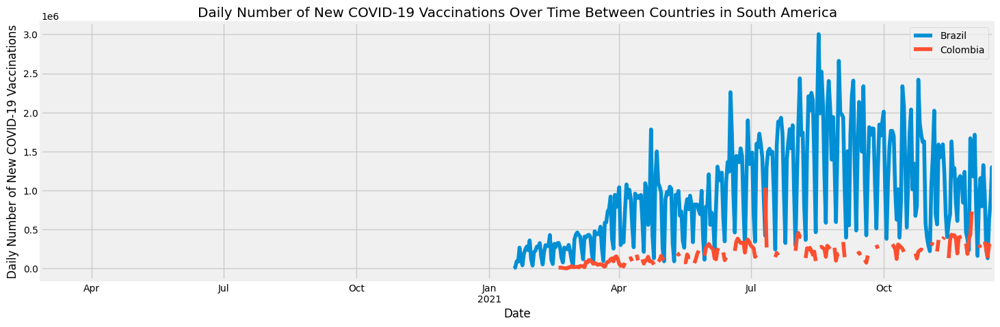

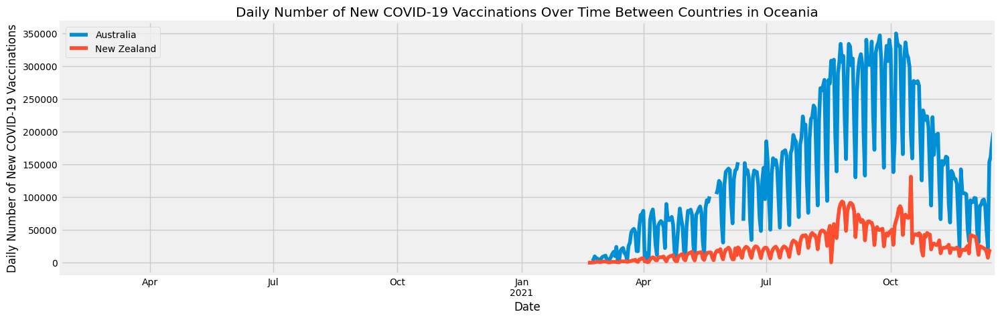

In [103]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_vaccinations'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
  plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Between Countries

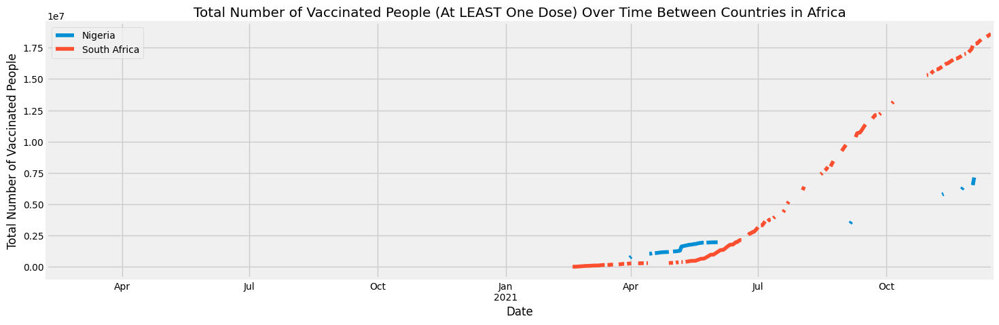

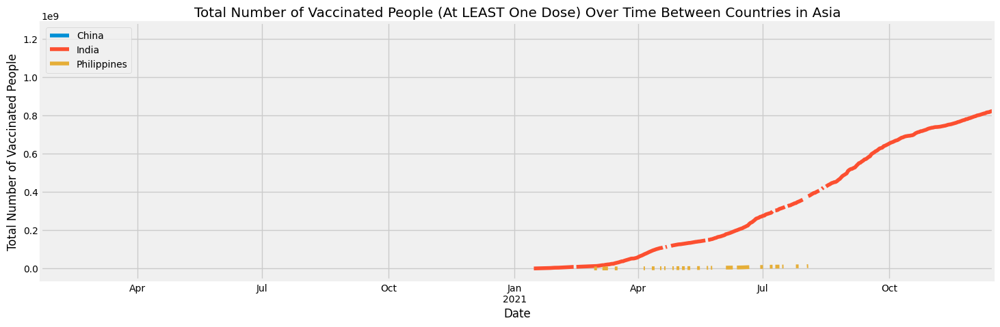

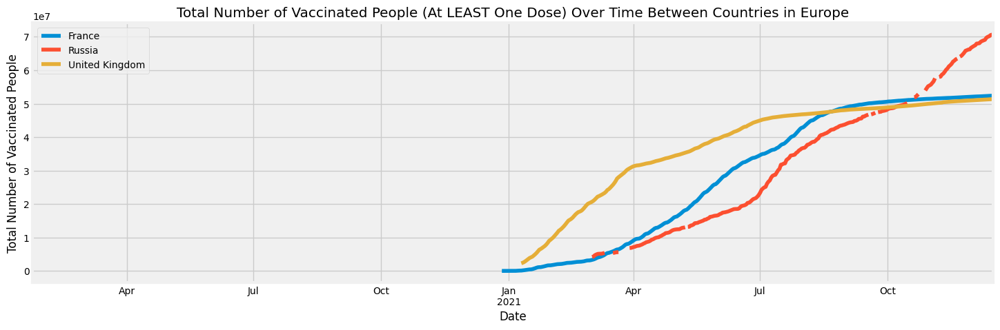

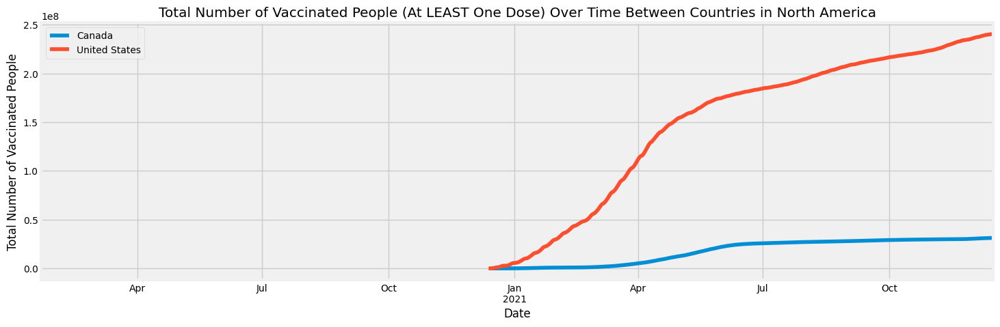

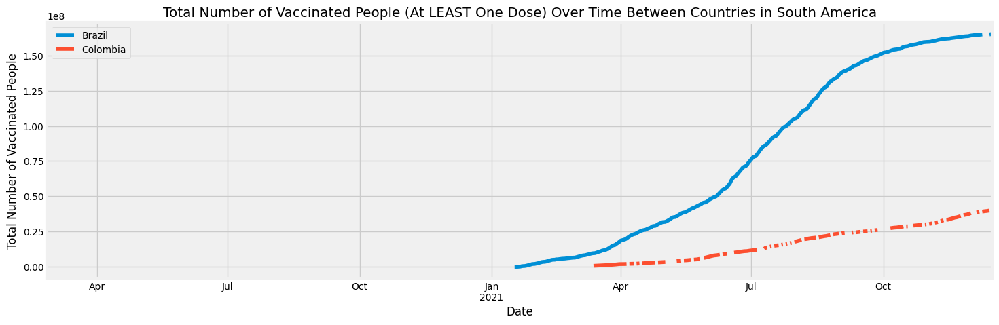

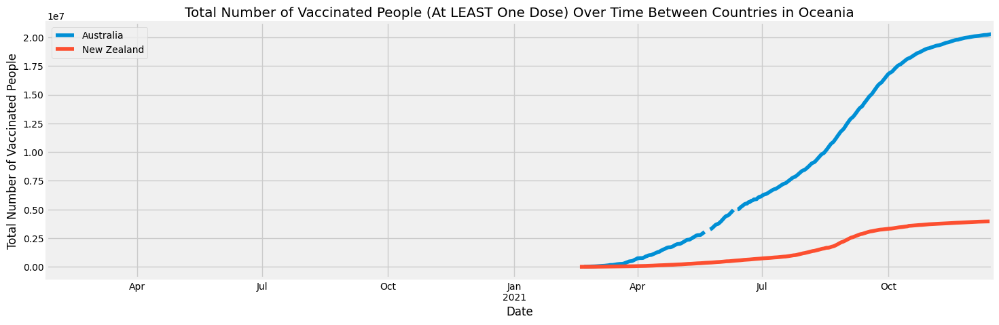

In [104]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['people_vaccinated'].plot(legend='True')
  title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Total Number of Vaccinated People')
  plt.show()

## Total Number of FULLY Vaccinated People Between Countries

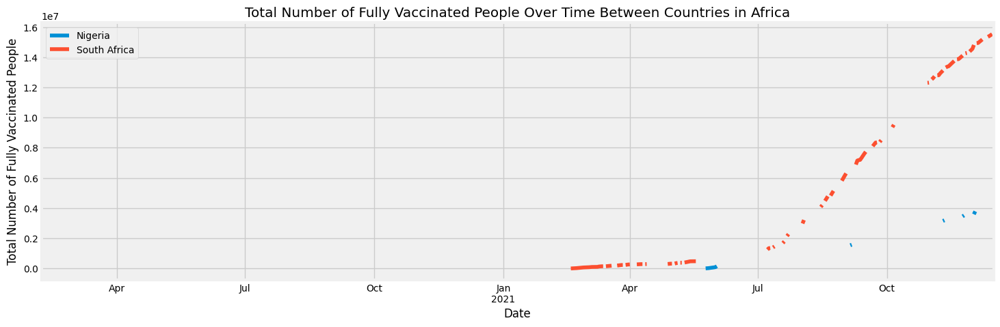

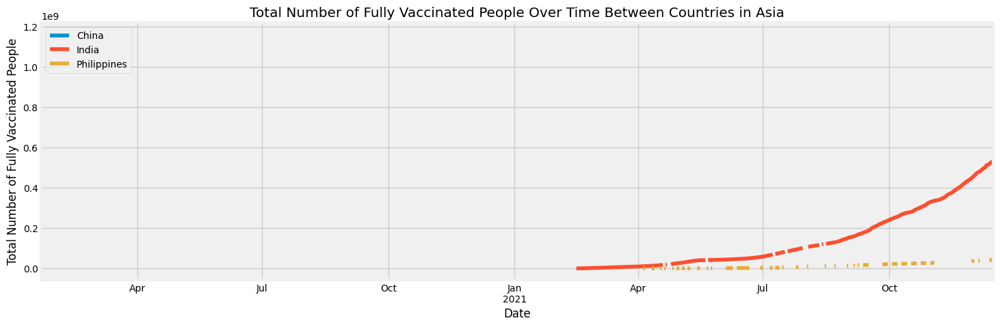

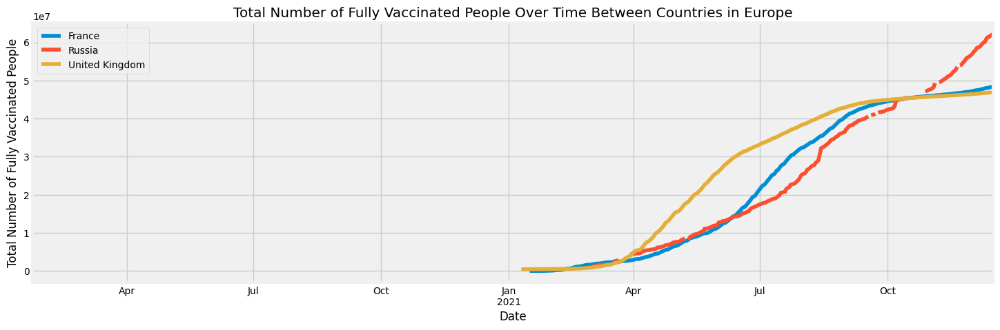

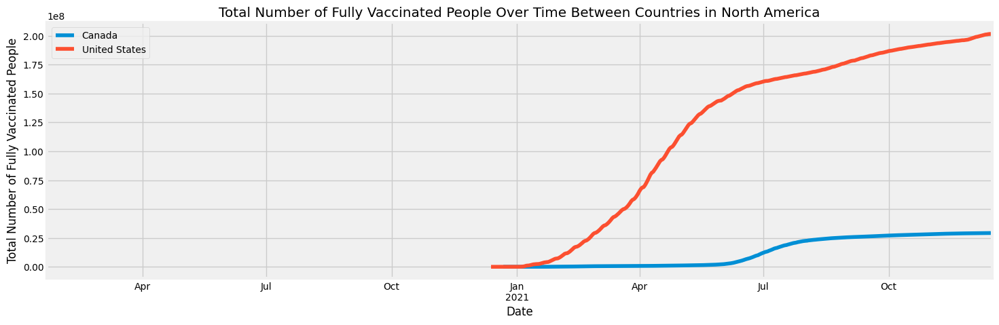

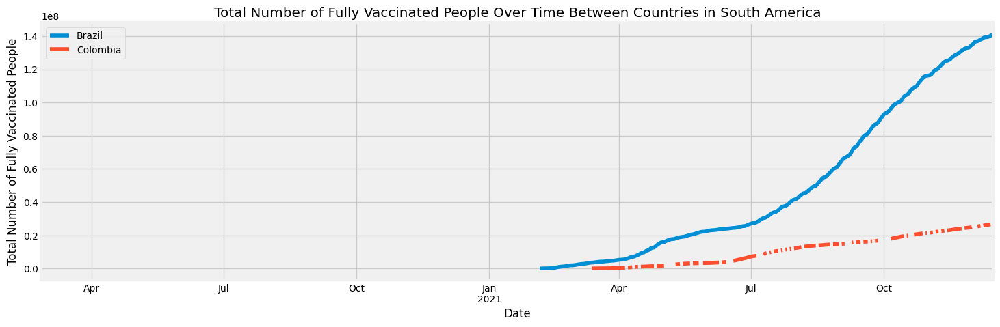

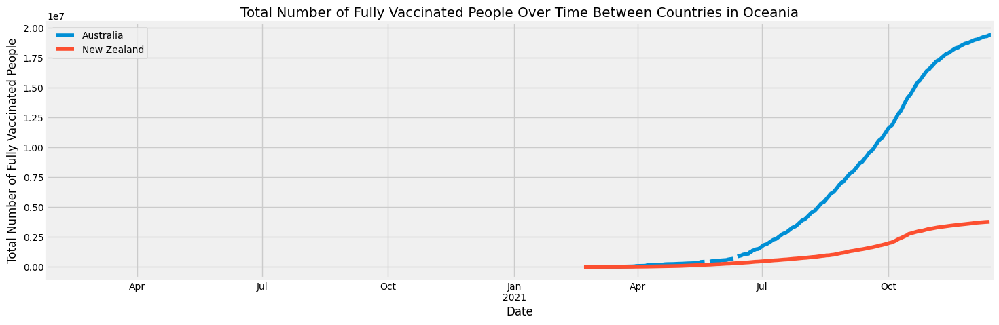

In [105]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['people_fully_vaccinated'].plot(legend='True')
  title = 'Total Number of Fully Vaccinated People Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
  plt.show()

## Cumulative Number of COVID-19 Tests Between Countries

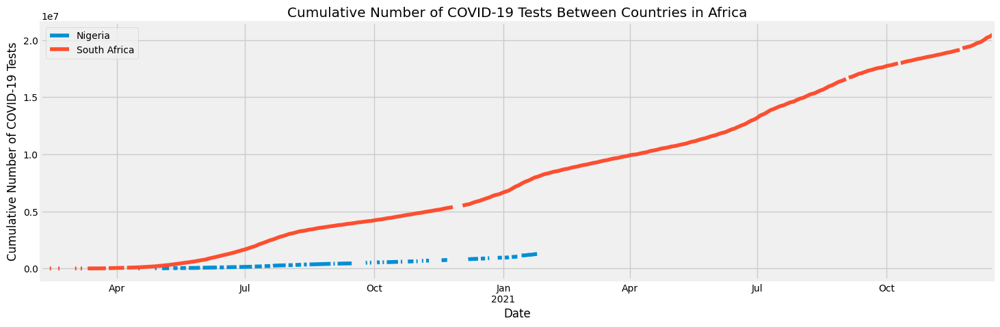

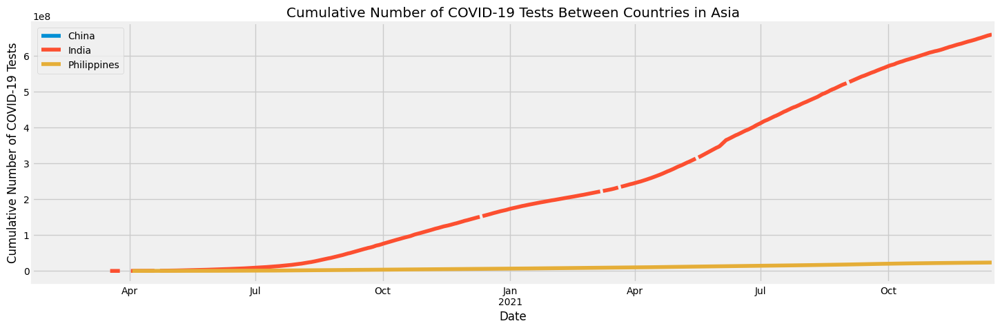

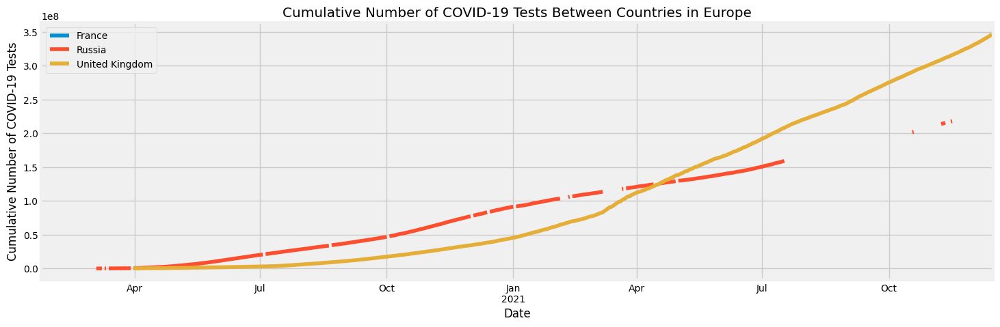

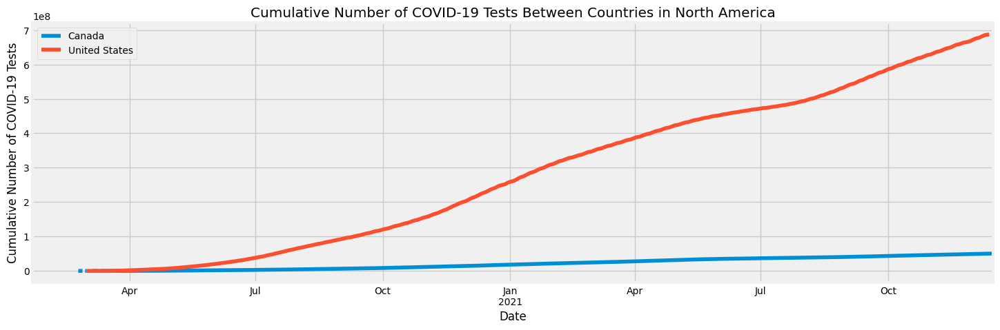

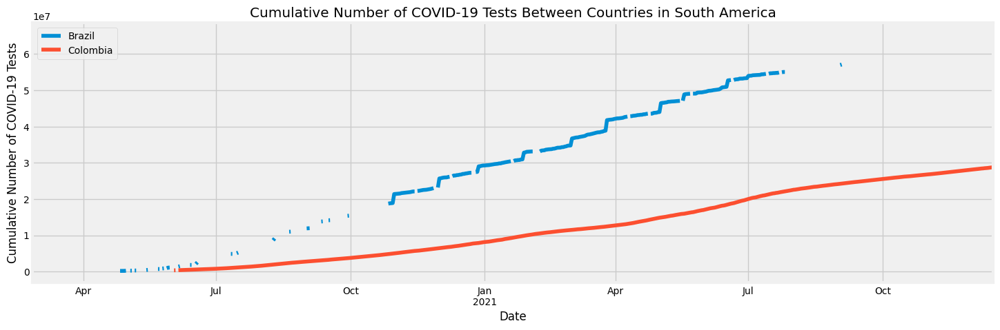

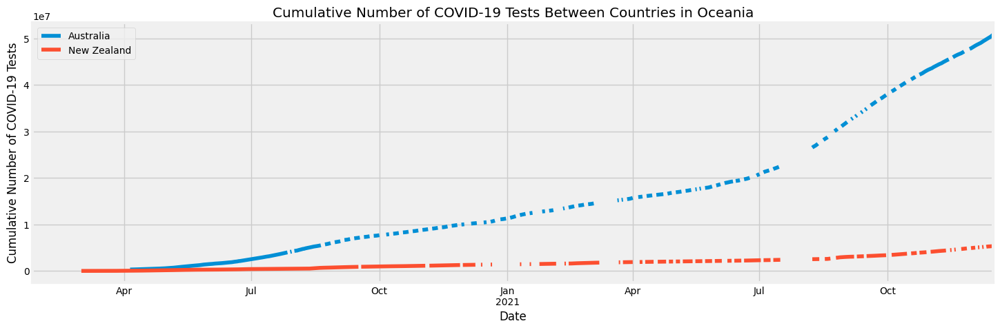

In [106]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['total_tests'].plot(legend='True')
  title = 'Cumulative Number of COVID-19 Tests Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Cumulative Number of COVID-19 Tests')
  plt.show()

# Daily New Number of COVID-19 Test Between Countries

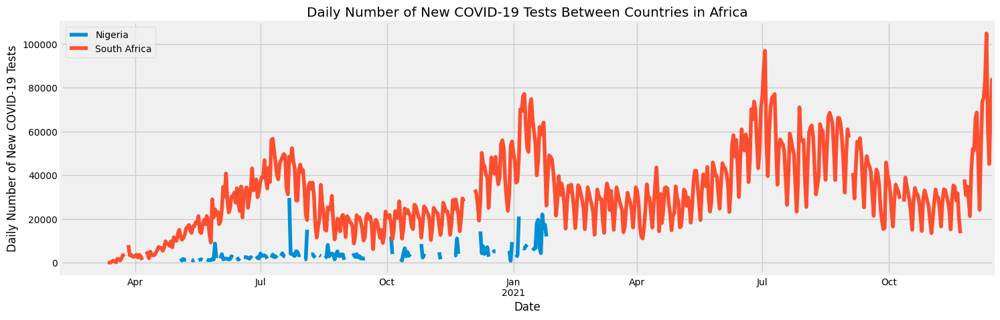

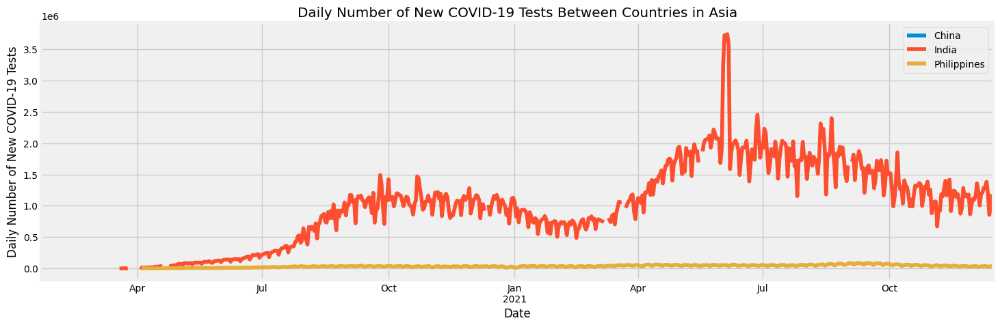

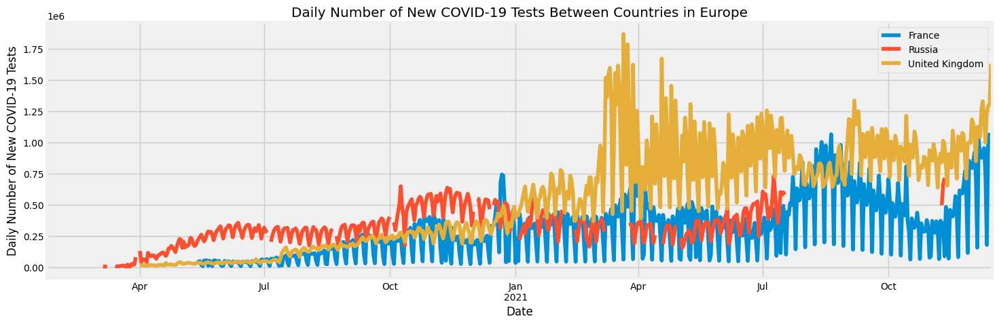

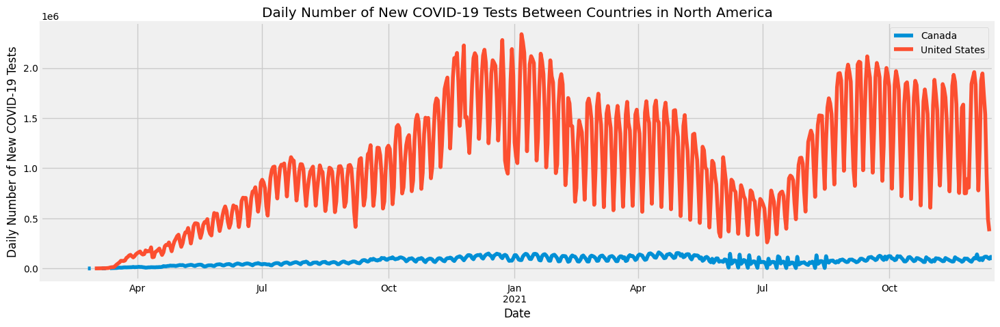

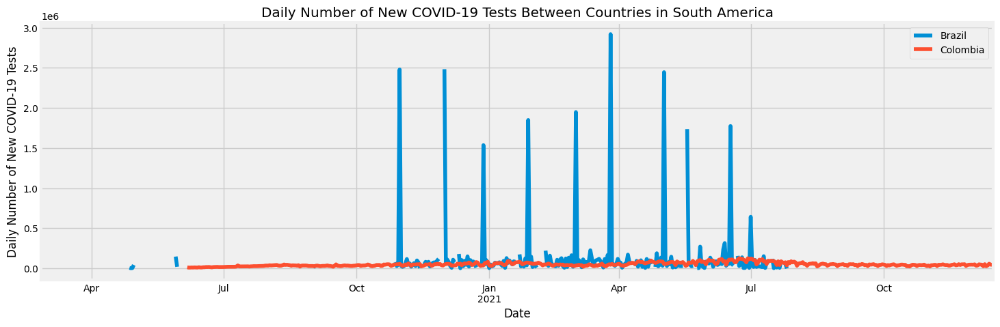

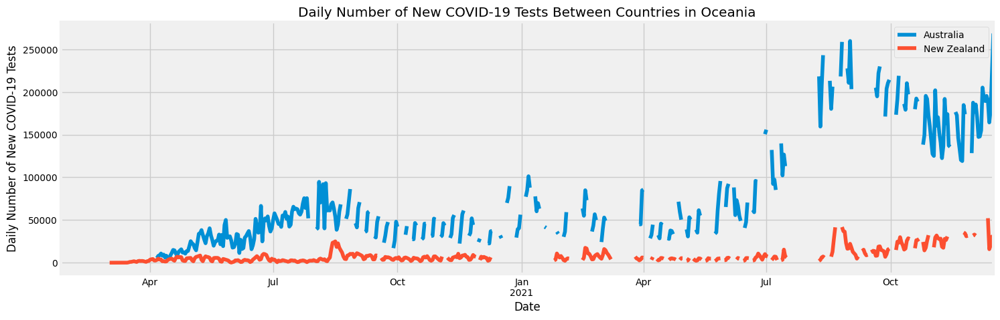

In [107]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['new_tests'].plot(legend='True')
  title = 'Daily Number of New COVID-19 Tests Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Daily Number of New COVID-19 Tests')
  plt.show()

## Percentage of COVID-19 Tests that are Positive Between Countries

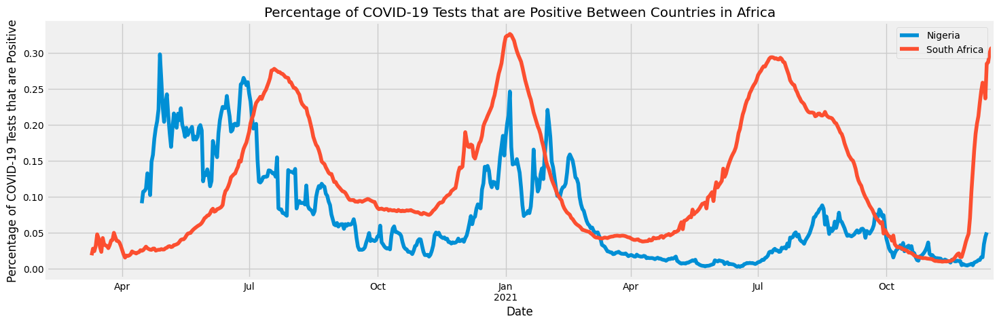

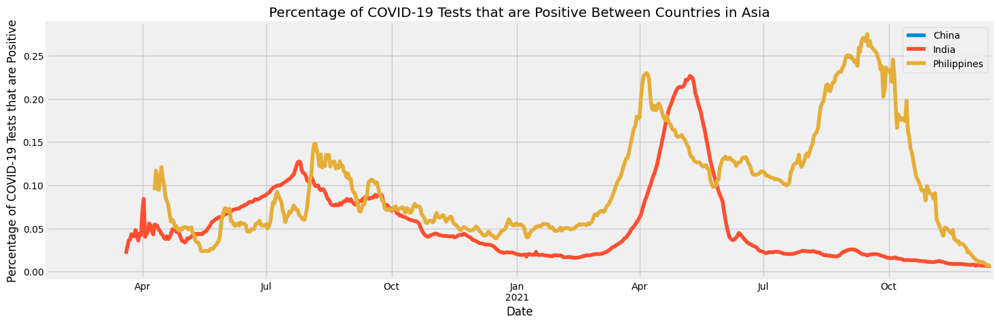

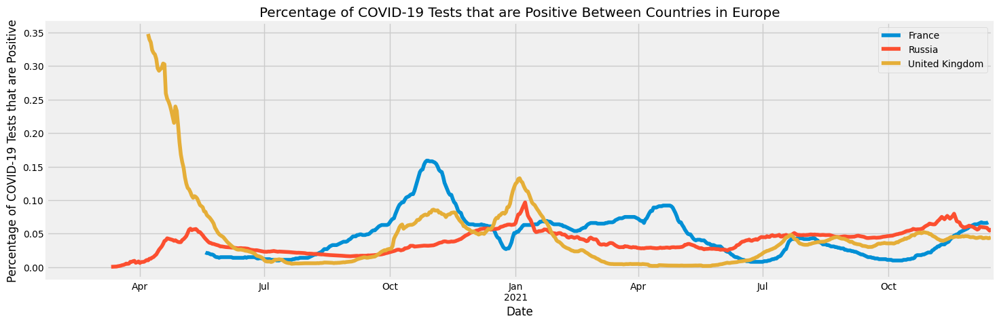

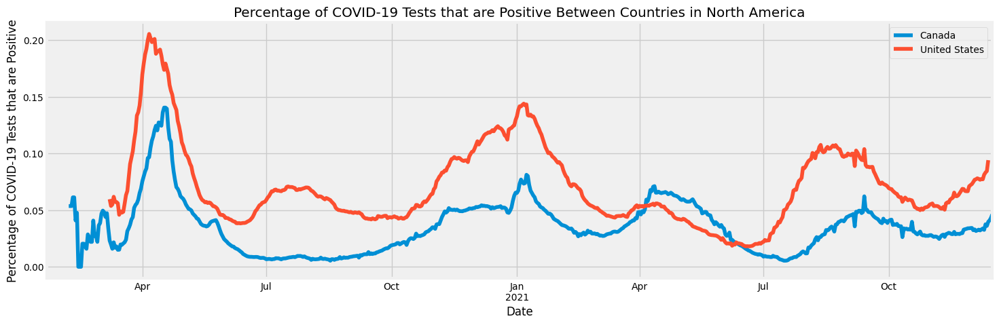

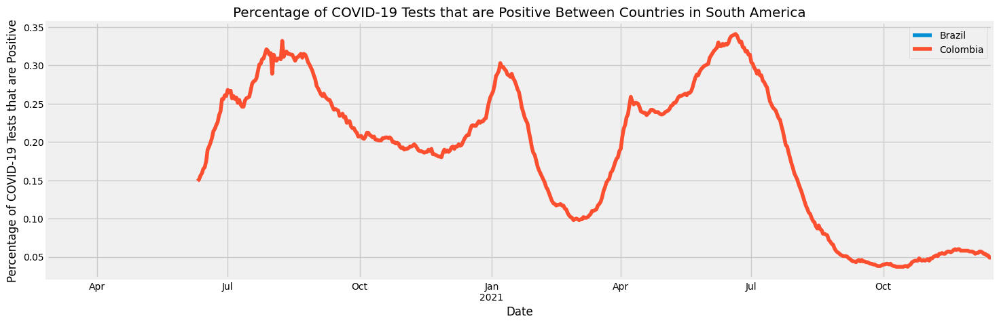

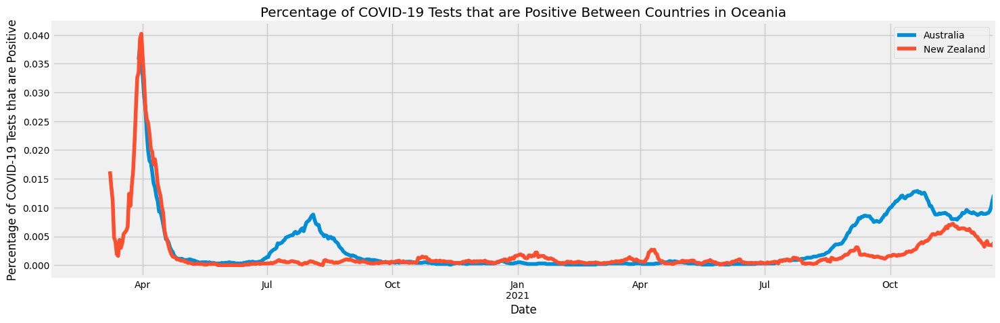

In [108]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['positive_rate'].plot(legend='True')
  title = 'Percentage of COVID-19 Tests that are Positive Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Percentage of COVID-19 Tests that are Positive')
  plt.show()

## Tests per New Confirmed Case of COVID-19 Between Countries

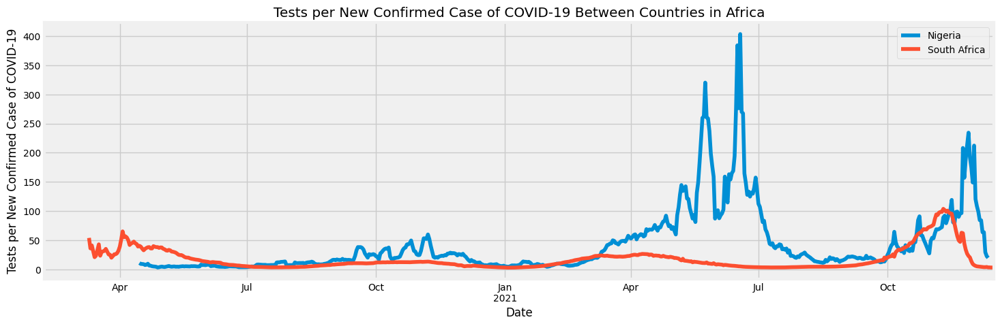

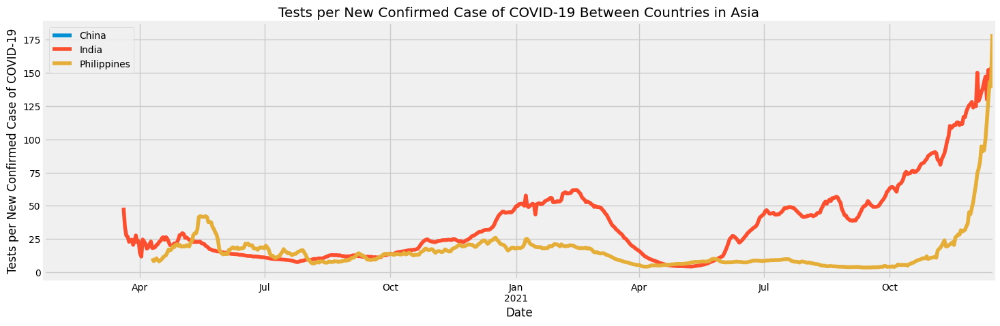

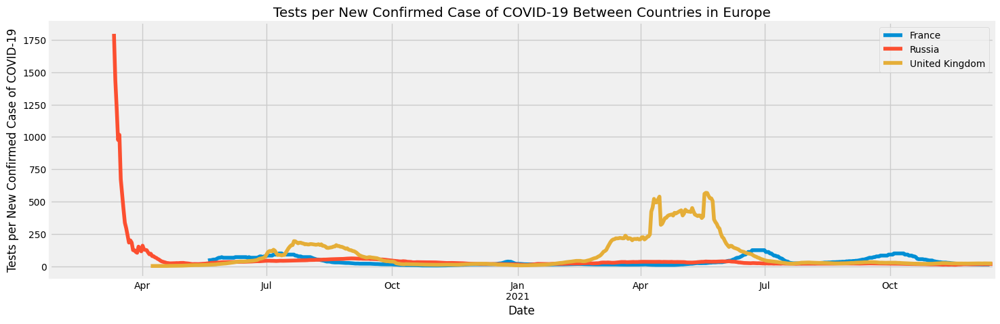

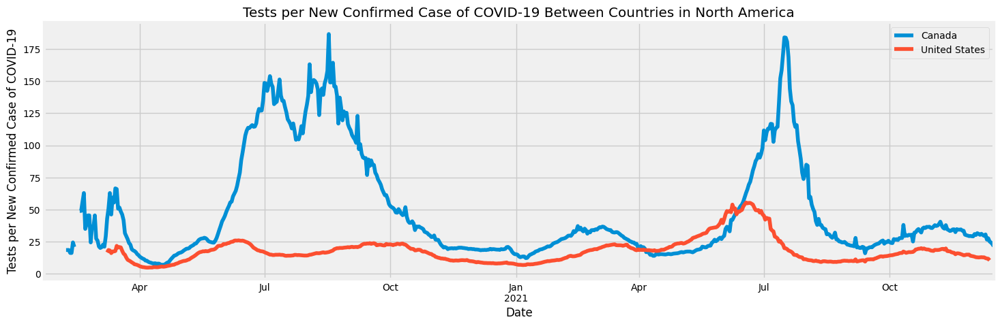

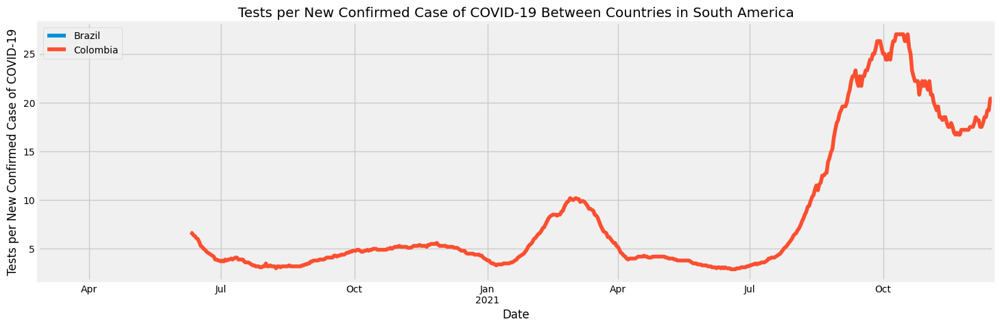

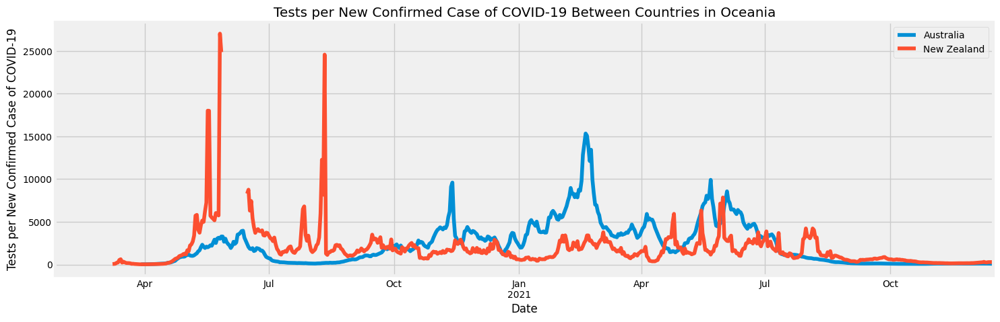

In [109]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['tests_per_case'].plot(legend='True')
  title = 'Tests per New Confirmed Case of COVID-19 Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Tests per New Confirmed Case of COVID-19')
  plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Countries

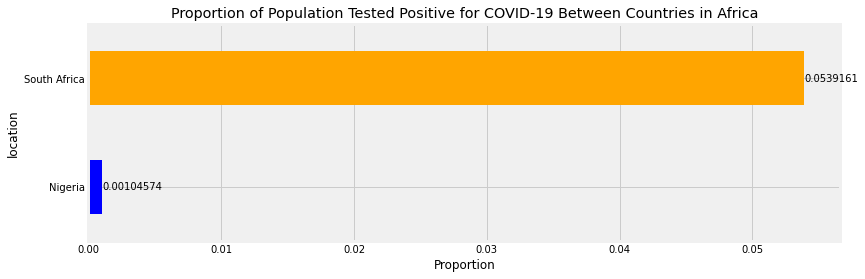

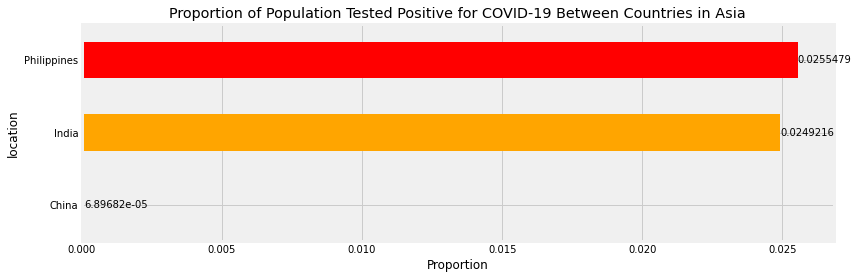

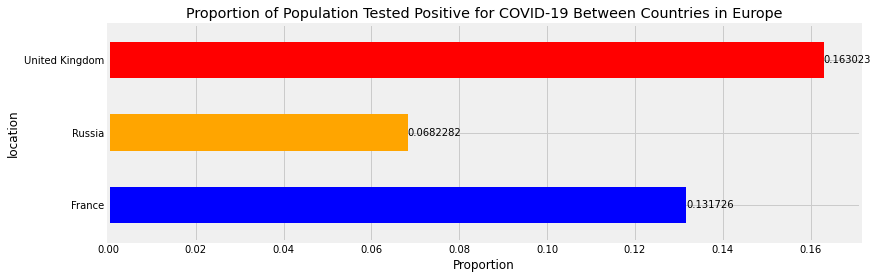

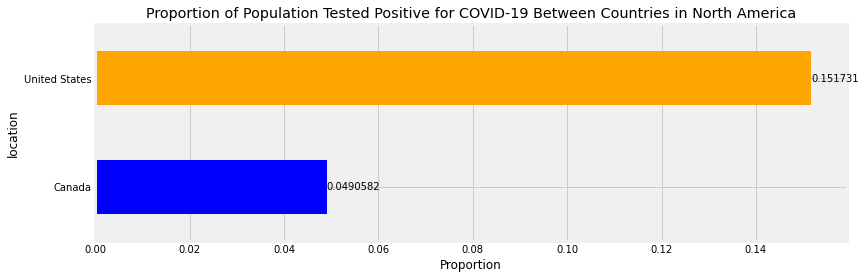

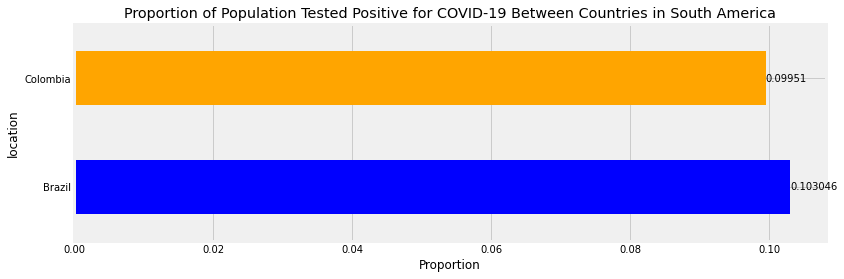

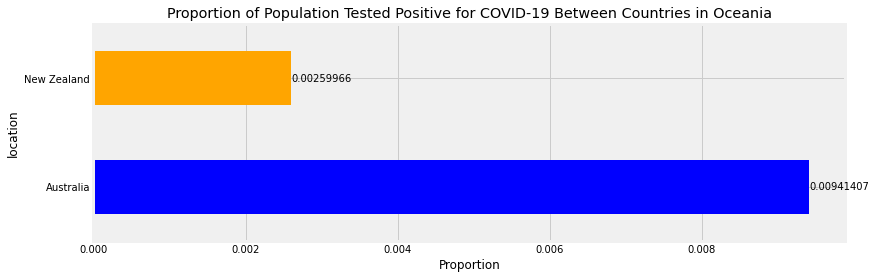

In [114]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].sum() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Population Tested Positive for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

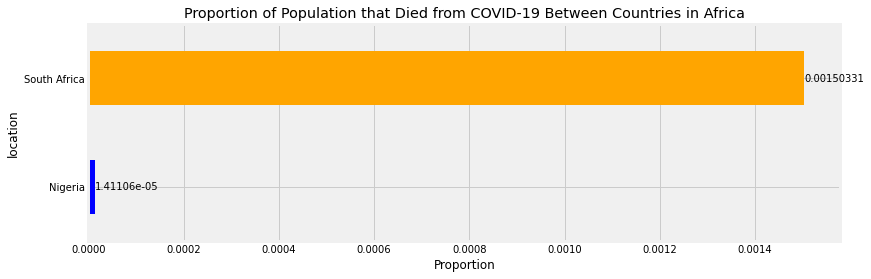

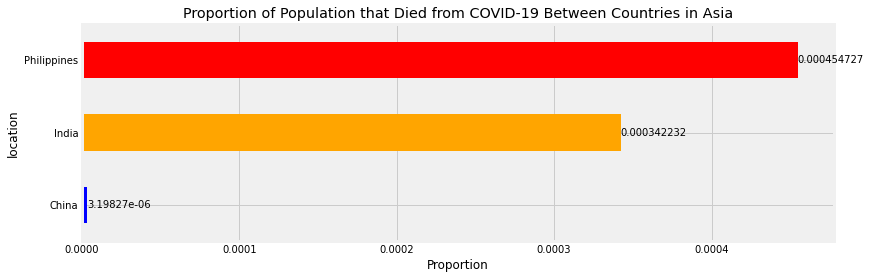

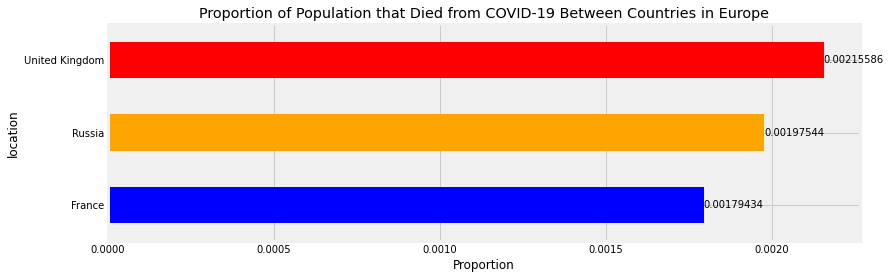

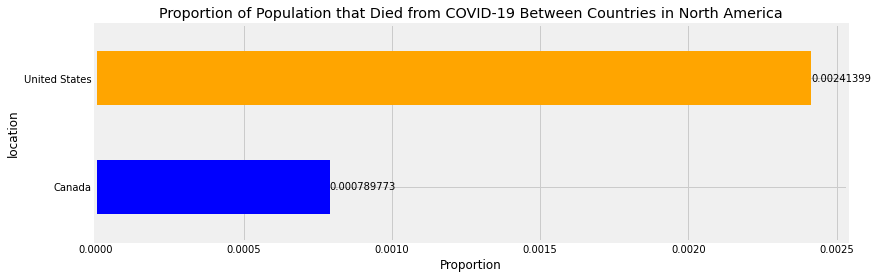

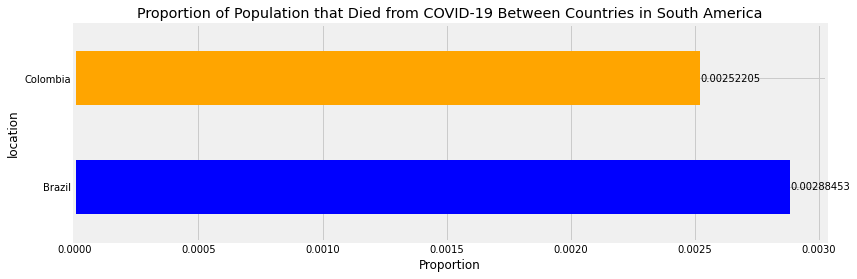

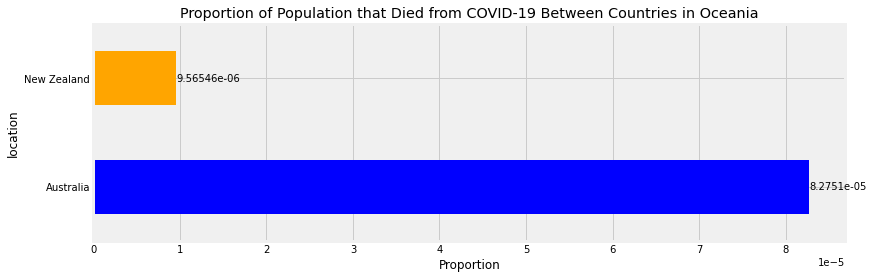

In [115]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  plt.title("Proportion of Population that Died from COVID-19 Between Countries")
  plt.title("Proportion of Population that Died from COVID-19 Between Countries")
  title = "Proportion of Population that Died from COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Countries

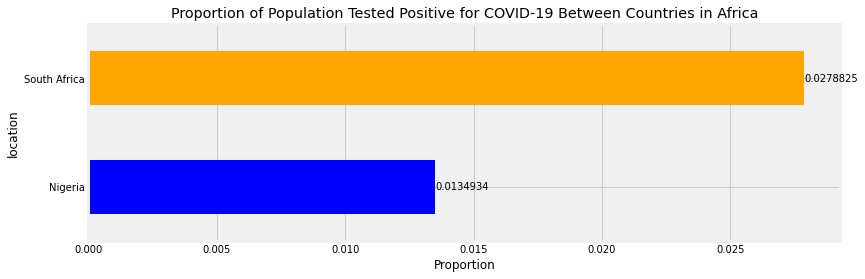

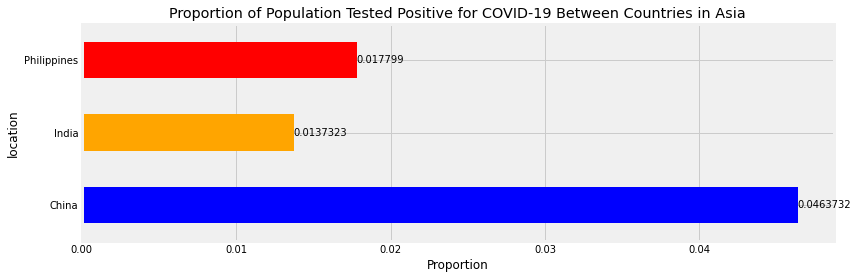

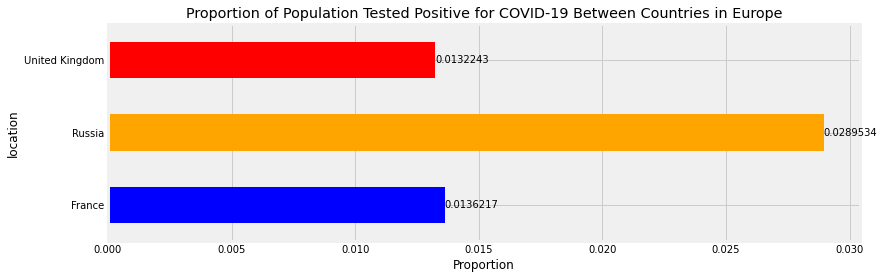

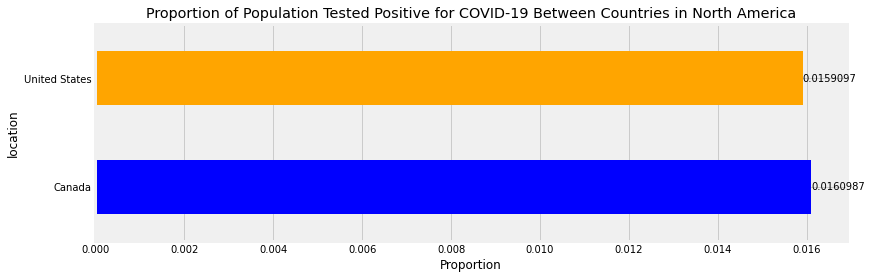

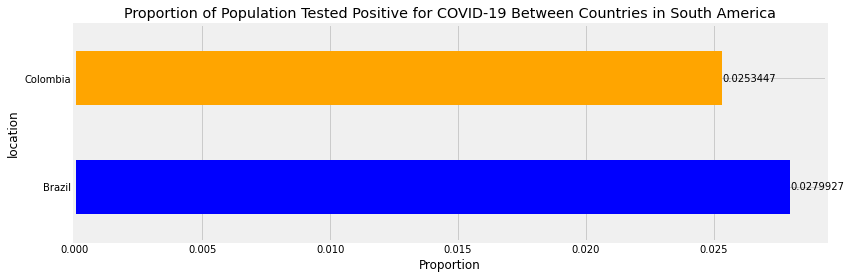

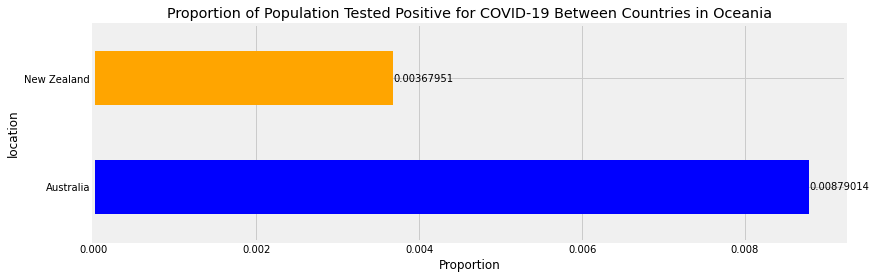

In [116]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum() / continent_countries.groupby("location")["new_cases"].sum()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Population Tested Positive for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Countries


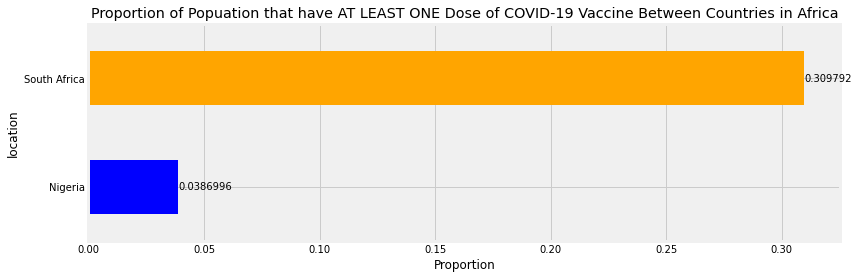

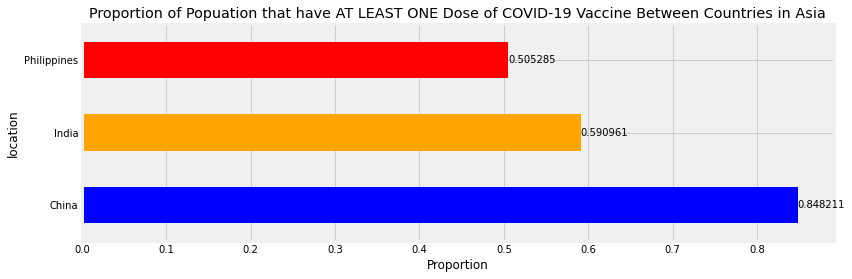

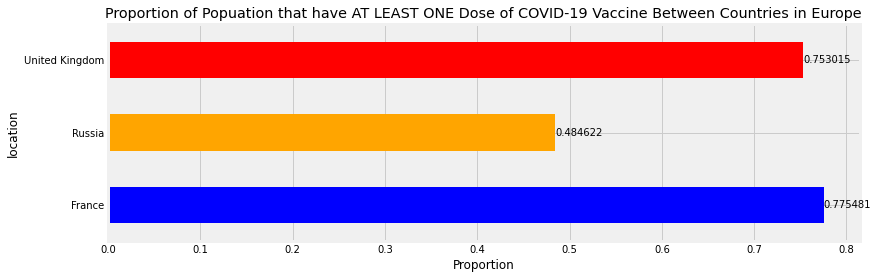

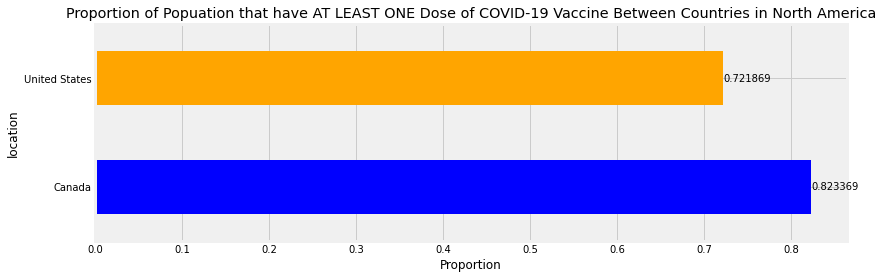

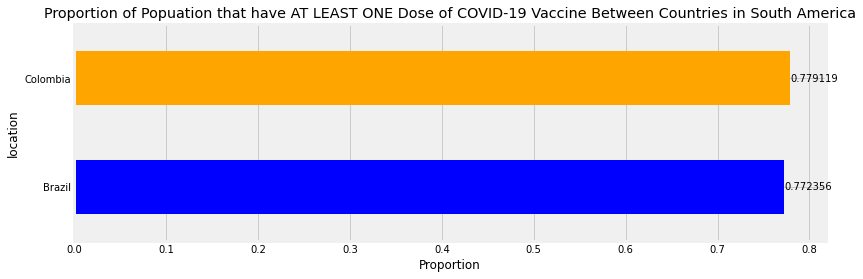

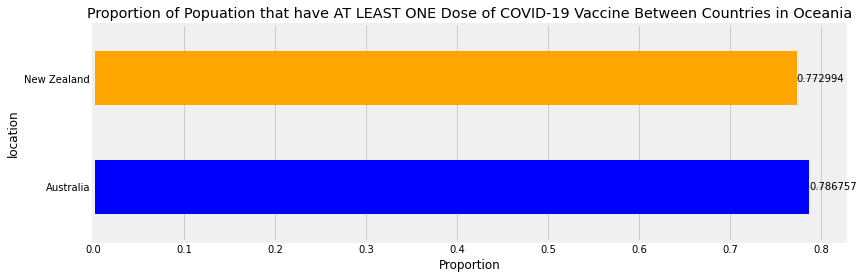

In [117]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_vaccinated"].max() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

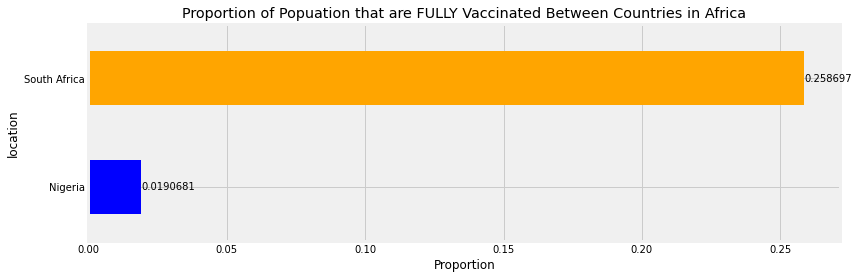

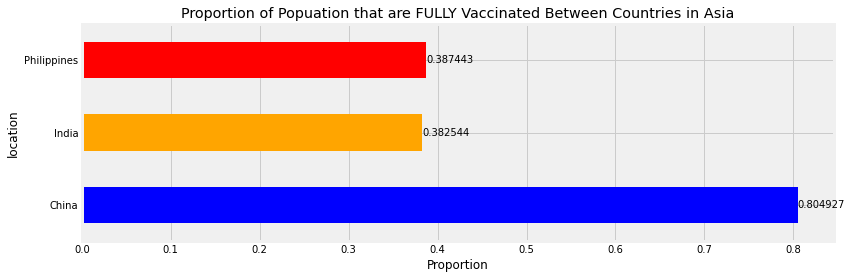

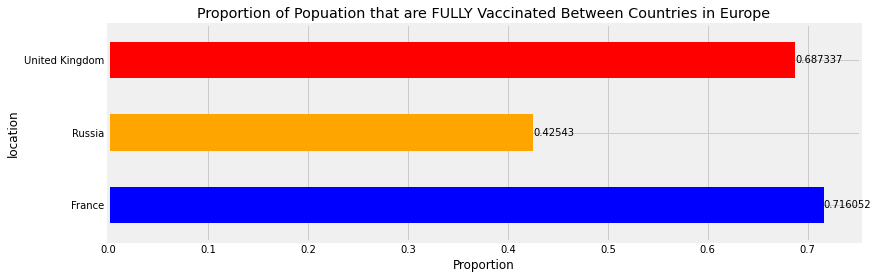

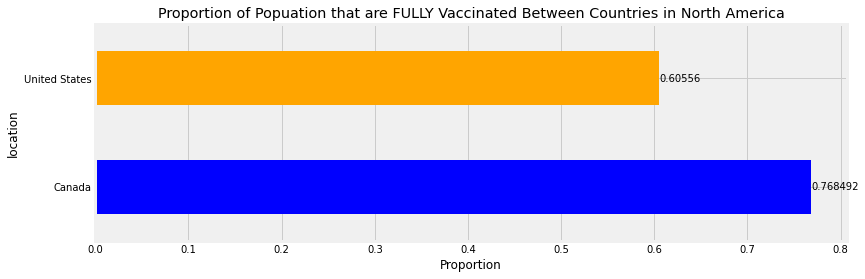

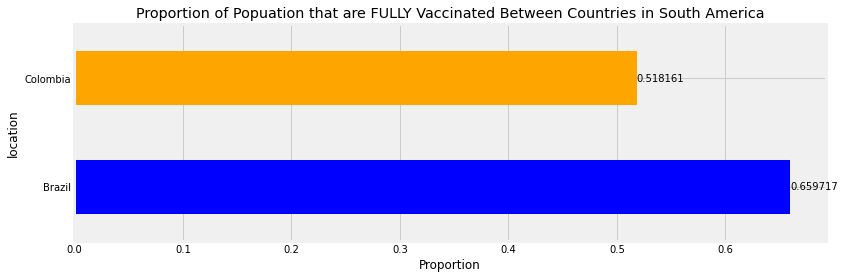

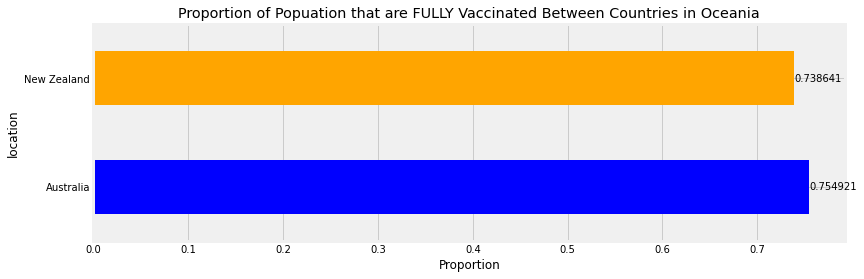

In [118]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_fully_vaccinated"].max() / continent_countries.groupby("location")["population"].max()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Proportion of Popuation that are FULLY Vaccinated Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Proportion")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Countries

In [120]:
for continent_countries in countries_continents_lst:
  continent_countries['Proportion_of_cases_of_population'] = continent_countries['total_cases'] / continent_countries['population']
  continent_countries['Proportion_of_deaths_of_population'] = continent_countries['total_deaths'] / continent_countries['population']
  continent_countries['Proportion_of_deaths_of_pos_cases'] = continent_countries['total_deaths'] / continent_countries['total_cases']
  continent_countries['Proportion_of_vaccinated_of_population'] = continent_countries['people_vaccinated'] / continent_countries['population']
  continent_countries['Proportion_of_fully_vaccinated_of_population'] = continent_countries['people_fully_vaccinated'] / continent_countries['population']

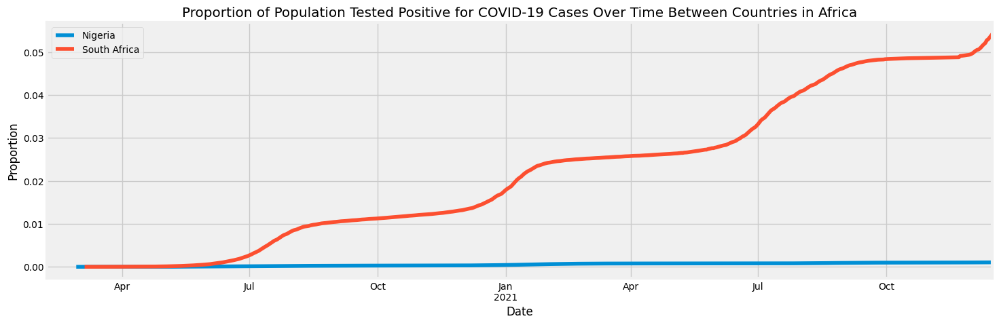

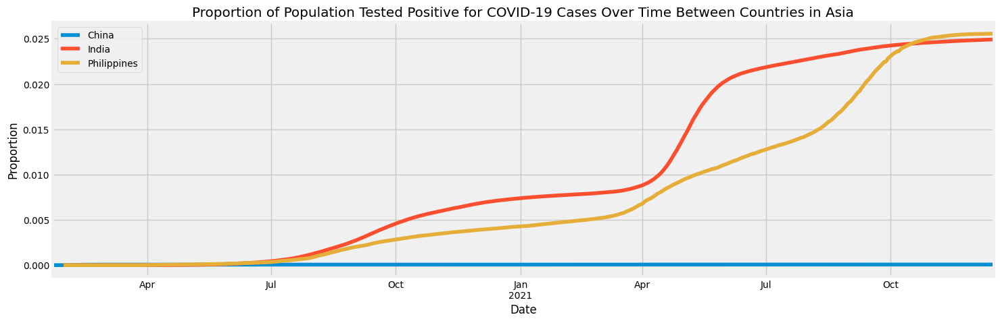

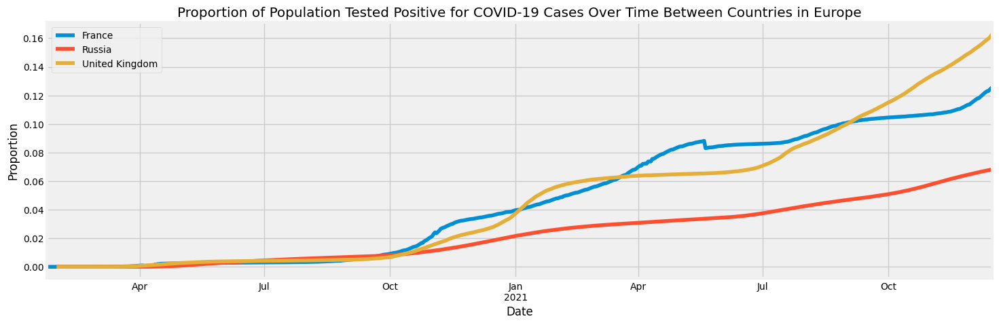

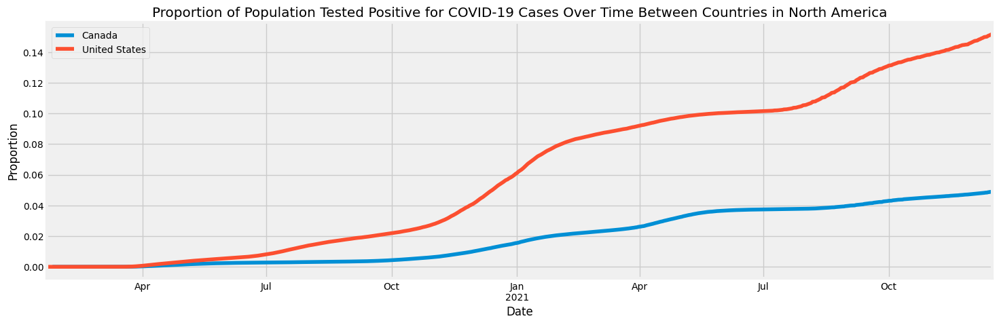

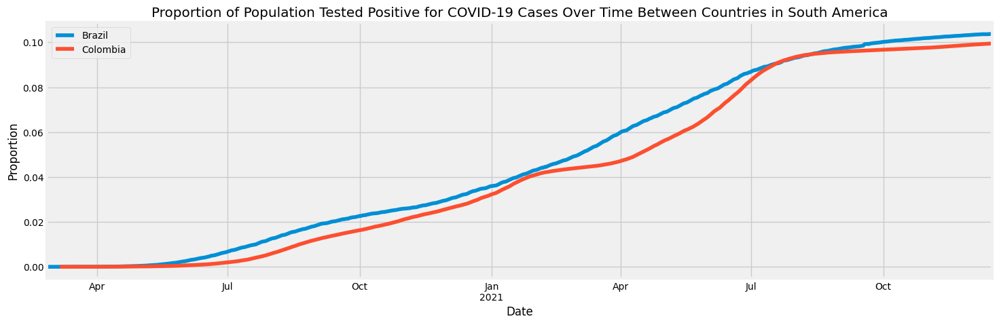

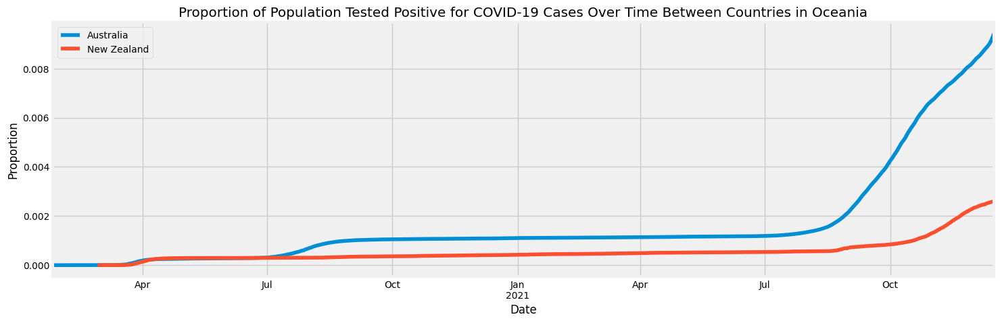

In [121]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
  title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

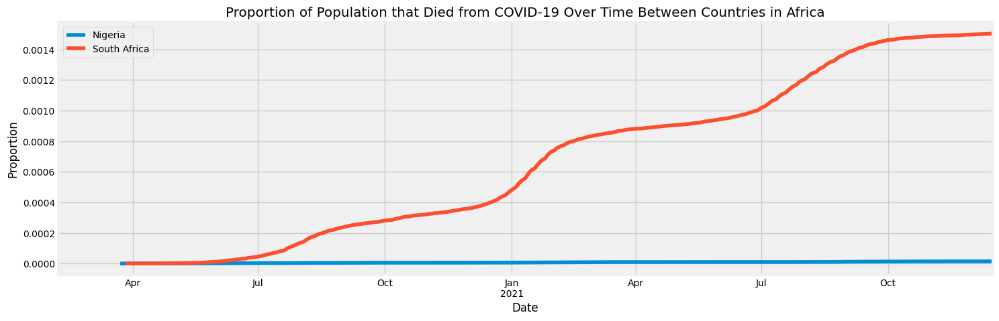

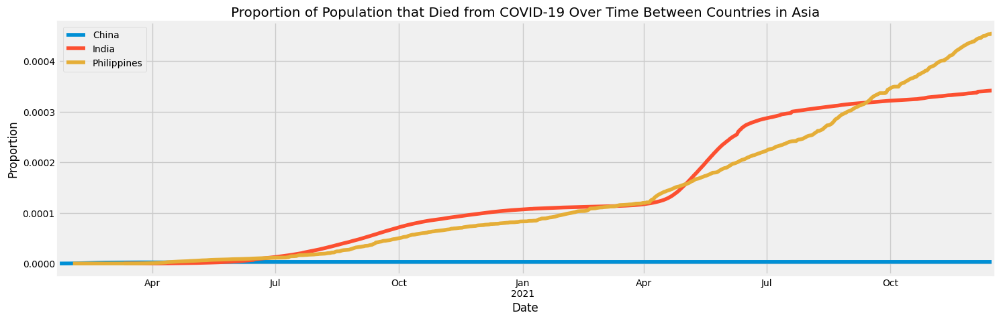

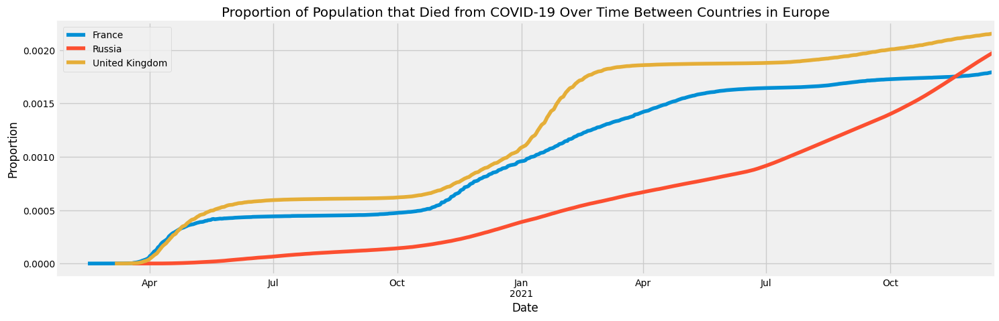

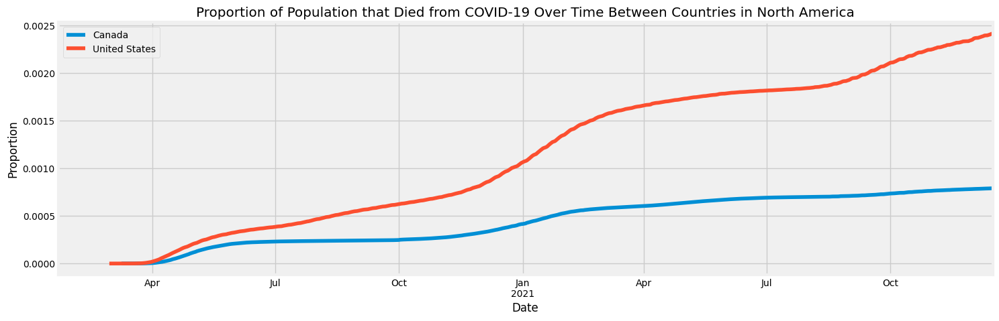

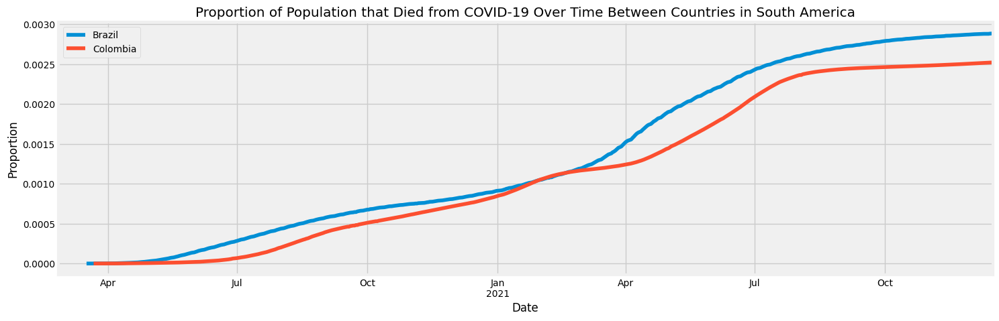

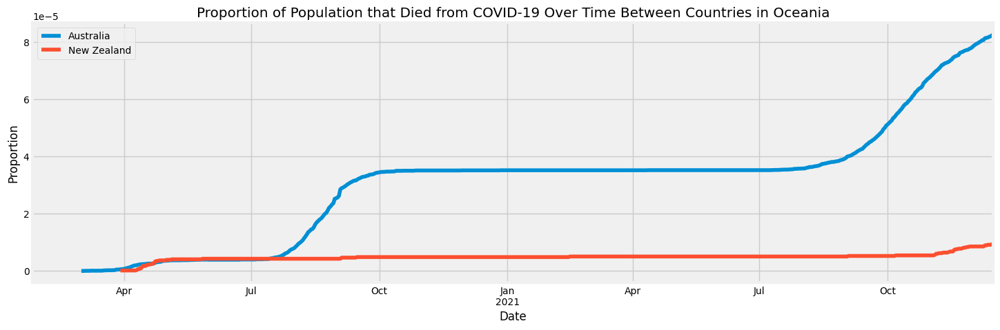

In [122]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
  title = 'Proportion of Population that Died from COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

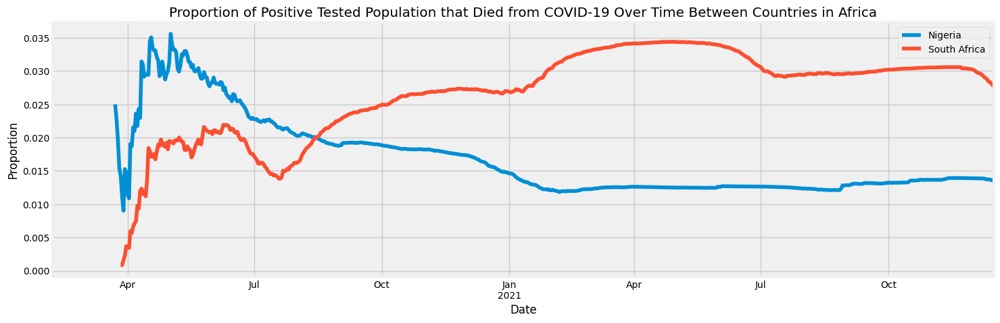

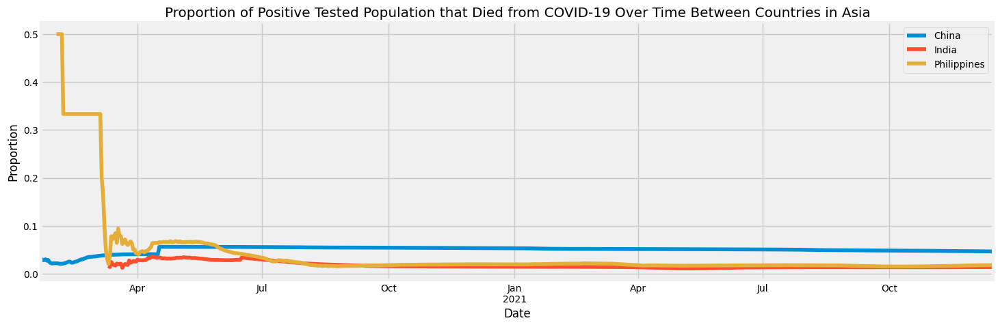

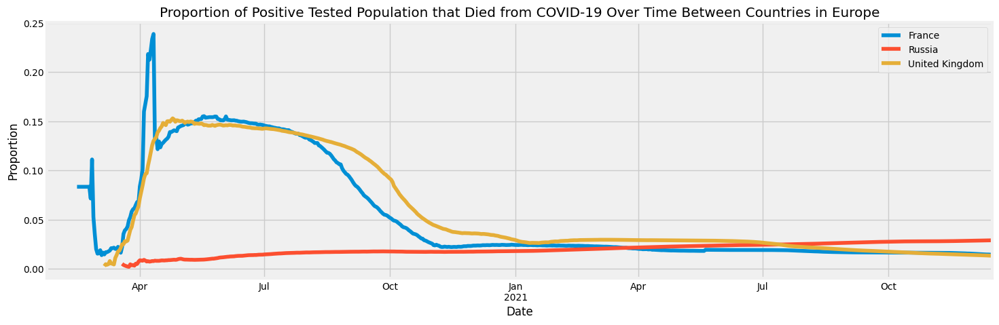

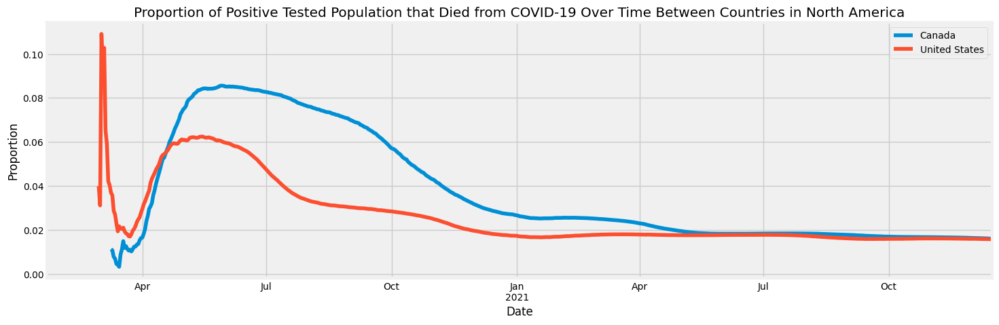

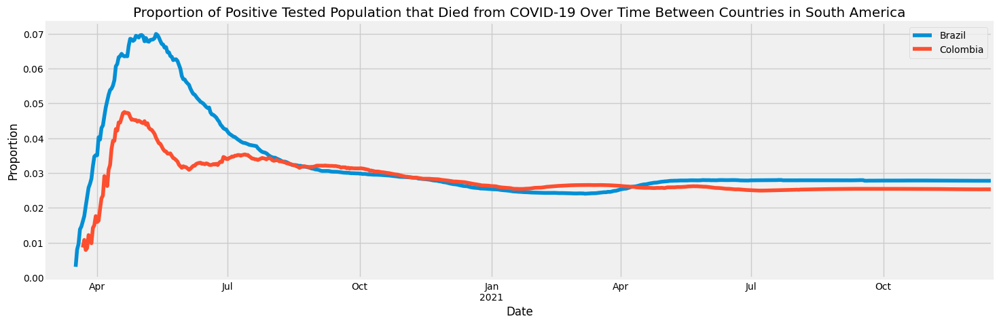

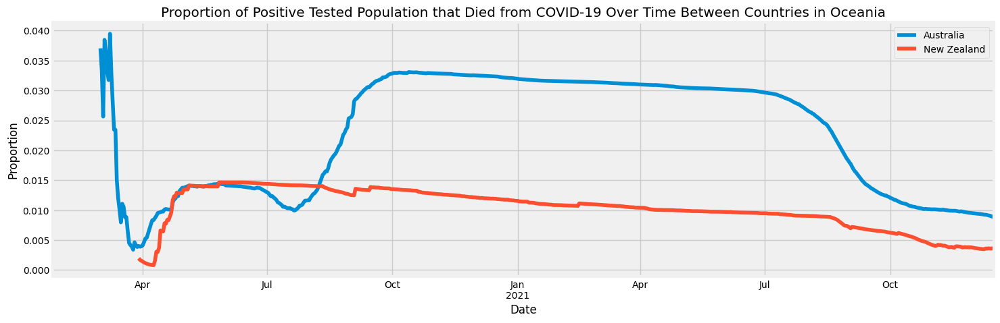

In [123]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
  title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

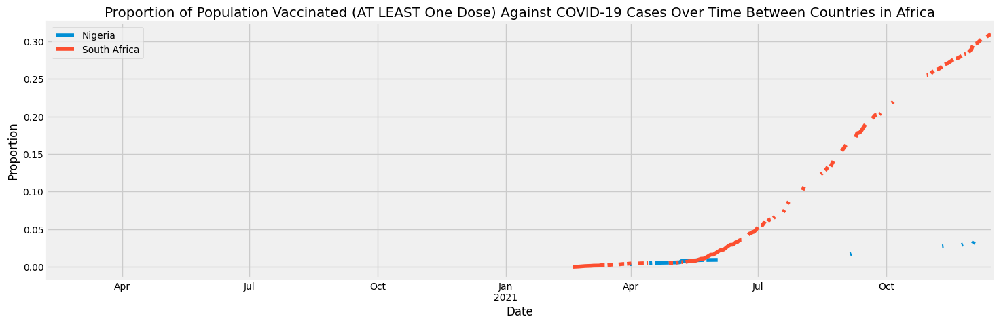

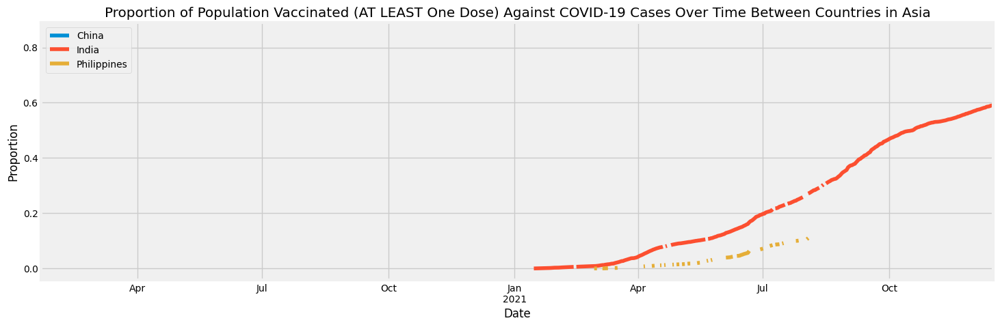

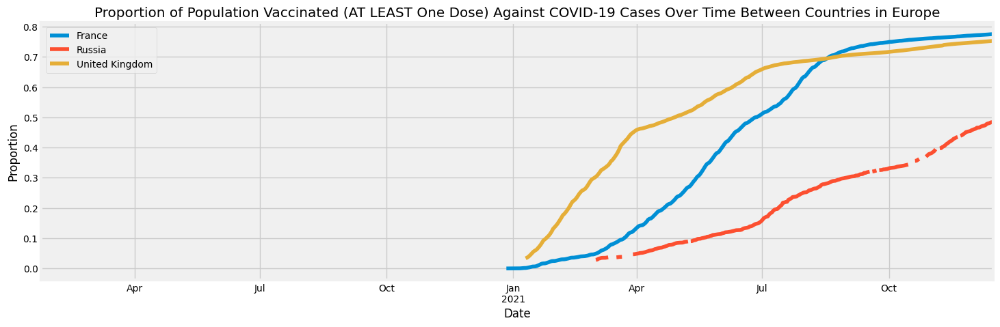

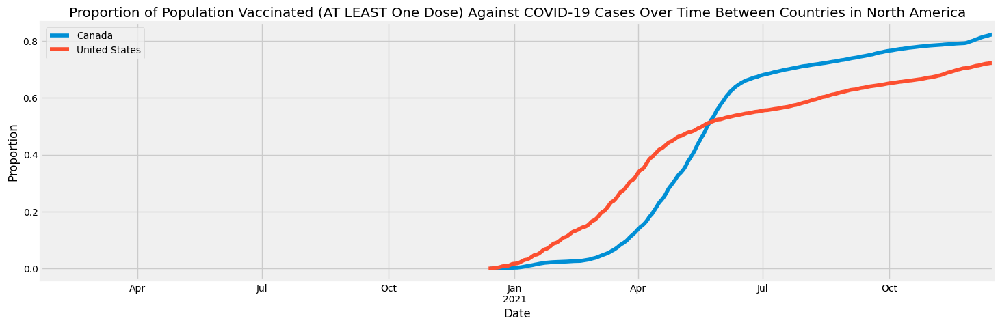

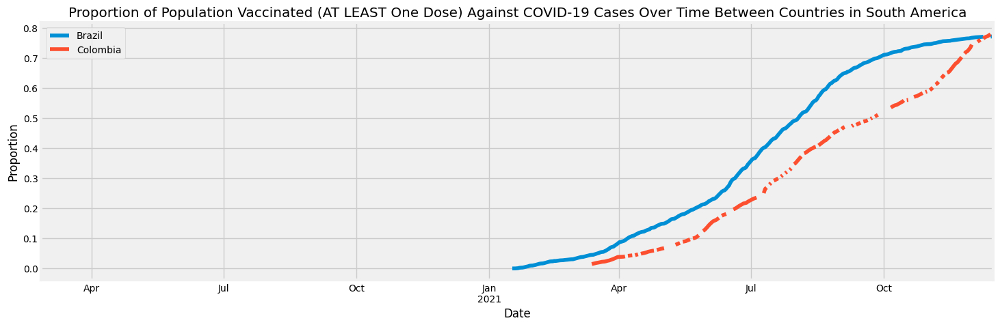

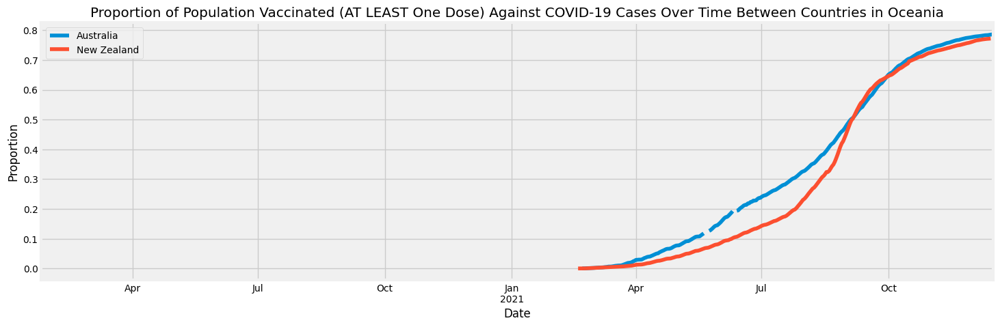

In [124]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
  title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

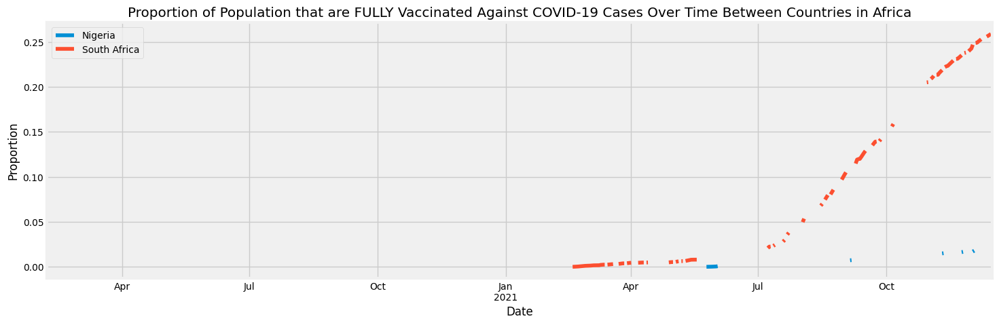

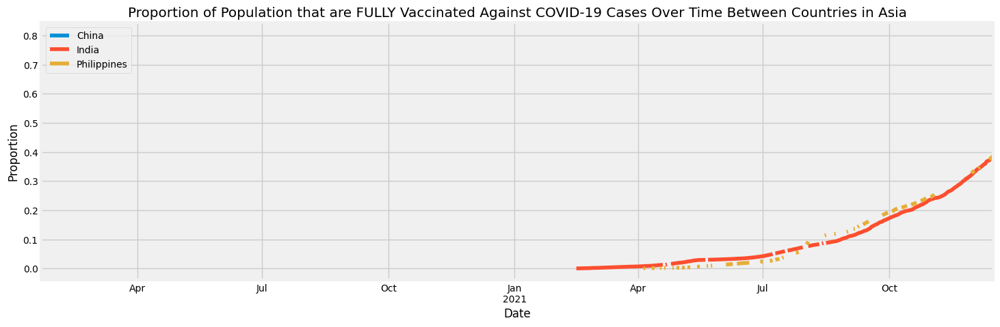

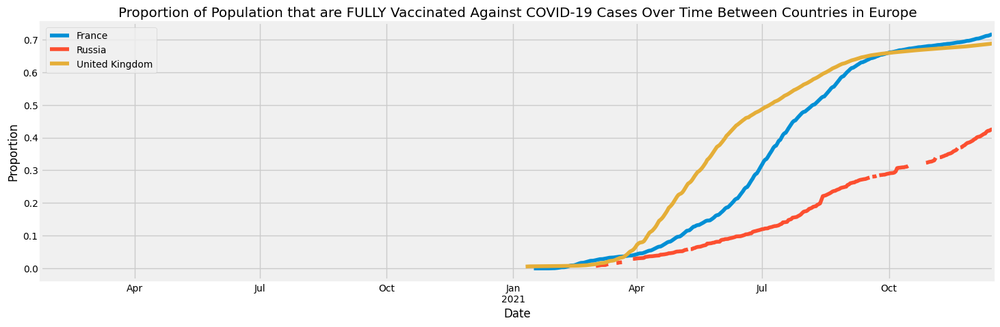

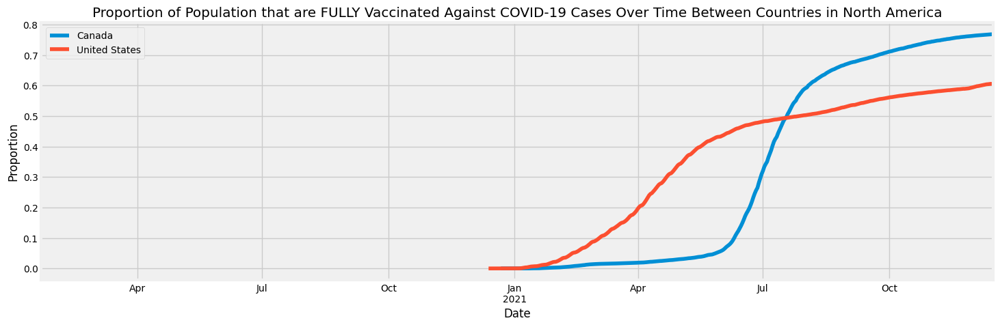

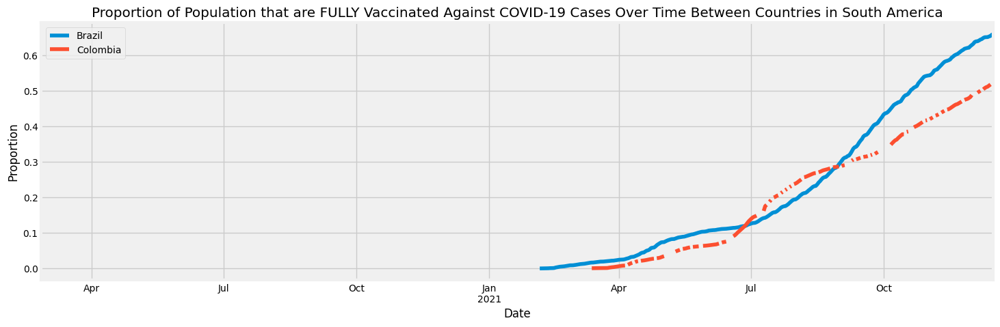

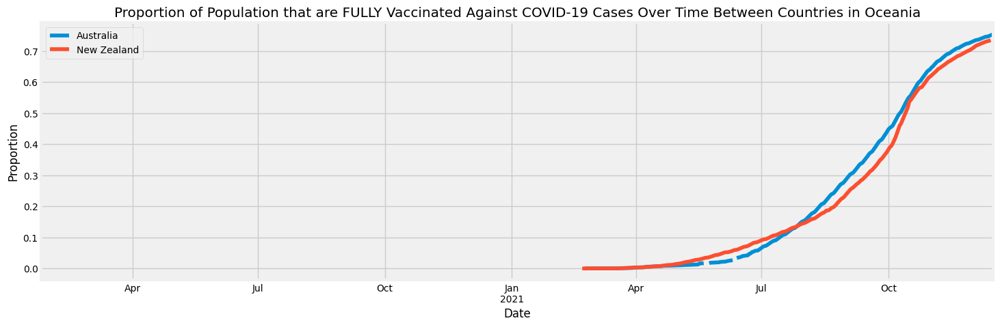

In [125]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
  title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Proportion')
  plt.show()

## Total Number of COVID-19 Cases Between Countries

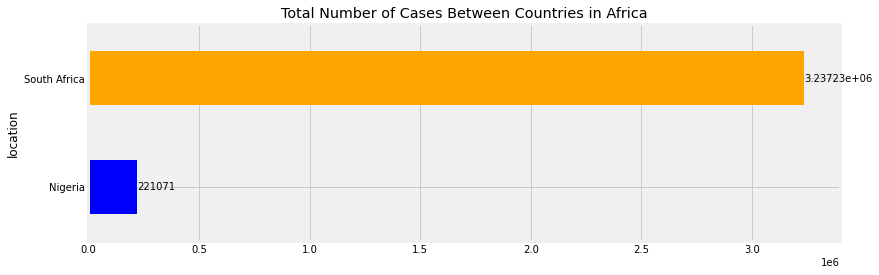

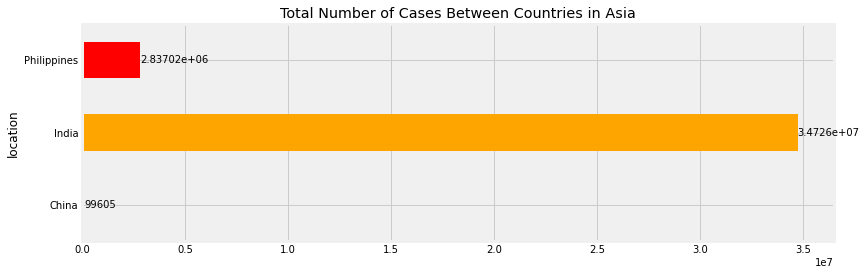

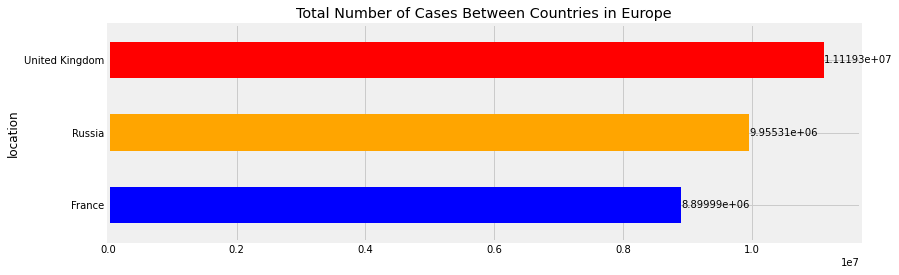

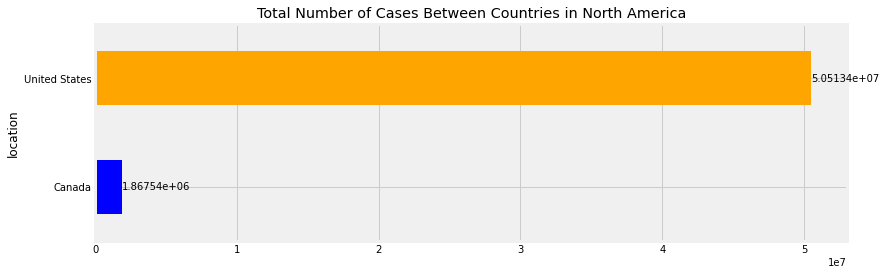

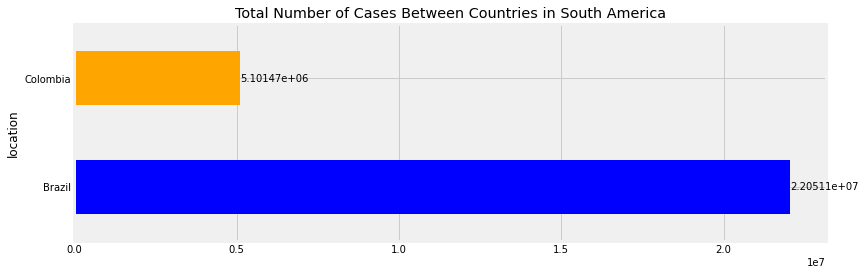

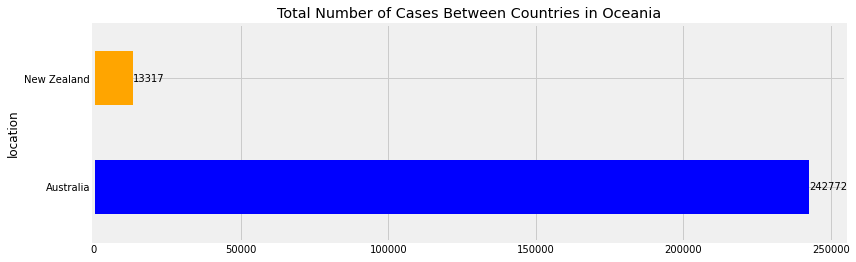

In [126]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].sum()

  fig, axe = plt.subplots(figsize=(12,4)) 
  title = "Total Number of Cases Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Countries

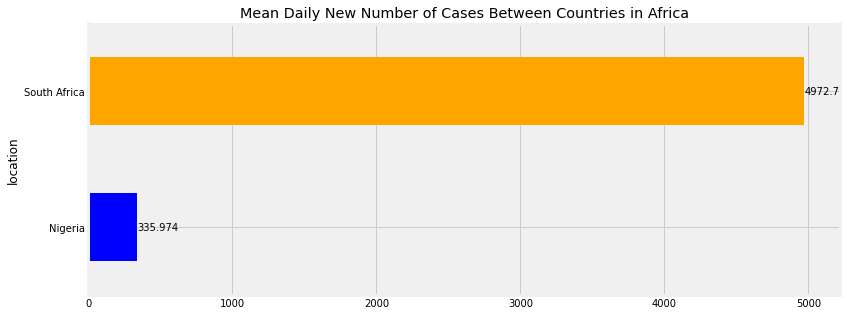

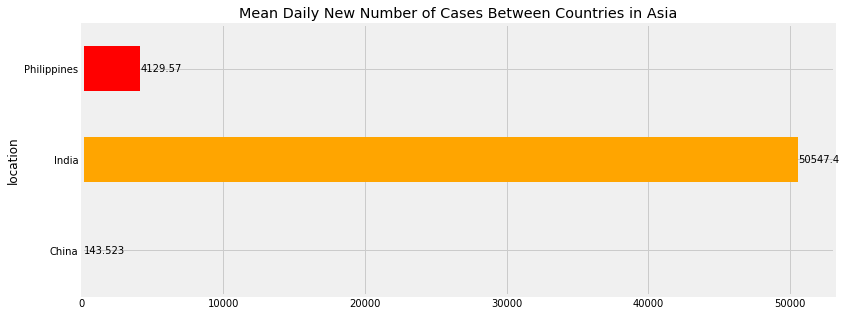

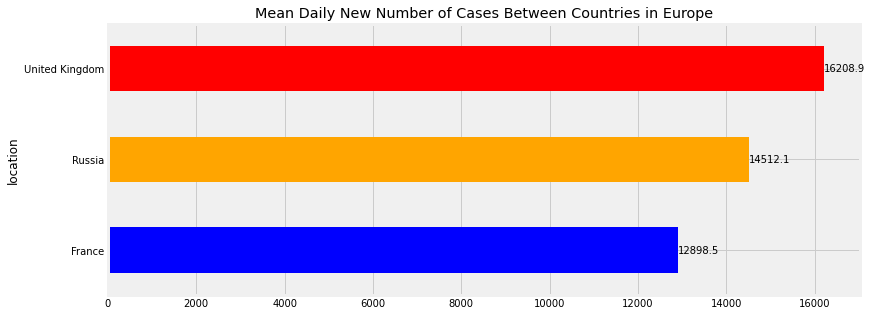

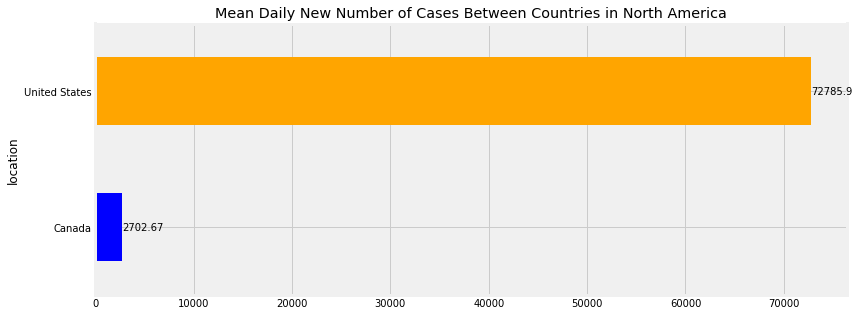

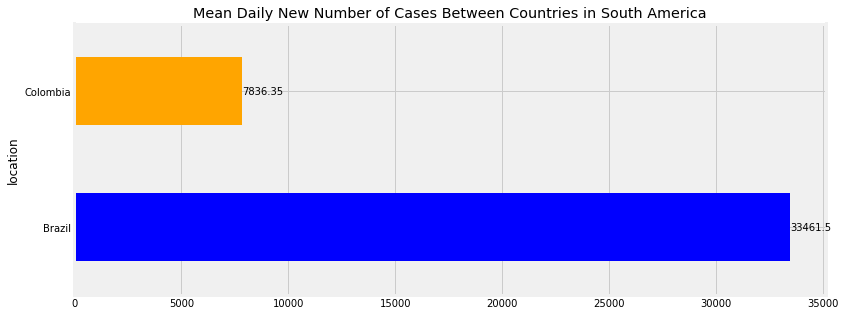

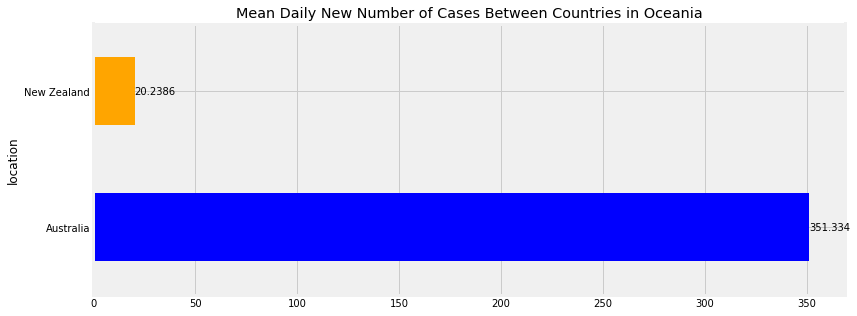

In [127]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_cases"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of Cases Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Countries

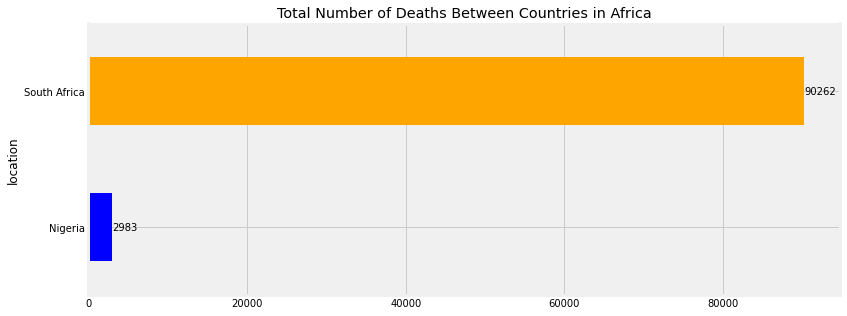

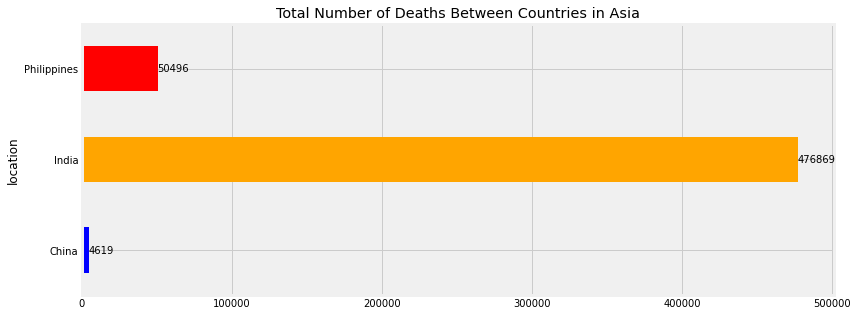

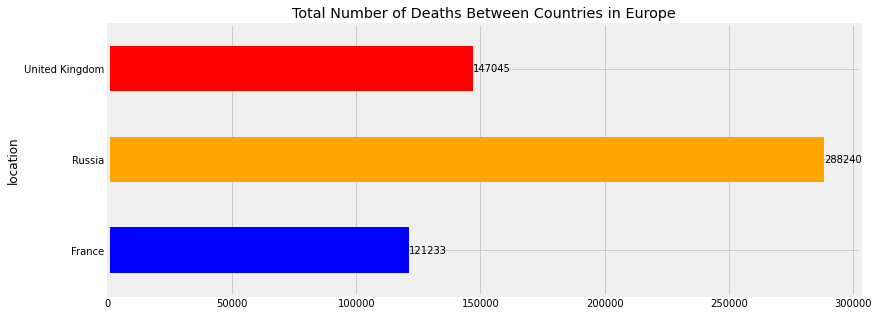

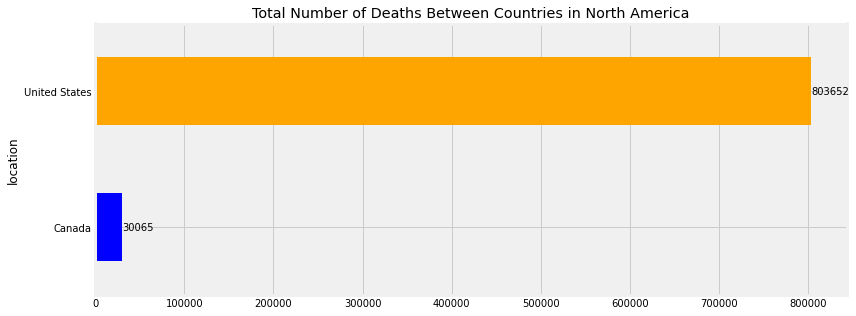

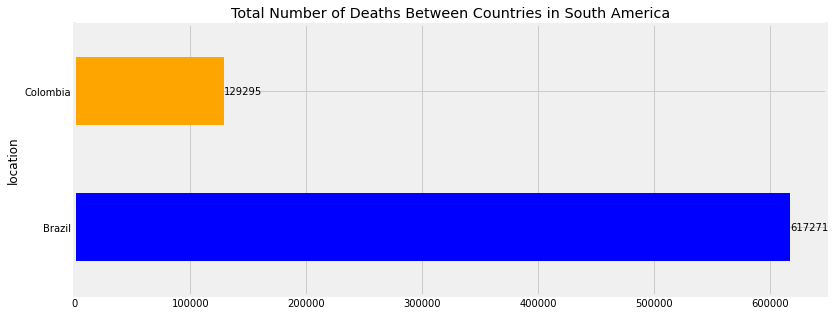

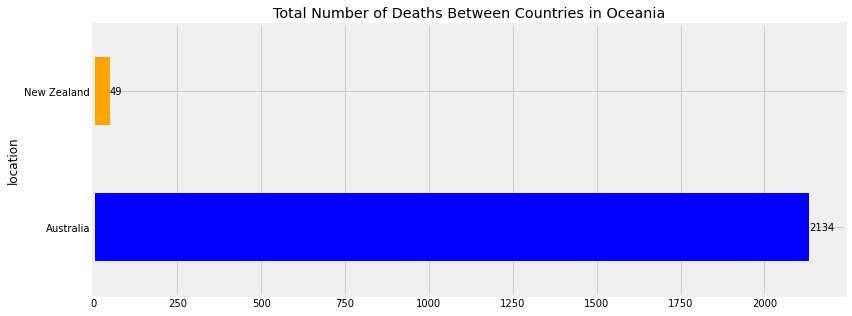

In [128]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].sum()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Deaths Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Deaths")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Countries

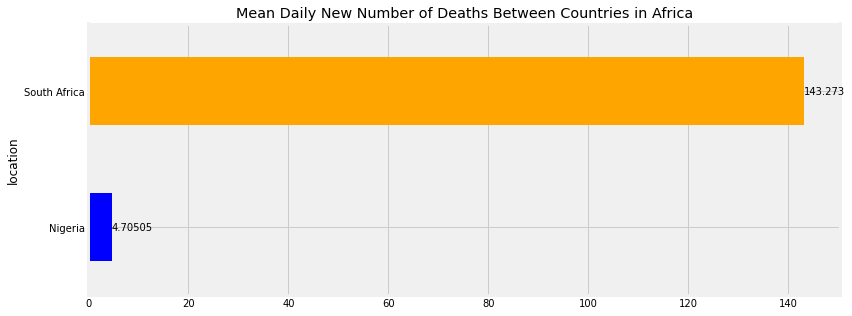

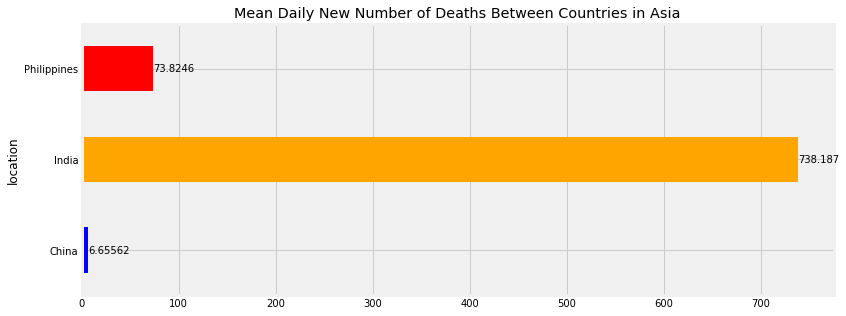

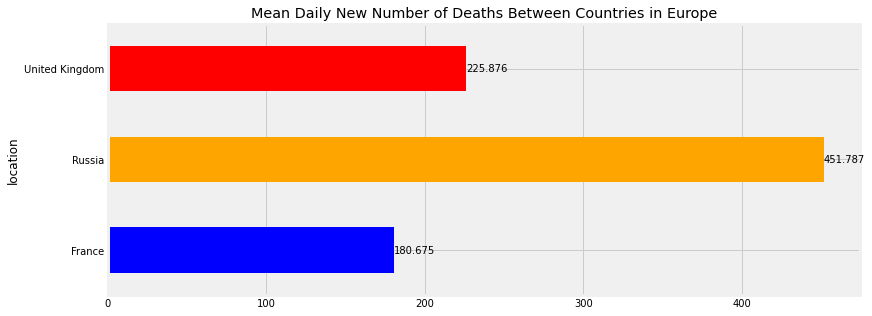

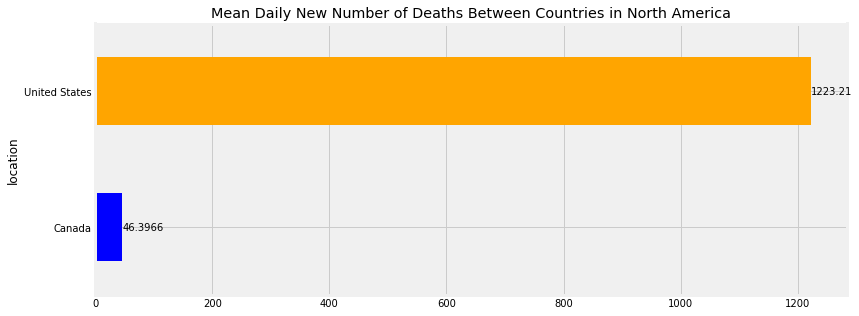

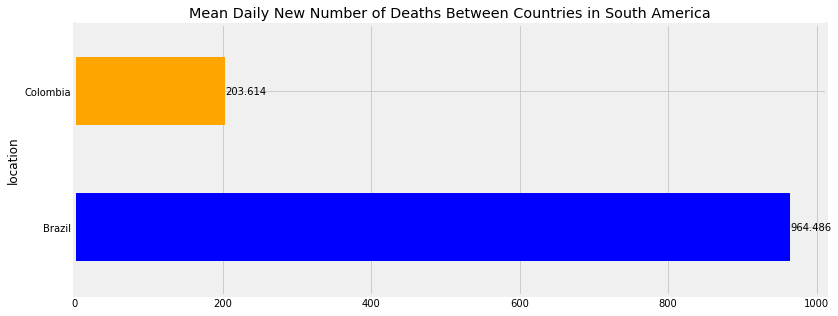

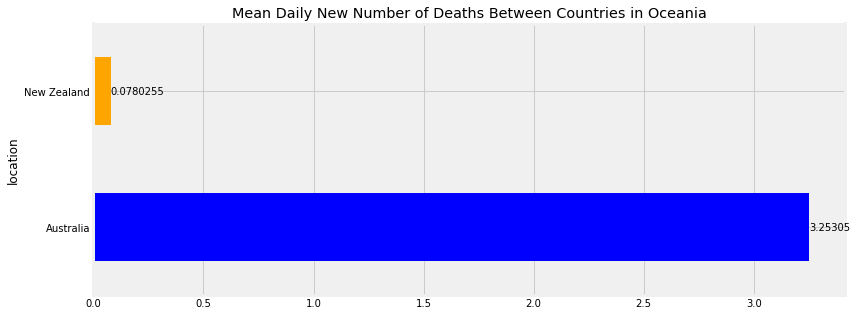

In [129]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_deaths"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of Deaths Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Deaths")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Countries

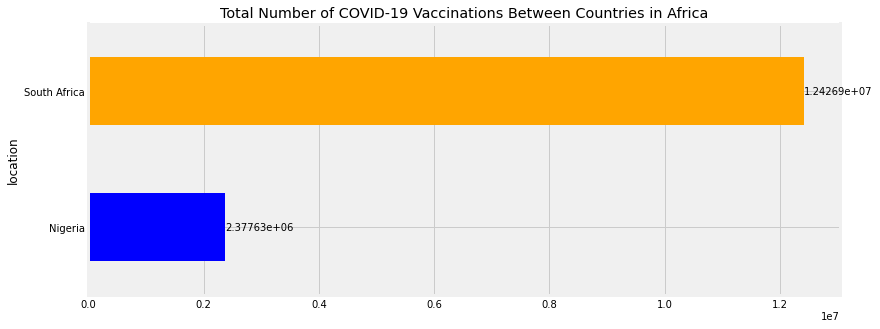

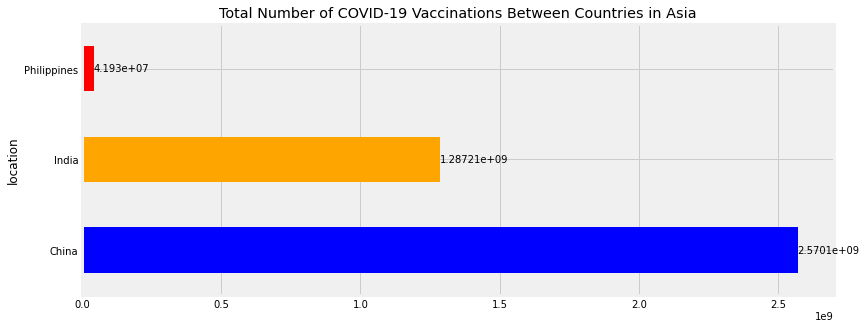

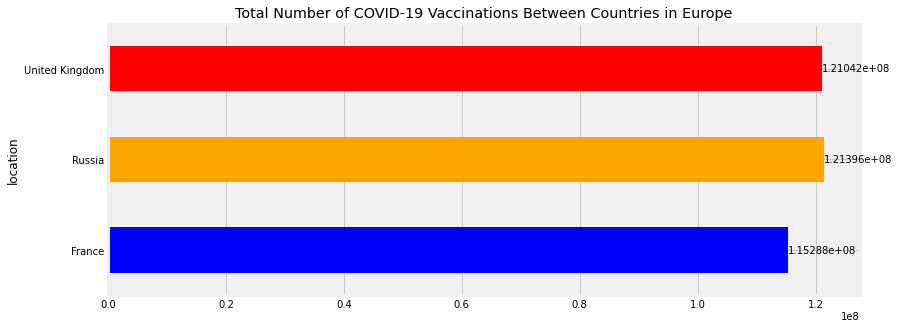

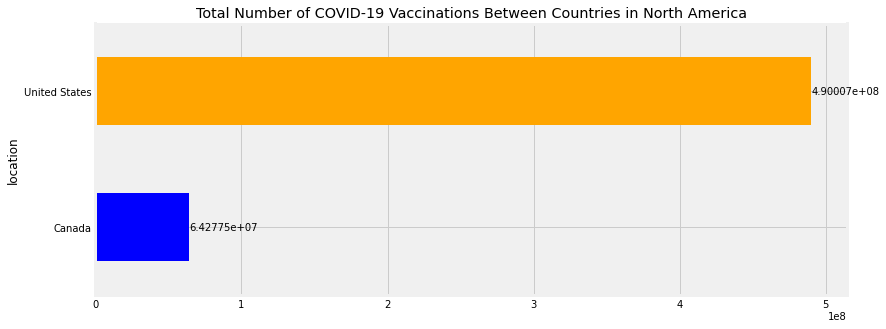

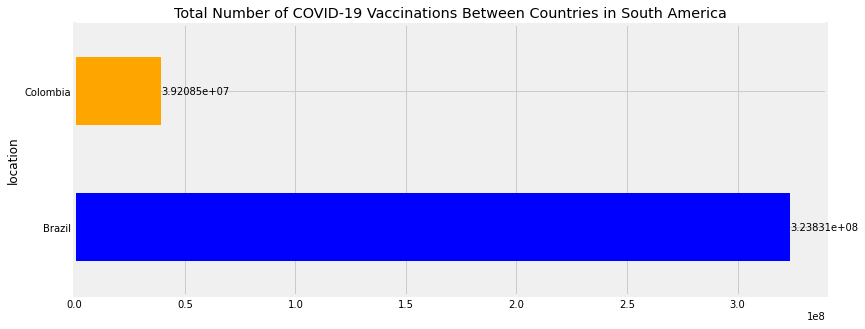

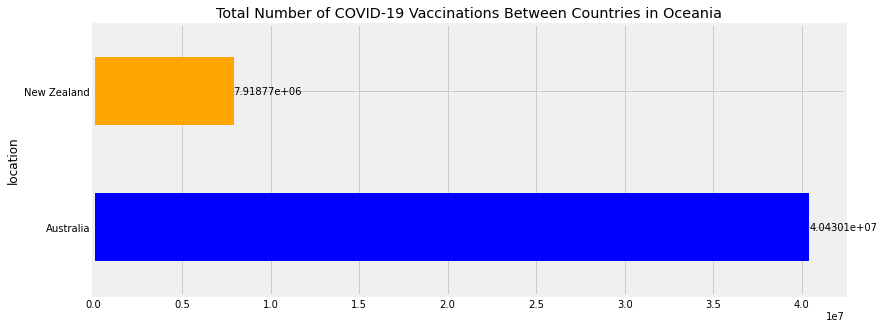

In [130]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_vaccinations"].sum()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of COVID-19 Vaccinations Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Vaccinations")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Countries

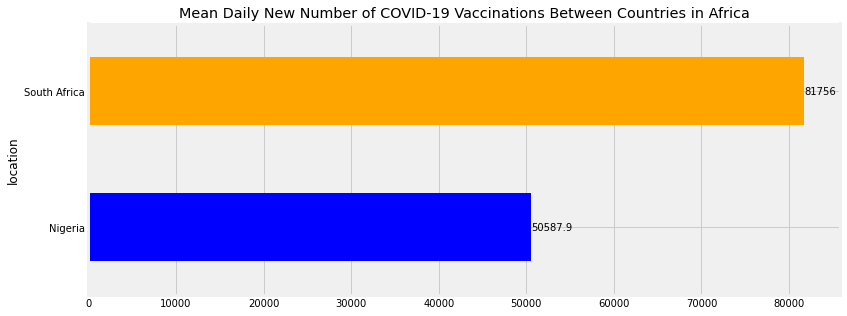

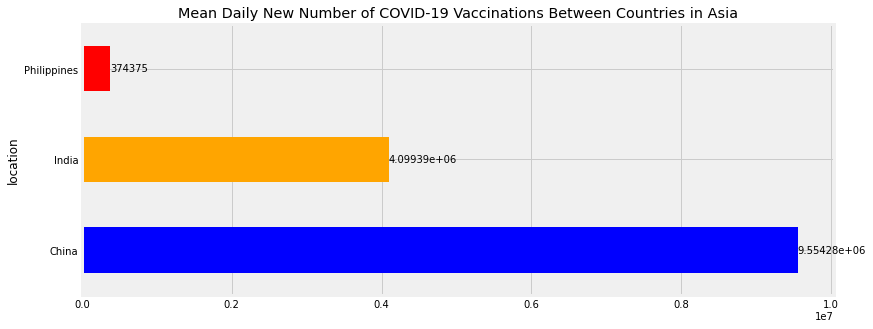

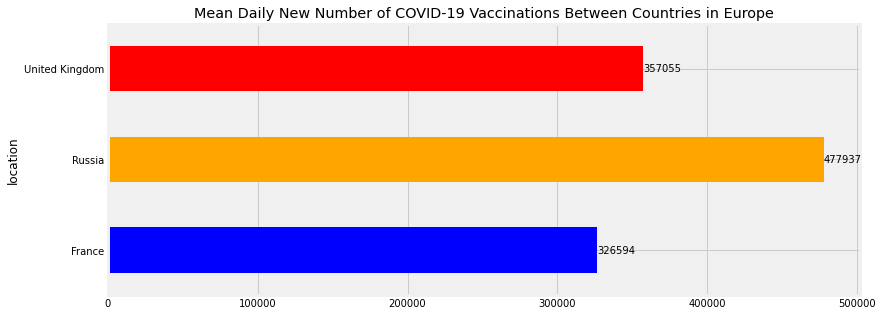

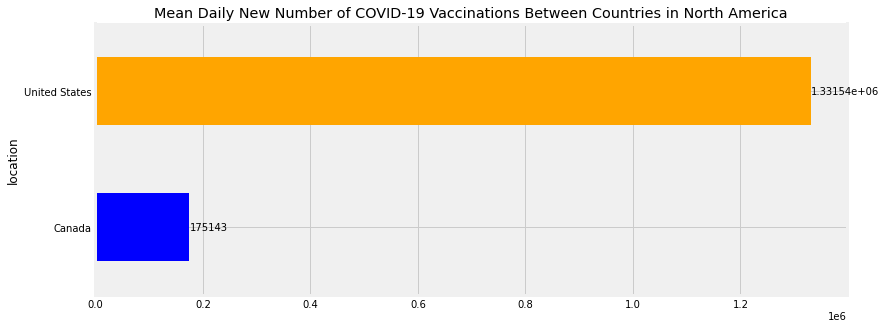

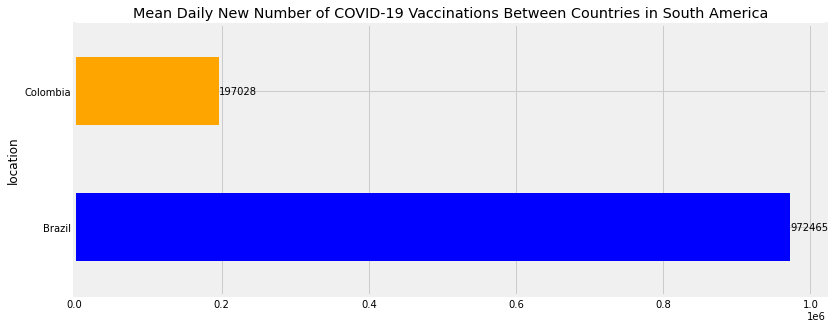

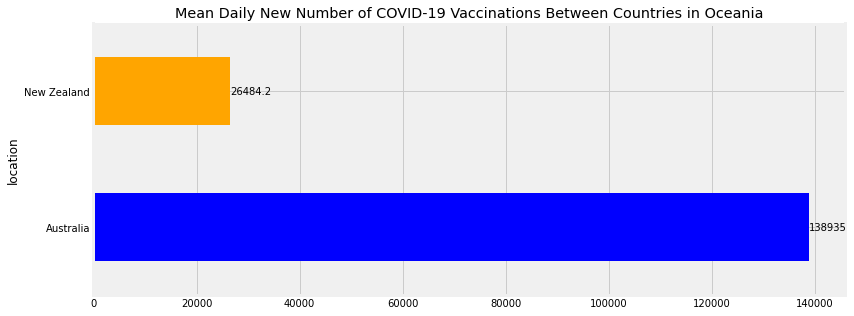

In [131]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_vaccinations"].mean()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of COVID-19 Vaccinations Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Mean Daily New Number of Vaccinations")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Countries

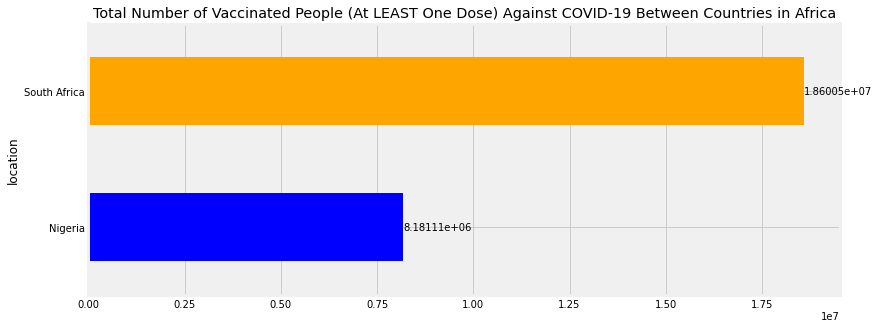

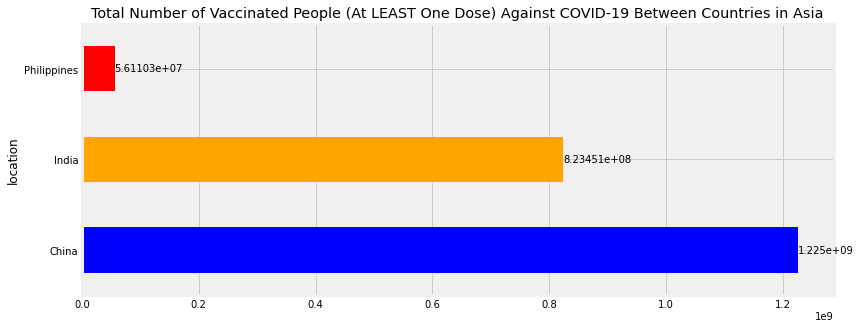

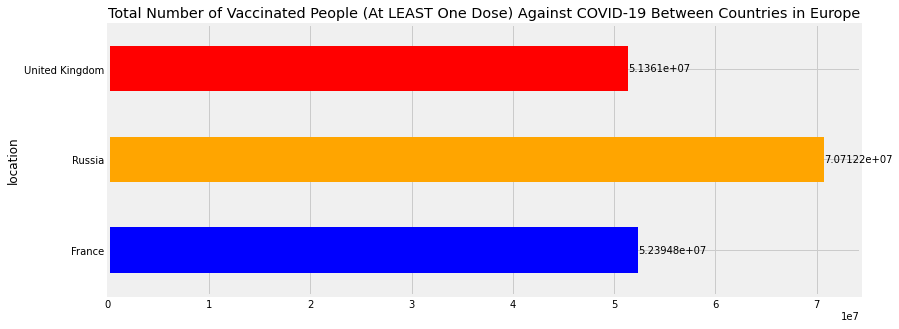

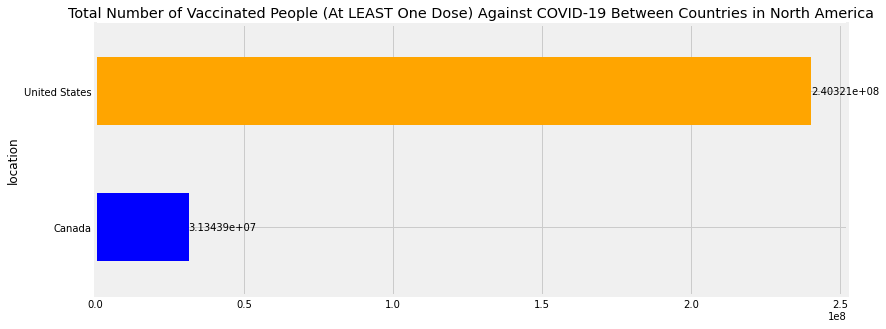

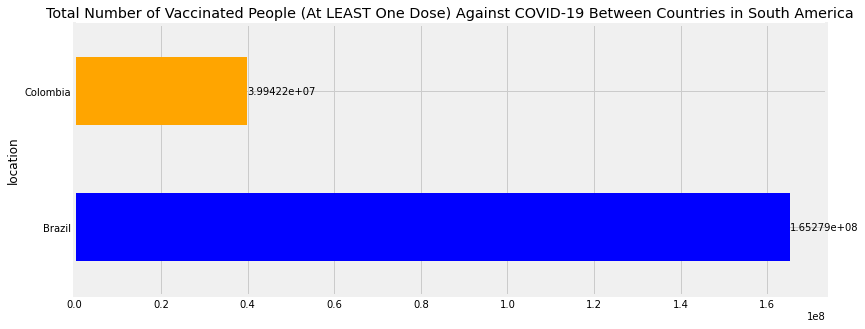

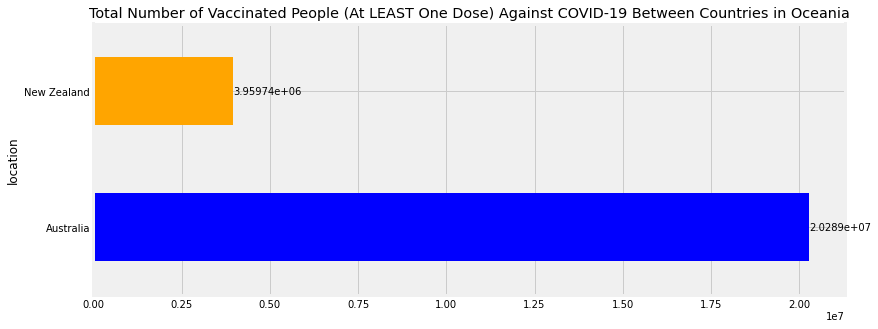

In [132]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_vaccinated"].max()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Countries

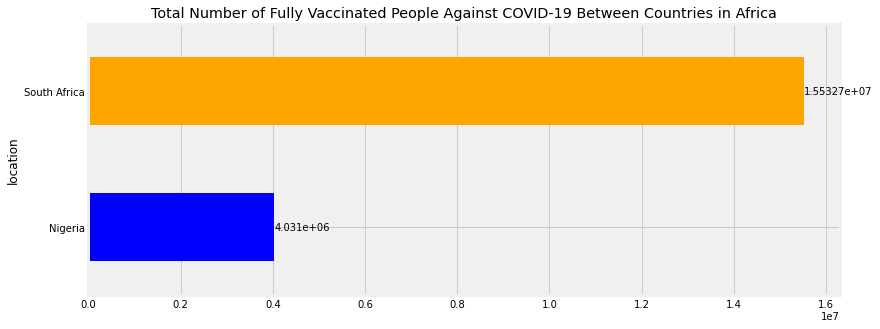

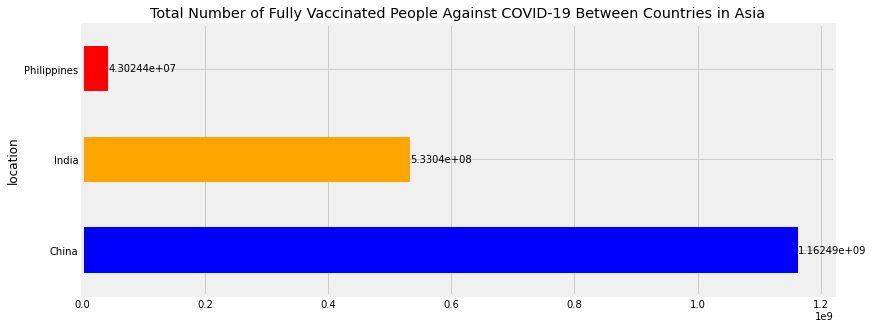

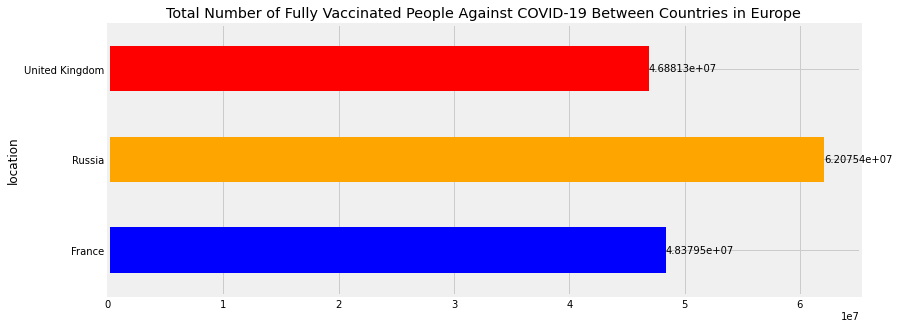

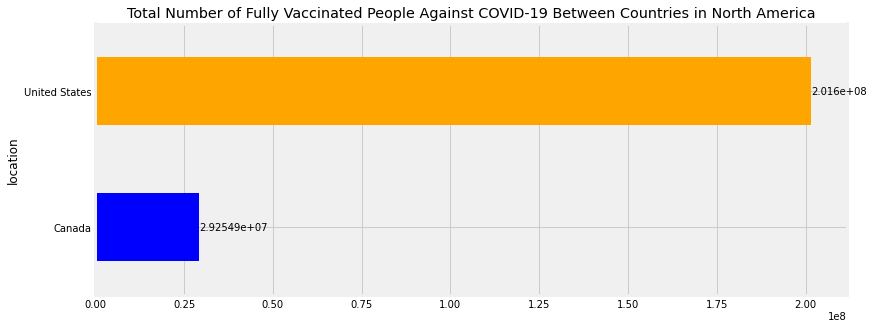

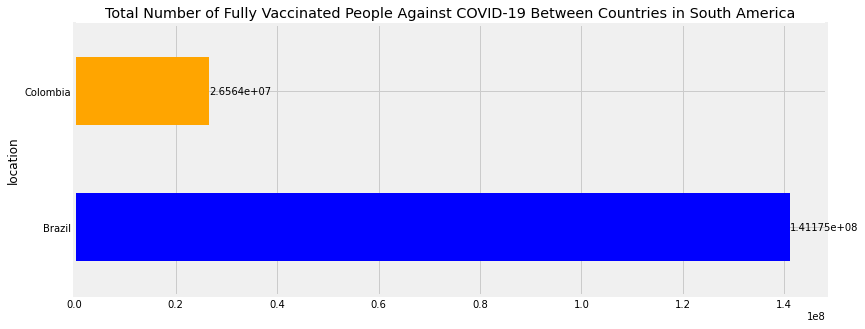

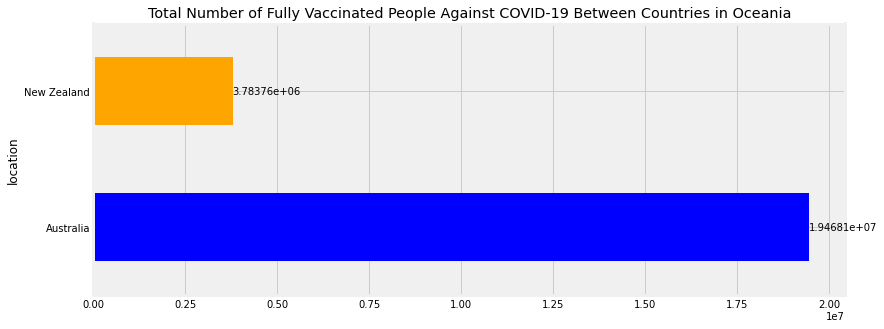

In [133]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["people_fully_vaccinated"].max()

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of Fully Vaccinated People Against COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.ylabel("Total Cases")


  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Tests Between Countries

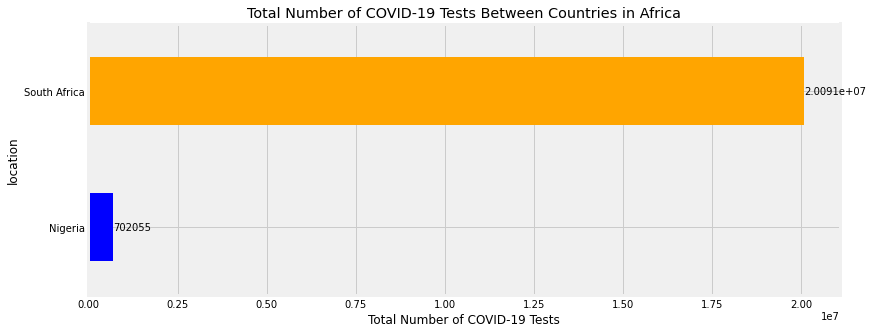

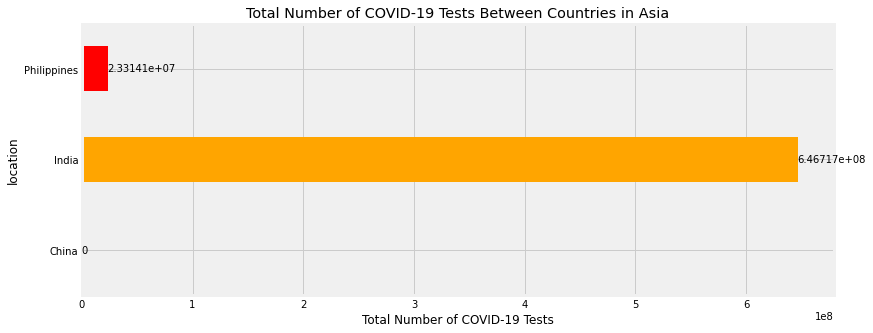

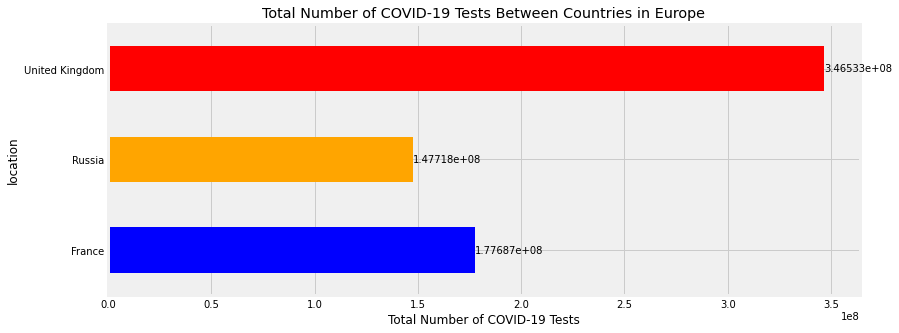

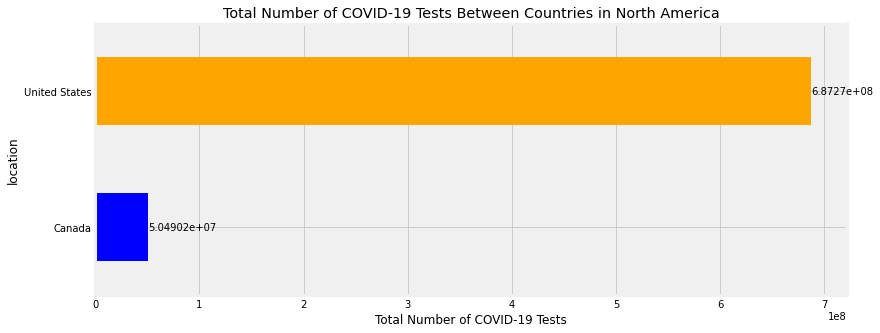

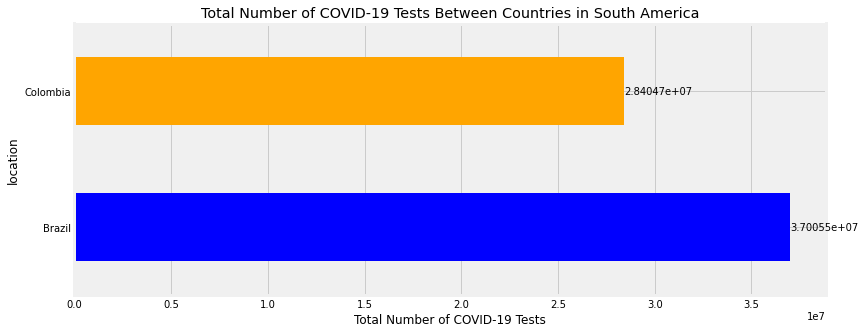

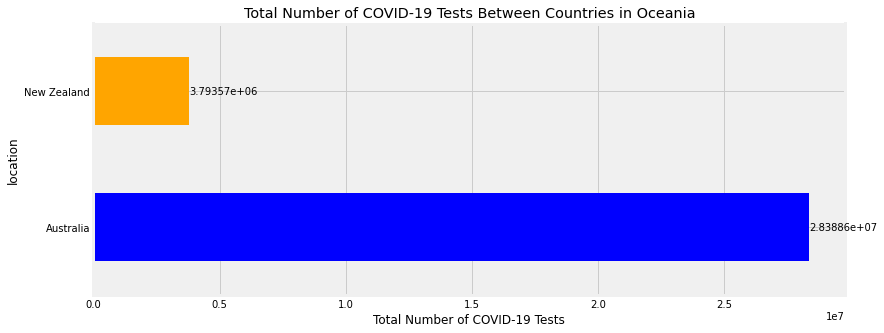

In [134]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_tests"].sum() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Total Number of COVID-19 Tests Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Total Number of COVID-19 Tests")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Tests Between Countries

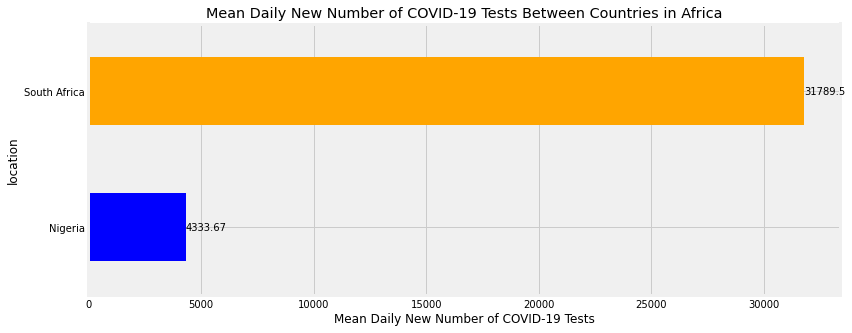

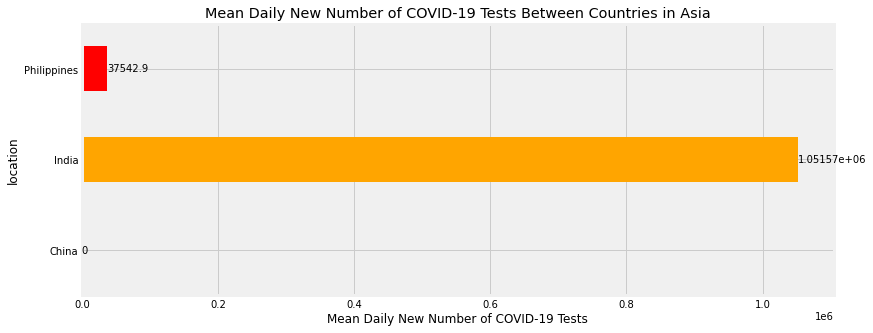

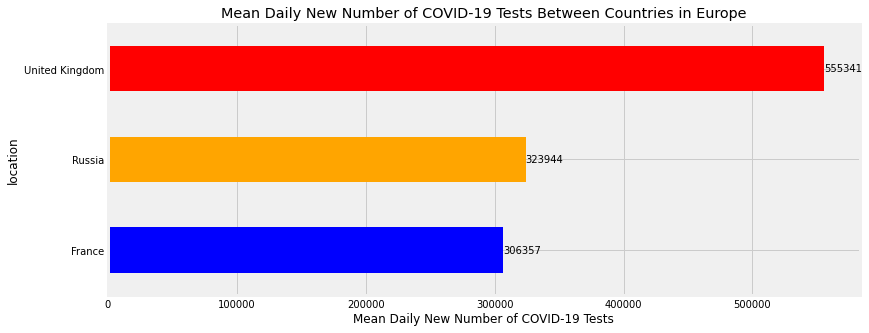

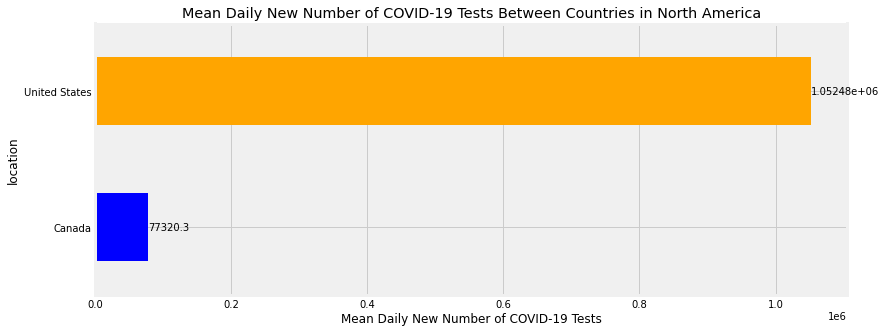

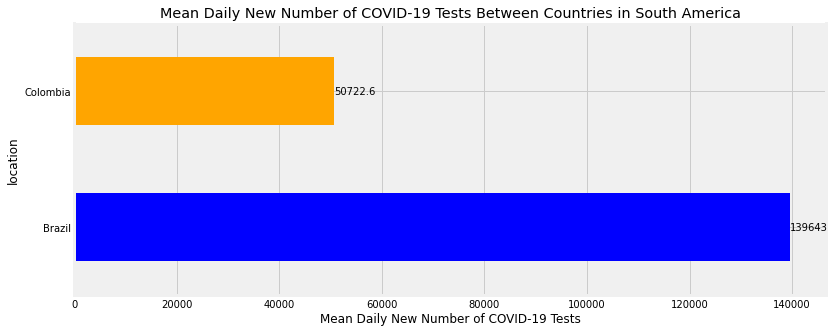

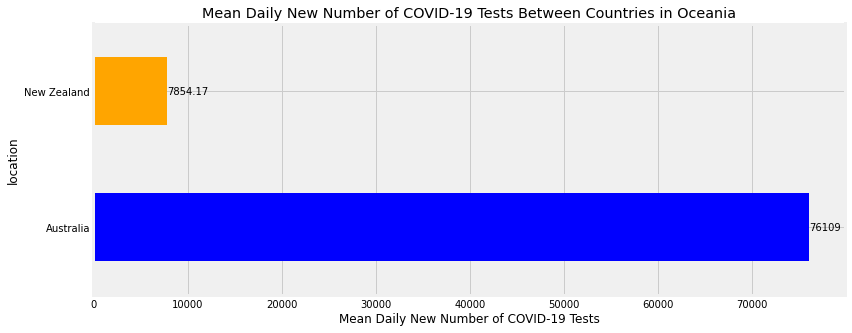

In [135]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["new_tests"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Mean Daily New Number of COVID-19 Tests Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Mean Daily New Number of COVID-19 Tests")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Percentage of COVID-19 Test Cases that are Positive Between Countries

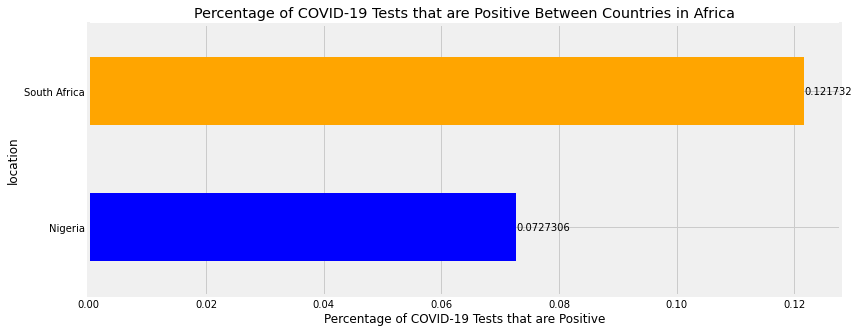

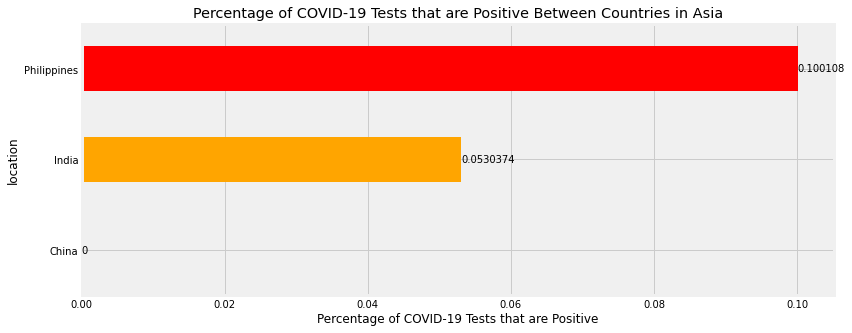

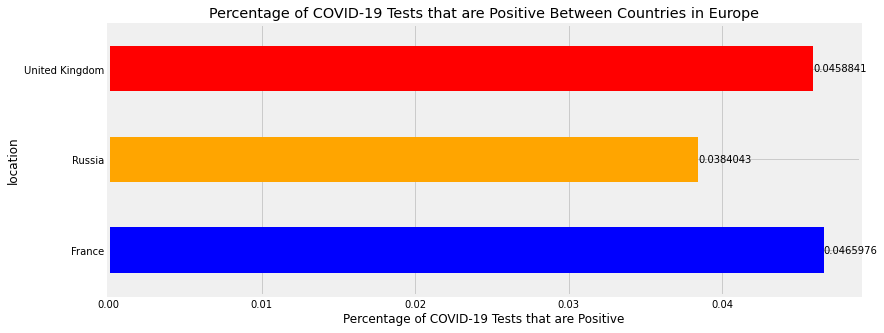

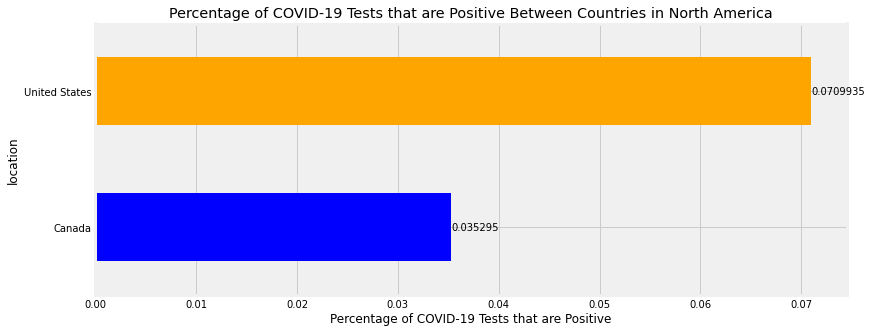

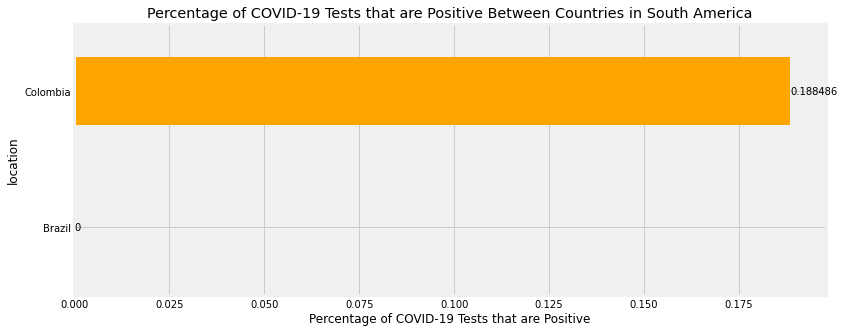

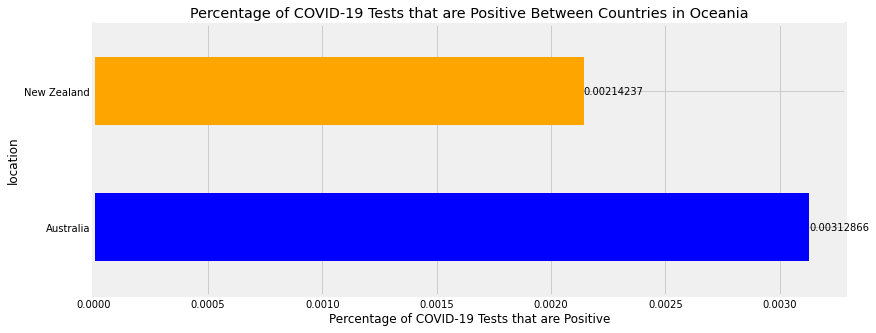

In [136]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["positive_rate"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Percentage of COVID-19 Tests that are Positive Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Percentage of COVID-19 Tests that are Positive")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Tests per New Confirmed Case of COVID-19 Between Countries

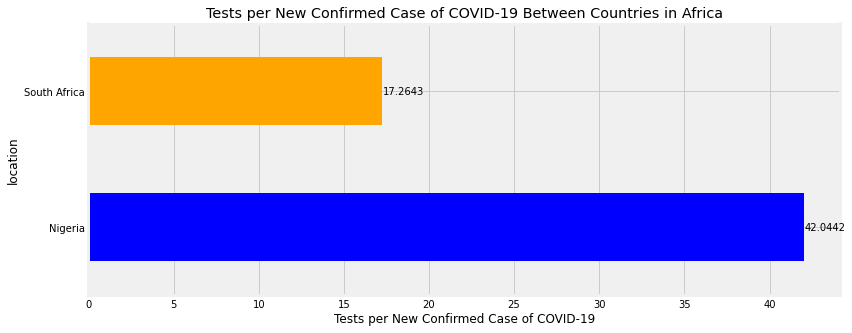

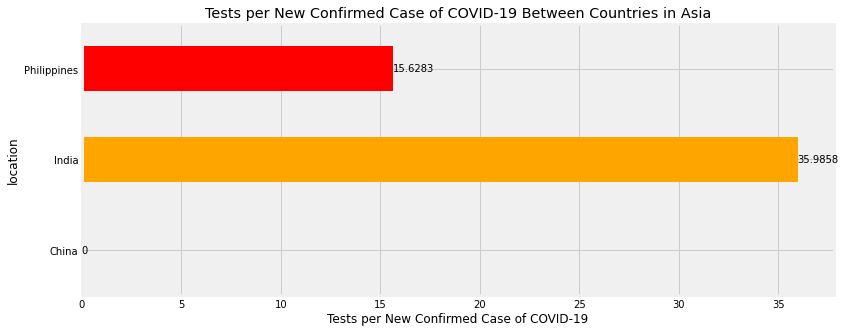

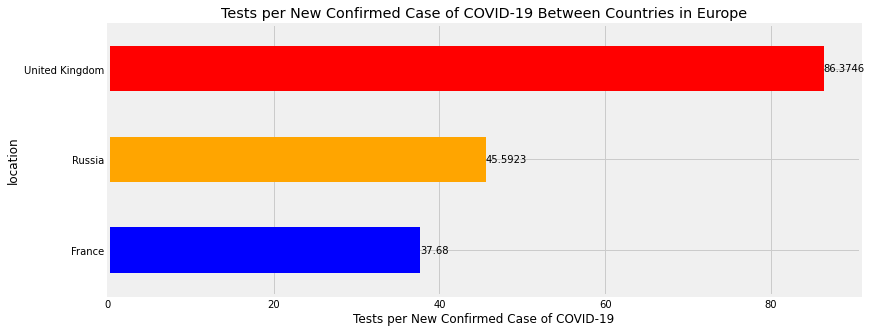

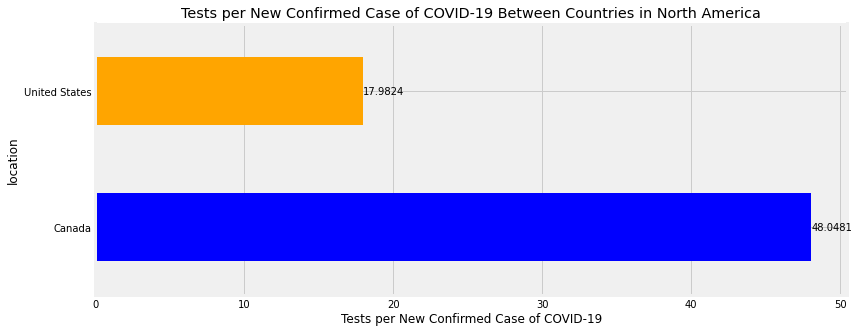

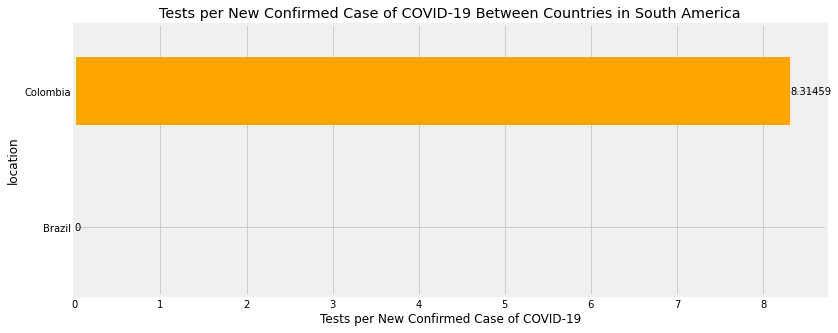

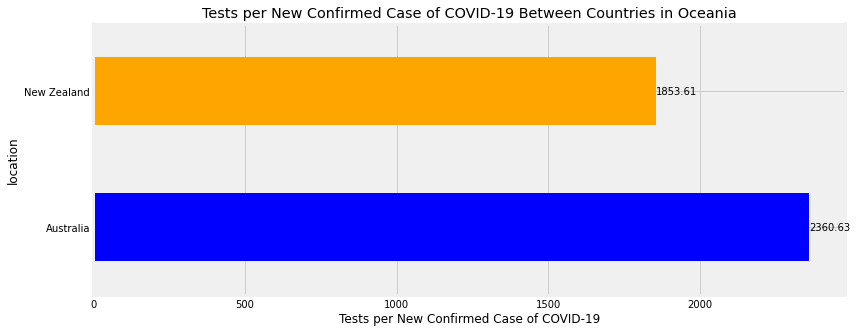

In [137]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["tests_per_case"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Tests per New Confirmed Case of COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Tests per New Confirmed Case of COVID-19")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Policy Responses (Measured by Strictness) due to COVID-19 Between Countries 

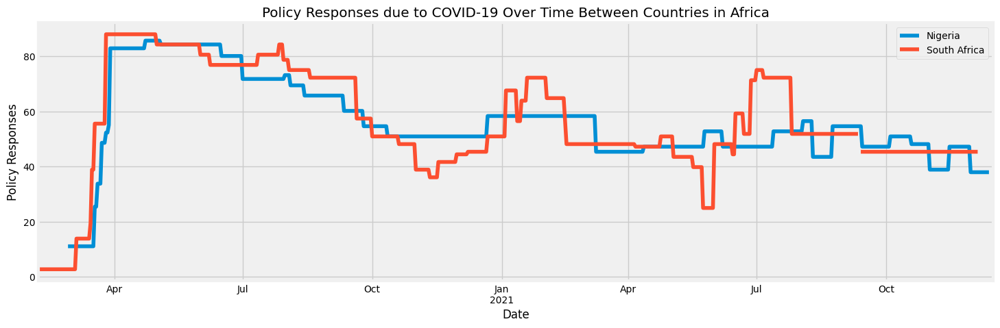

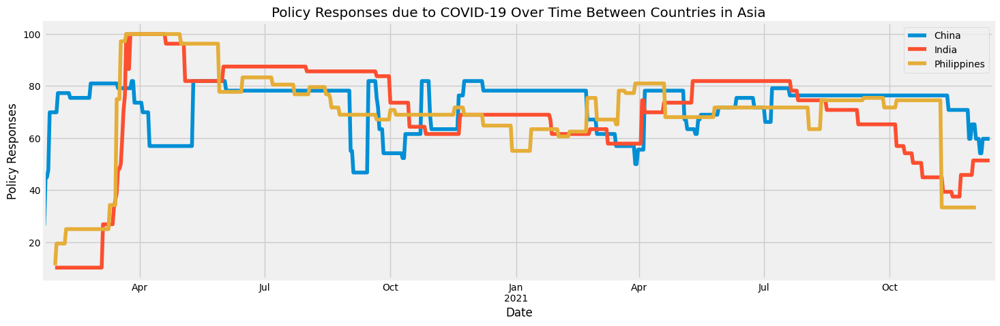

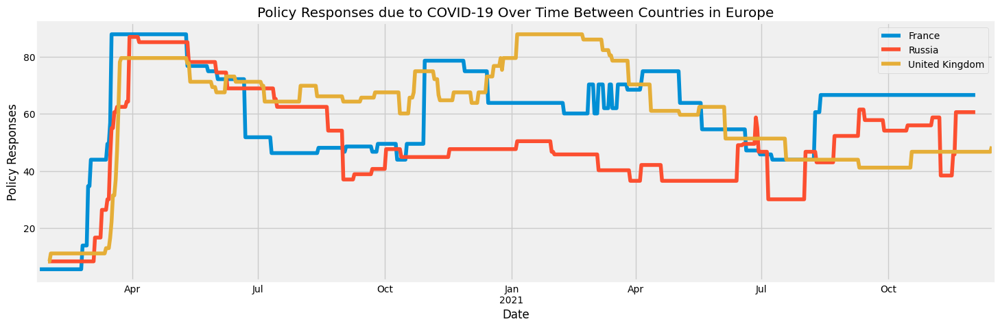

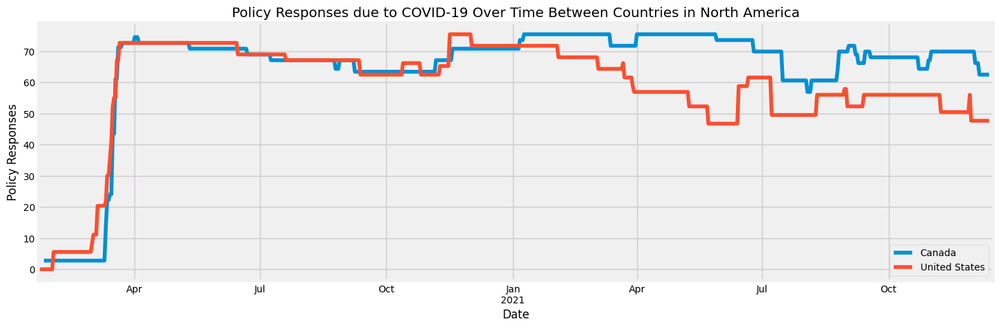

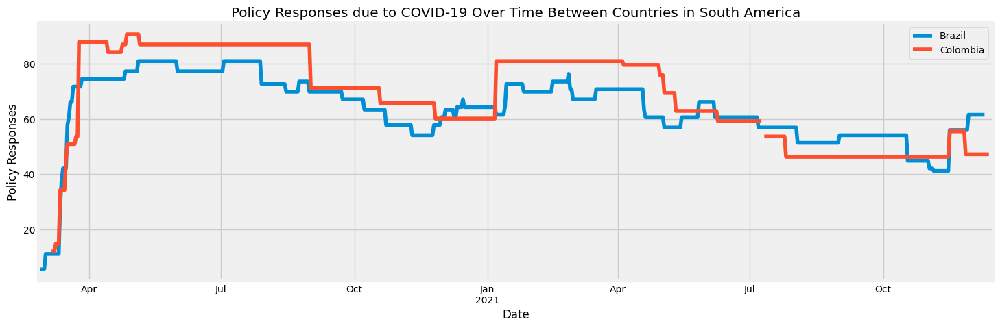

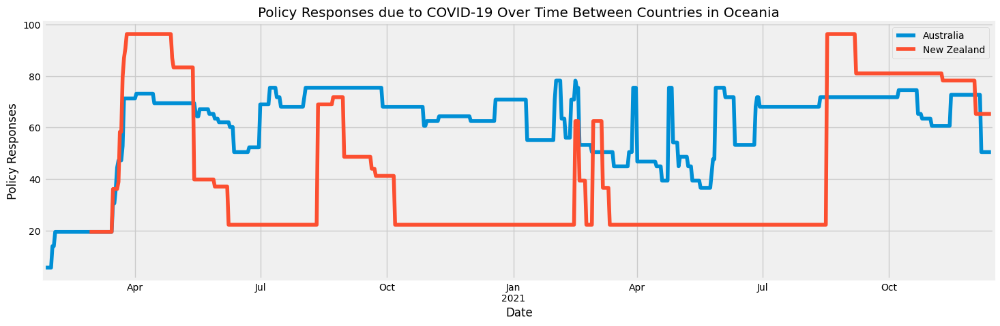

In [138]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['stringency_index'].plot(legend='True')
  title = 'Policy Responses due to COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Policy Responses')
  plt.show()

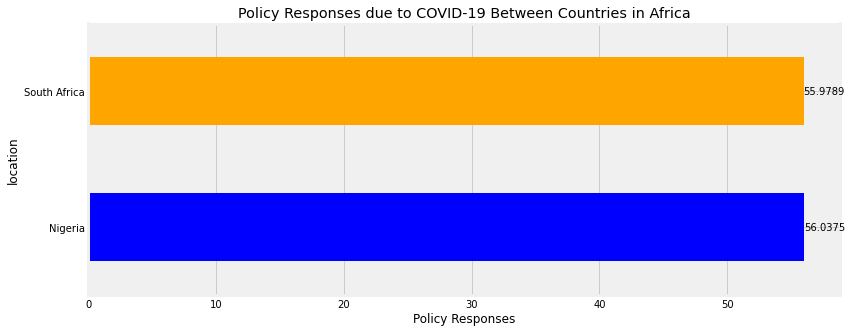

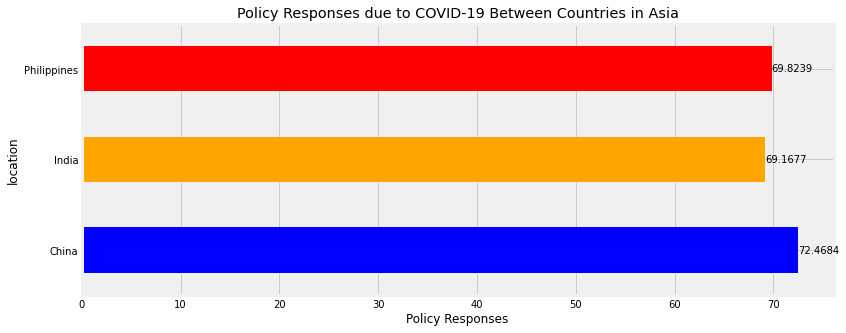

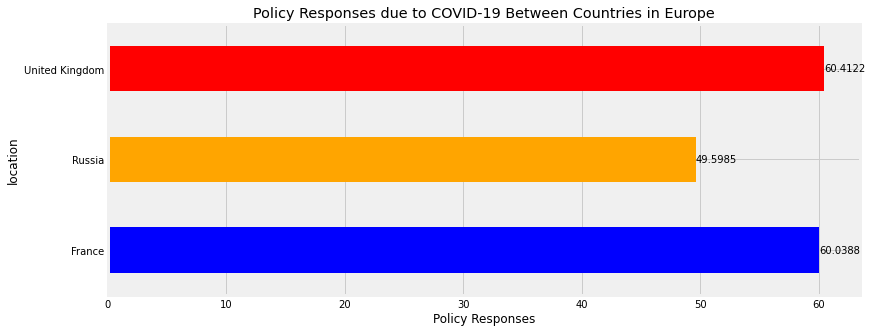

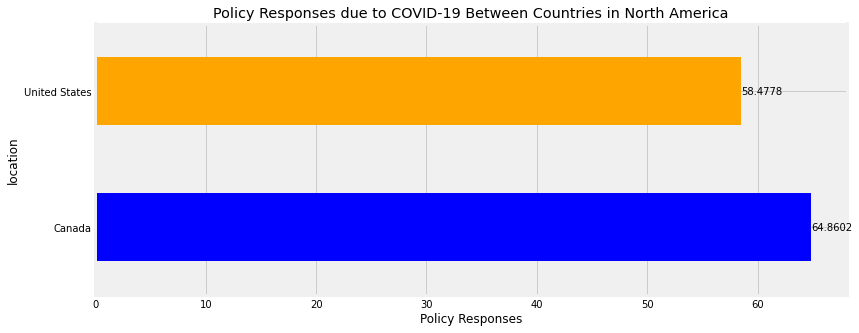

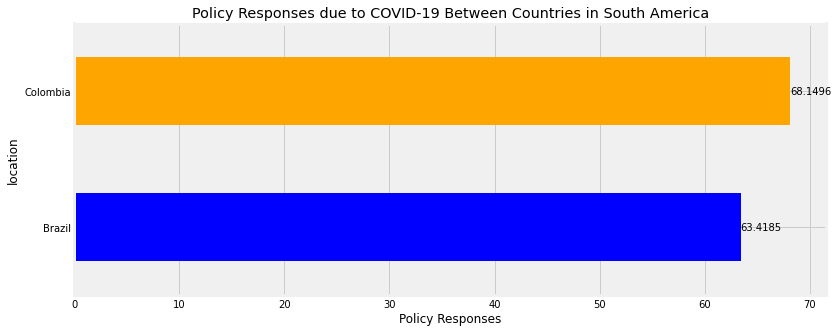

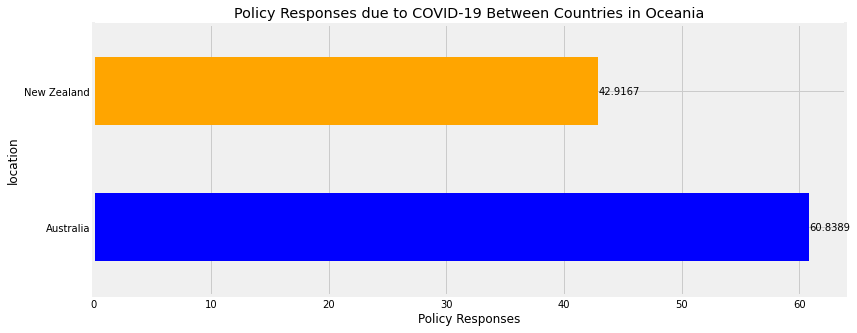

In [139]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["stringency_index"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Policy Responses due to COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Policy Responses")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

## Reproduction Rate for COVID-19 Between Countries

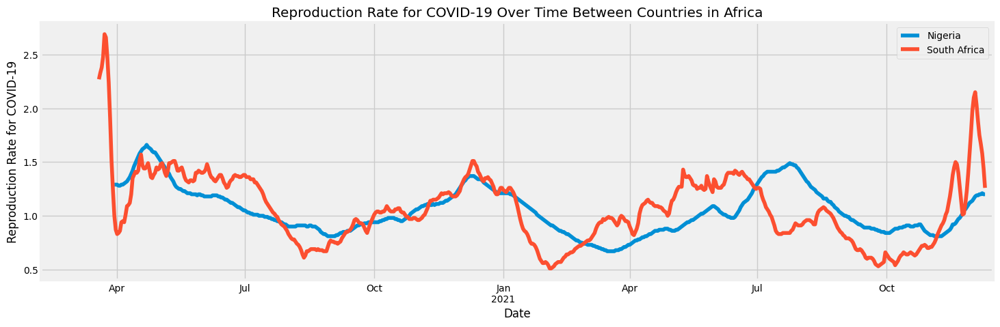

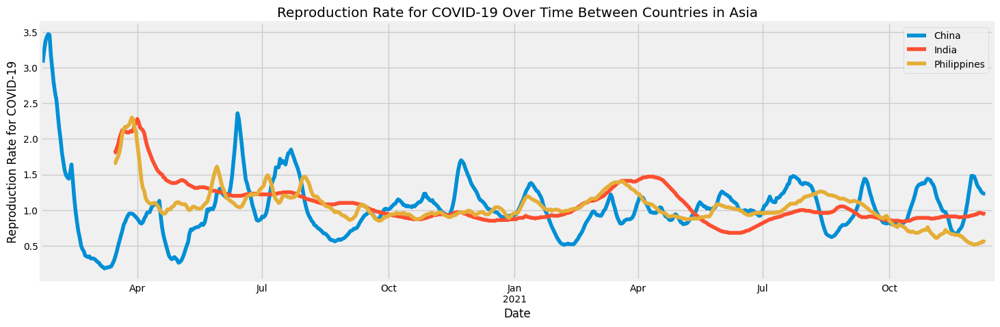

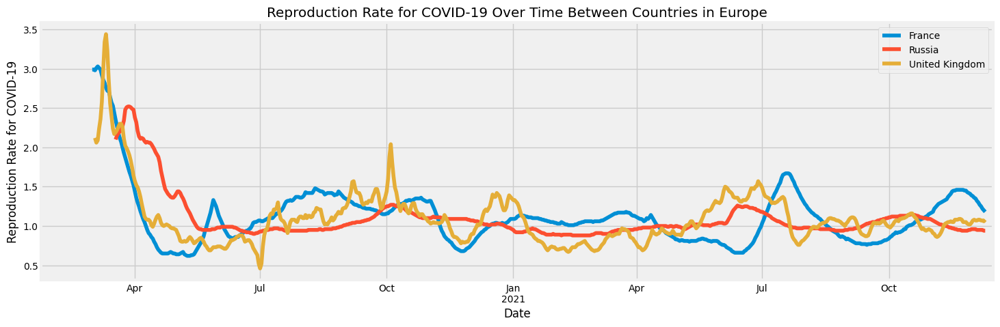

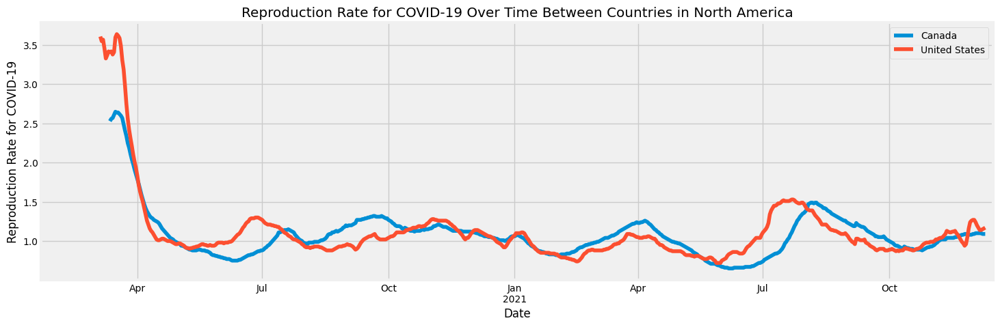

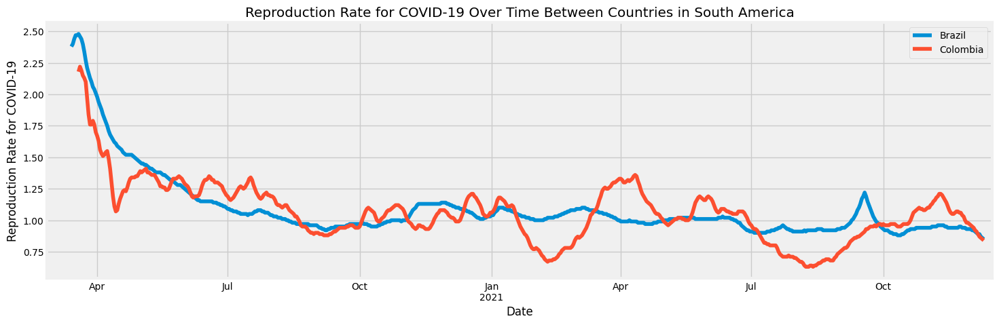

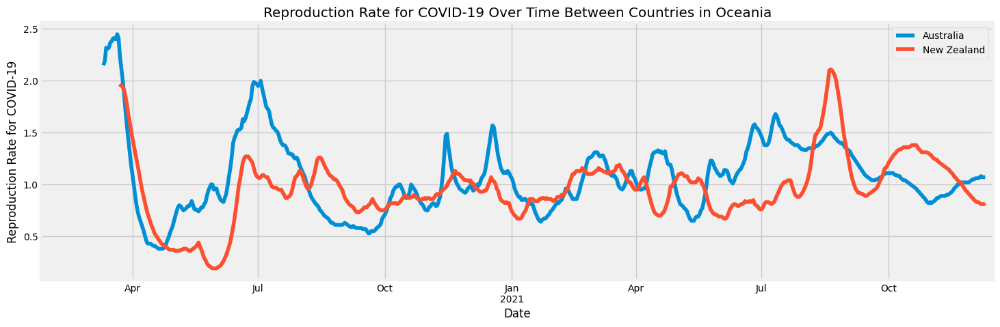

In [140]:
for continent_countries in countries_continents_lst:
  plt.figure(figsize=(16,5), dpi=100)
  continent_countries.groupby('location')['reproduction_rate'].plot(legend='True')
  title = 'Reproduction Rate for COVID-19 Over Time Between Countries in ' + list(set(continent_countries['continent']))[0]
  plt.gca().set(title=title, 
                  xlabel='Date', ylabel='Reproduction Rate for COVID-19')
  plt.show()

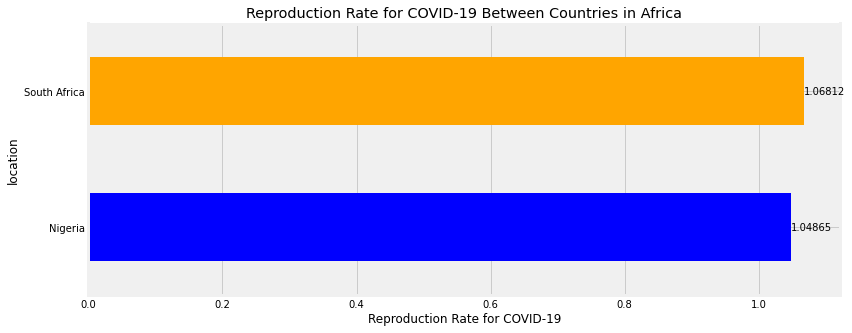

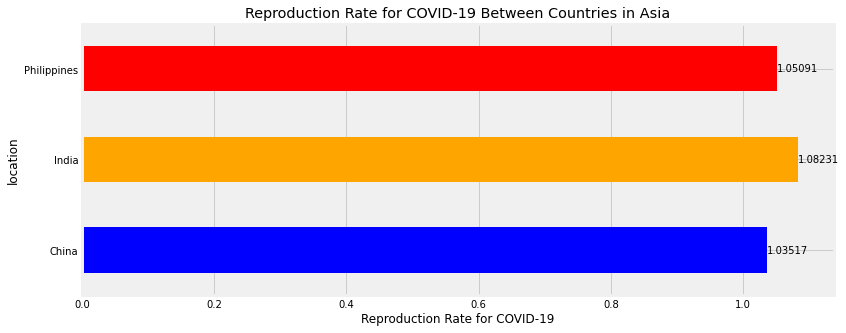

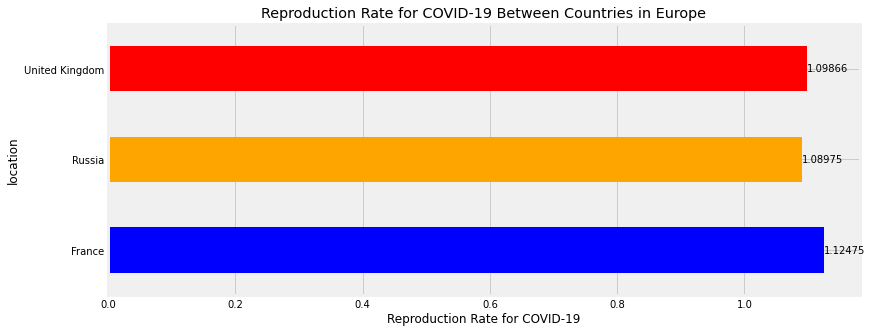

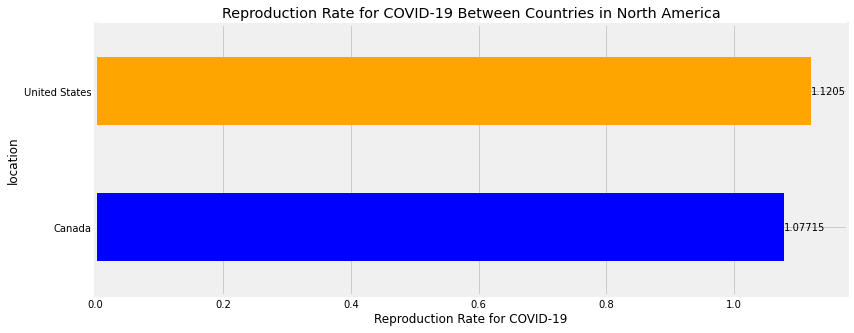

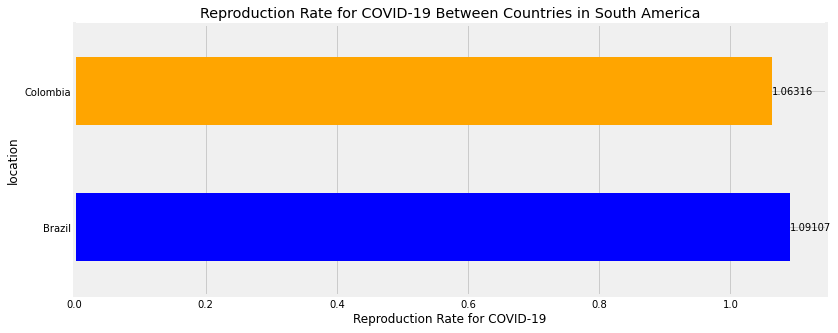

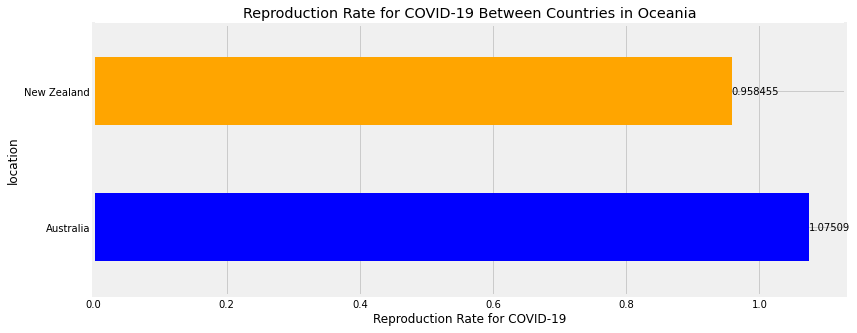

In [141]:
for continent_countries in countries_continents_lst:
  group = continent_countries.groupby("location")["reproduction_rate"].mean() 

  fig, axe = plt.subplots(figsize=(12,5)) 
  title = "Reproduction Rate for COVID-19 Between Countries in " + list(set(continent_countries['continent']))[0]
  plt.title(title)
  plt.xlabel("Reproduction Rate for COVID-19")

  ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

  # add annotations if desired
  for c in ax.containers:
      
      # set the bar label
      ax.bar_label(c, label_type='edge')

# Income Bracket Data

In [ ]:
# Getting data corresponding to Income Brackets around the World
incomes = ['High income', 'Low income', 'Lower middle income', 'Upper middle income']
incomes_covid_data = owid_covid_data[owid_covid_data['location'].isin(incomes)]

In [ ]:
# Check first 5 rows of dataframe
incomes_covid_data.head()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
54814,OWID_HIC,NaN,High income,2020-01-22,5.0,0.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54815,OWID_HIC,NaN,High income,2020-01-23,8.0,3.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54816,OWID_HIC,NaN,High income,2020-01-24,16.0,8.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54817,OWID_HIC,NaN,High income,2020-01-25,20.0,4.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54818,OWID_HIC,NaN,High income,2020-01-26,36.0,16.0,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.214930e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Check last 5 rows of dataframe
incomes_covid_data.tail()

,iso_code,continent,location,date,total_cases,new_cases,total_deaths,new_deaths,reproduction_rate,icu_patients,hosp_patients,weekly_icu_admissions,weekly_hosp_admissions,new_tests,total_tests,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,total_boosters,new_vaccinations,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative_absolute,excess_mortality_cumulative,excess_mortality,excess_mortality_cumulative_per_million
134452,OWID_UMC,NaN,Upper middle income,2021-12-11,83852957.0,102661.0,2219971.0,2040.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.916343e+09,1.918226e+09,1.743611e+09,178533685.0,16976689.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
134453,OWID_UMC,NaN,Upper middle income,2021-12-12,83970965.0,118008.0,2222140.0,2169.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.928274e+09,1.919158e+09,1.744773e+09,178903227.0,11931427.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
134454,OWID_UMC,NaN,Upper middle income,2021-12-13,84057464.0,86499.0,2224012.0,1872.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.940117e+09,1.920040e+09,1.746118e+09,179711754.0,11842571.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
134455,OWID_UMC,NaN,Upper middle income,2021-12-14,84194233.0,136769.0,2226812.0,2800.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.951940e+09,1.920706e+09,1.747322e+09,180795557.0,11823219.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
134456,OWID_UMC,NaN,Upper middle income,2021-12-15,84317932.0,123699.0,2229625.0,2813.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.957170e+09,1.922957e+09,1.749493e+09,181603412.0,5229826.0,NaN,2.513673e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Shape of incomes_covid_data
incomes_covid_data.shape

(2744, 43)

In [ ]:
# Number of Null Values in Each Column
incomes_covid_data.isnull().sum()

iso_code                                      0
continent                                  2744
location                                      0
date                                          0
total_cases                                   2
new_cases                                     0
total_deaths                                 43
new_deaths                                    0
reproduction_rate                          2744
icu_patients                               2744
hosp_patients                              2744
weekly_icu_admissions                      2744
weekly_hosp_admissions                     2744
new_tests                                  2744
total_tests                                2744
positive_rate                              2744
tests_per_case                             2744
tests_units                                2744
total_vaccinations                         1383
people_vaccinated                          1383
people_fully_vaccinated                 

In [ ]:
# Check to see unique Income Brackets
incomes_covid_data['location'].unique()

array(['High income', 'Low income', 'Lower middle income',
       'Upper middle income'], dtype=object)

In [ ]:
# Set Index to Date
incomes_covid_data.set_index('date', inplace=True)

## Population Between Income Types

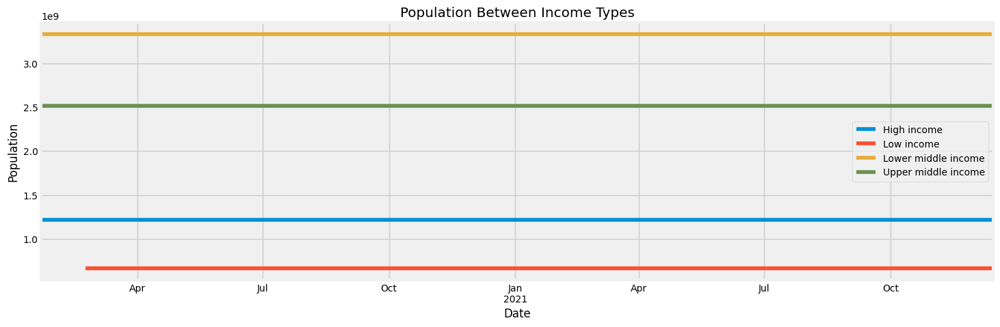

In [ ]:
# Note that Population Between Income Brackets Didn't Change for Some Reason But Let's Just Accept what the Data Says
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['population'].plot(legend='True')
title = 'Population Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Population')
plt.show()

In [ ]:
group = incomes_covid_data.groupby("location")["population"].max()
print("Population Between Income Types")
print("                   ")
group

Population Between Income Types
                   


location
High income            1.214930e+09
Low income             6.651490e+08
Lower middle income    3.330653e+09
Upper middle income    2.513673e+09
Name: population, dtype: float64

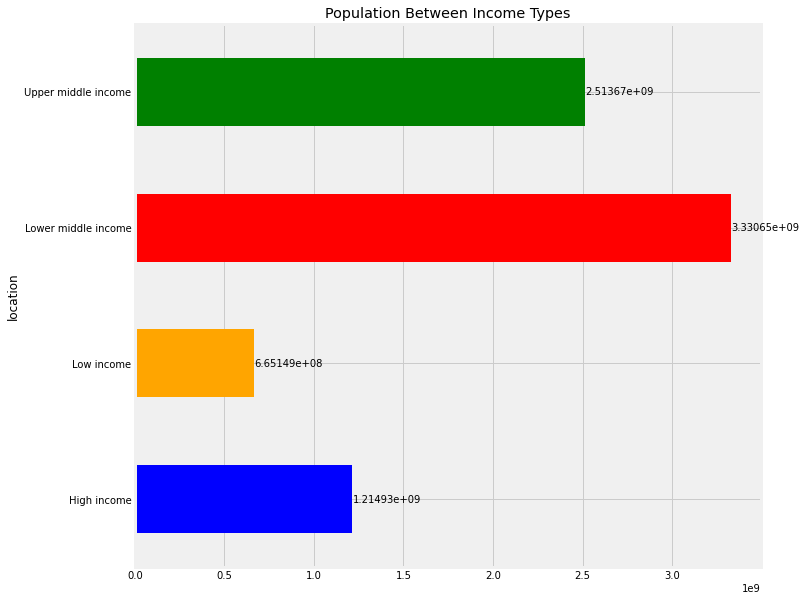

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Population Between Income Types")
plt.ylabel("Population")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Cumulative and Daily New Number of COVID-19 Cases Over Time Between Income Types

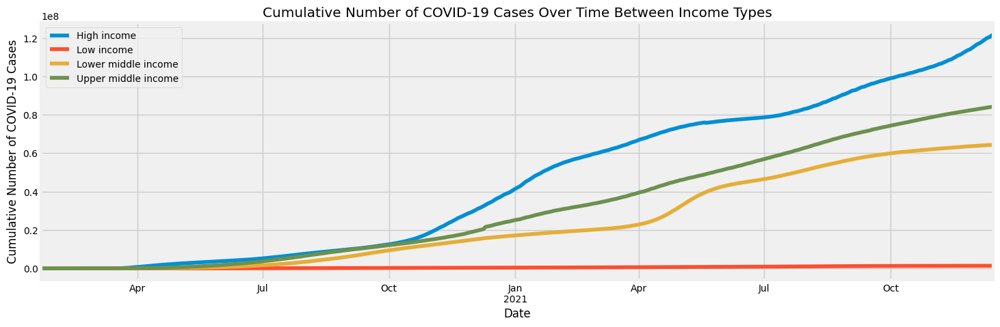

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_cases'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Cases')
plt.show()

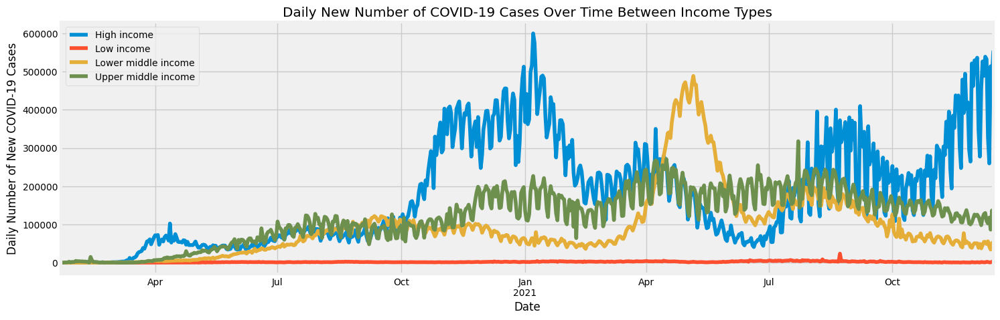

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_cases'].plot(legend='True')
title = 'Daily New Number of COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Cases')
plt.show()

## Cumulative and Daily New Number of COVID-19 Deaths Over Time Between Income Types

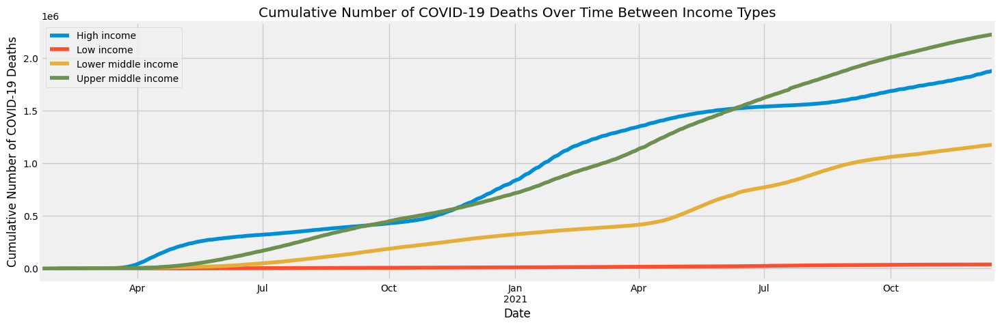

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_deaths'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Deaths Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Deaths')
plt.show()

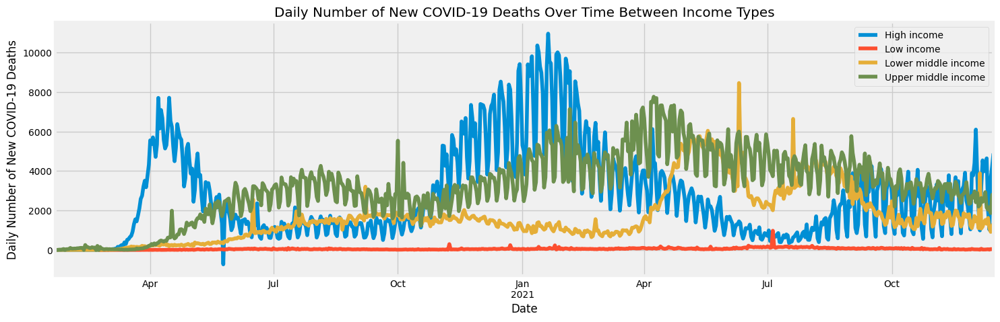

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_deaths'].plot(legend='True')
title = 'Daily Number of New COVID-19 Deaths Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Deaths')
plt.show()

## Cumulative and Daily New Number of COVID-19 Vaccinations Over Time Between Income Types

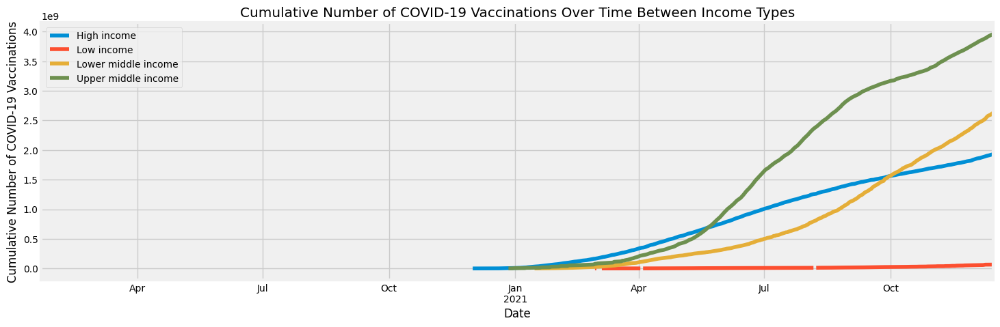

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['total_vaccinations'].plot(legend='True')
title = 'Cumulative Number of COVID-19 Vaccinations Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Cumulative Number of COVID-19 Vaccinations')
plt.show()

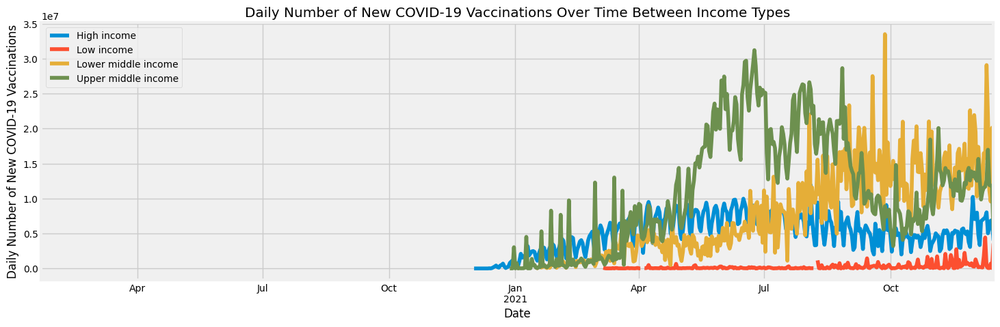

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['new_vaccinations'].plot(legend='True')
title = 'Daily Number of New COVID-19 Vaccinations Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Daily Number of New COVID-19 Vaccinations')
plt.show()

## Total Number of Vaccinated People (At LEAST One Dose) Between Income Types

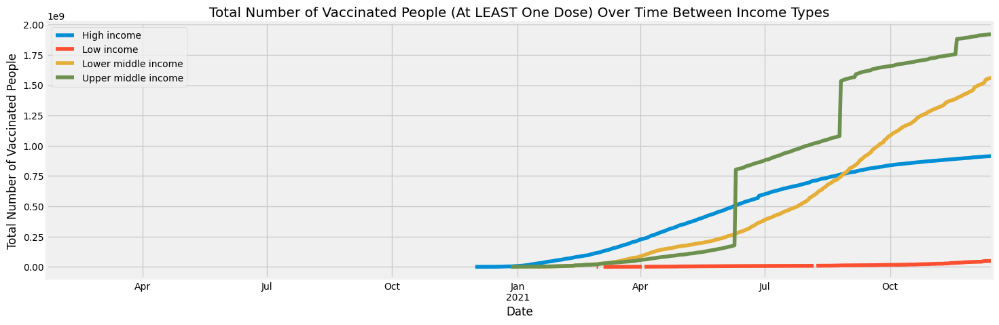

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['people_vaccinated'].plot(legend='True')
title = 'Total Number of Vaccinated People (At LEAST One Dose) Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Vaccinated People')
plt.show()

## Total Number of FULLY Vaccinated People Between Income Types

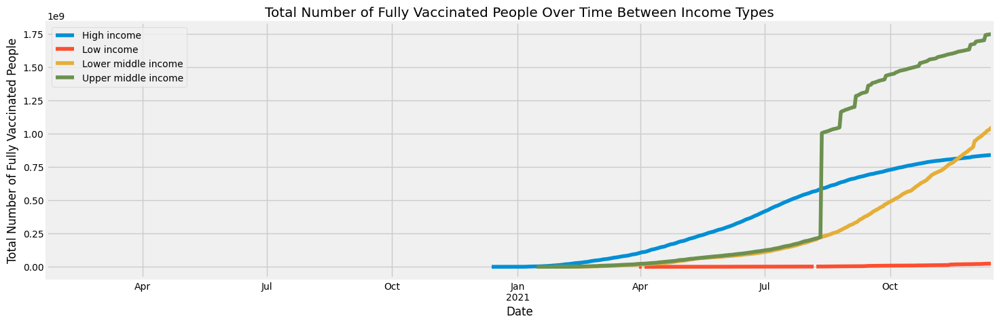

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['people_fully_vaccinated'].plot(legend='True')
title = 'Total Number of Fully Vaccinated People Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Total Number of Fully Vaccinated People')
plt.show()

## Proportion of Population Tested Positive and Have Died From COVID-19 Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_cases"].sum() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Population Tested Positive for COVID-19 Between Income Types")
print("                   ")
group

Proportion of Population Tested Positive for COVID-19 Between Income Types
                   


location
High income            0.100760
Low income             0.002109
Lower middle income    0.019354
Upper middle income    0.033149
dtype: float64

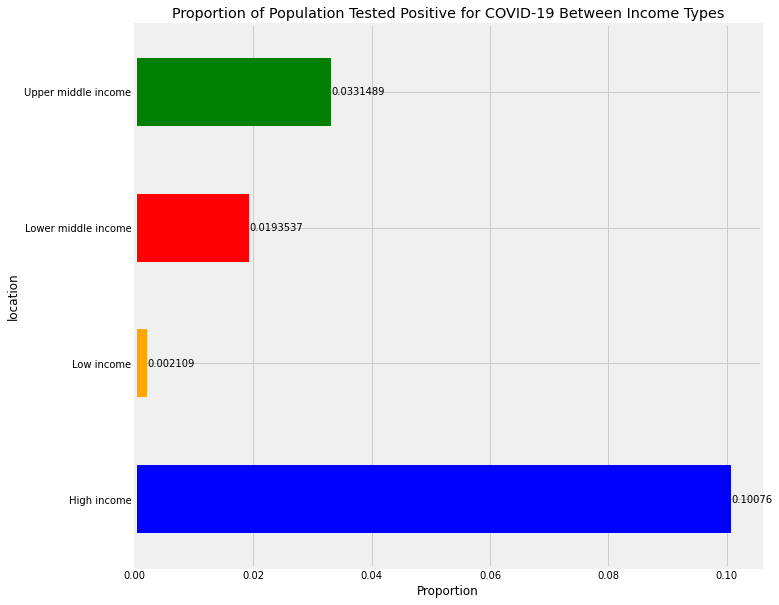

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population Tested Positive for COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [ ]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Population that Died from COVID-19 Between Income Types")
print("                   ")
group

Proportion of Population that Died from COVID-19 Between Income Types
                   


location
High income            0.001552
Low income             0.000057
Lower middle income    0.000353
Upper middle income    0.000880
dtype: float64

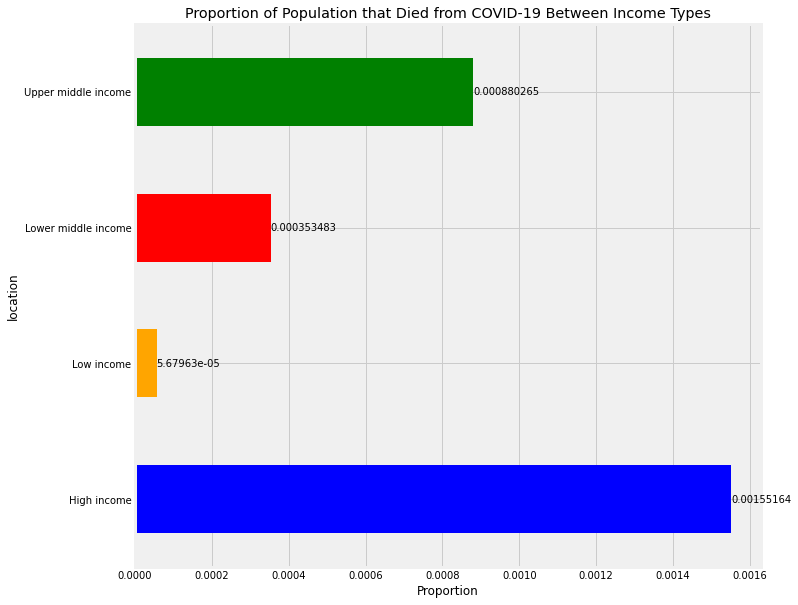

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Population that Died from COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population Tested Positive for COVID-19 that have Died from COVID-19 Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum() / incomes_covid_data.groupby("location")["new_cases"].sum()
print("Proportion of Positive Tested Population that Died from COVID-19 Between Income Types")
print("                   ")
group

Proportion of Positive Tested Population that Died from COVID-19 Between Income Types
                   


location
High income            0.015399
Low income             0.026930
Lower middle income    0.018264
Upper middle income    0.026555
dtype: float64

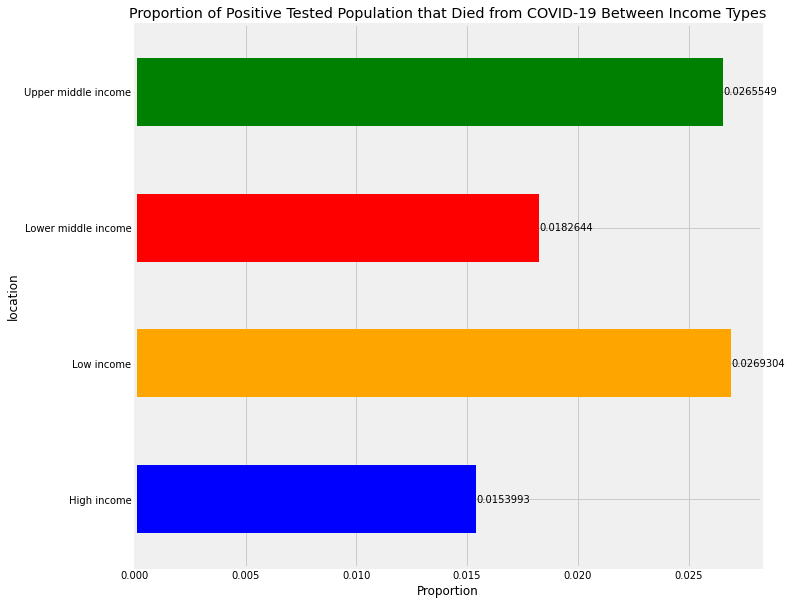

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Positive Tested Population that Died from COVID-19 Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of Population that are Vaccinated (Fully or Partially) Between Income Types


In [ ]:
group = incomes_covid_data.groupby("location")["people_vaccinated"].max() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types")
print("                   ")
group

Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types
                   


location
High income            0.752502
Low income             0.075511
Lower middle income    0.470029
Upper middle income    0.764999
dtype: float64

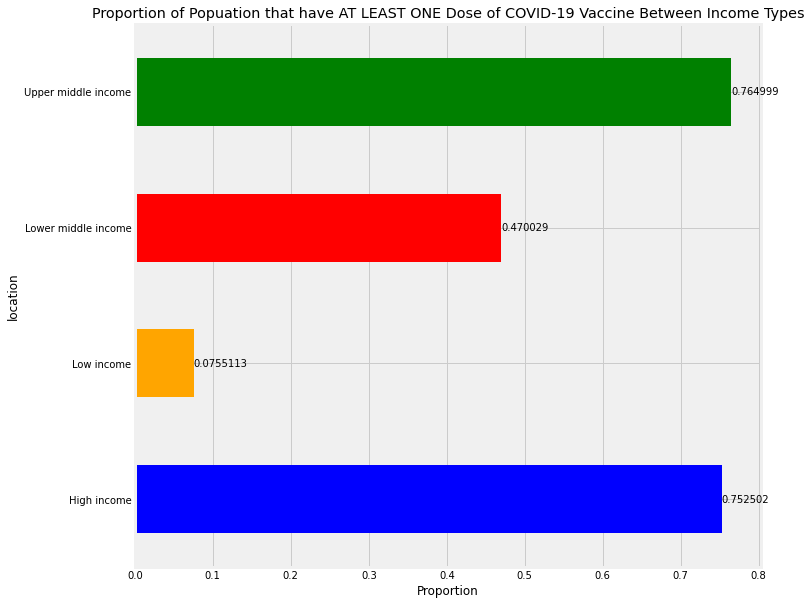

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that have AT LEAST ONE Dose of COVID-19 Vaccine Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

In [ ]:
group = incomes_covid_data.groupby("location")["people_fully_vaccinated"].max() / incomes_covid_data.groupby("location")["population"].max()
print("Proportion of Popuation that are FULLY Vaccinated Between Income Types")
print("                   ")
group

Proportion of Popuation that are FULLY Vaccinated Between Income Types
                   


location
High income            0.691856
Low income             0.036270
Lower middle income    0.315632
Upper middle income    0.695991
dtype: float64

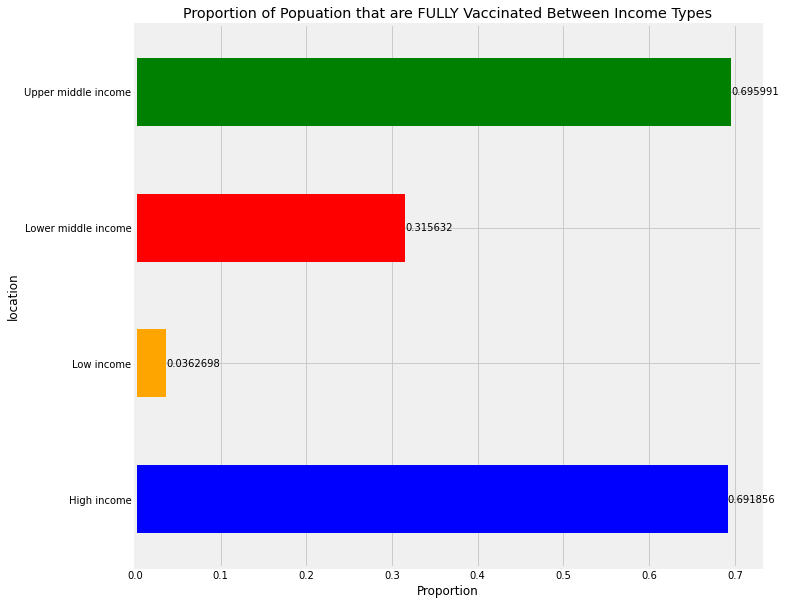

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Proportion of Popuation that are FULLY Vaccinated Between Income Types")
plt.xlabel("Proportion")

ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Proportion of COVID-19 Cases and Proportion of Vaccinations against COVID-19 Over Time Between Income Types 

In [ ]:
incomes_covid_data['Proportion_of_cases_of_population'] = incomes_covid_data['total_cases'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_deaths_of_population'] = incomes_covid_data['total_deaths'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_deaths_of_pos_cases'] = incomes_covid_data['total_deaths'] / incomes_covid_data['total_cases']
incomes_covid_data['Proportion_of_vaccinated_of_population'] = incomes_covid_data['people_vaccinated'] / incomes_covid_data['population']
incomes_covid_data['Proportion_of_fully_vaccinated_of_population'] = incomes_covid_data['people_fully_vaccinated'] / incomes_covid_data['population']

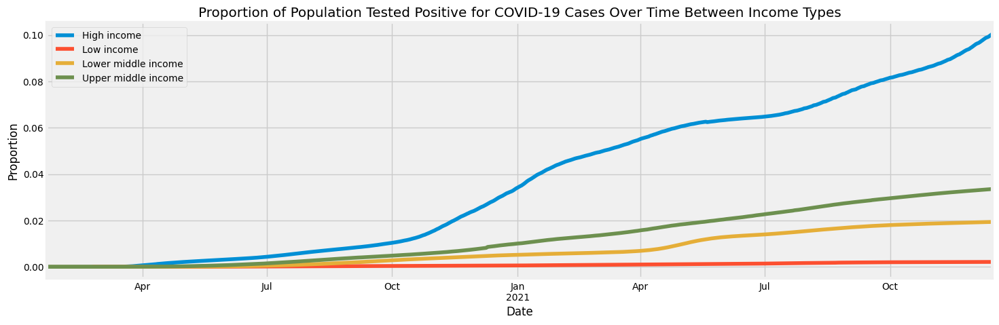

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_cases_of_population'].plot(legend='True')
title = 'Proportion of Population Tested Positive for COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

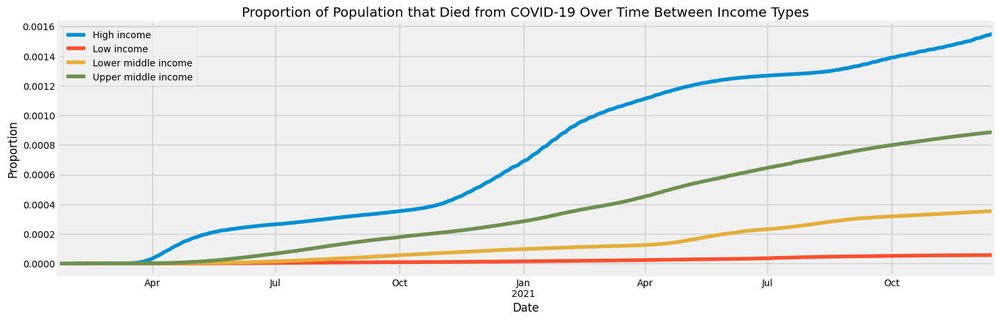

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_deaths_of_population'].plot(legend='True')
title = 'Proportion of Population that Died from COVID-19 Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

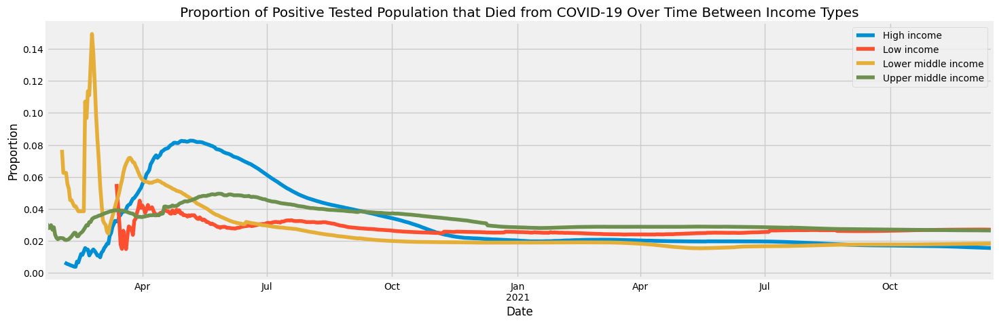

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_deaths_of_pos_cases'].plot(legend='True')
title = 'Proportion of Positive Tested Population that Died from COVID-19 Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

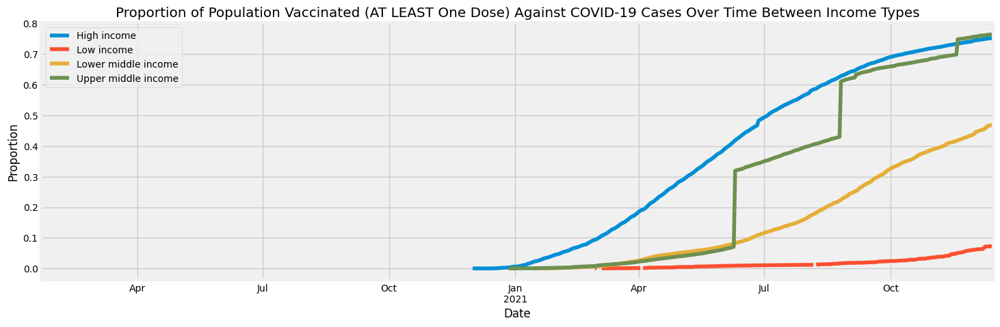

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population Vaccinated (AT LEAST One Dose) Against COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

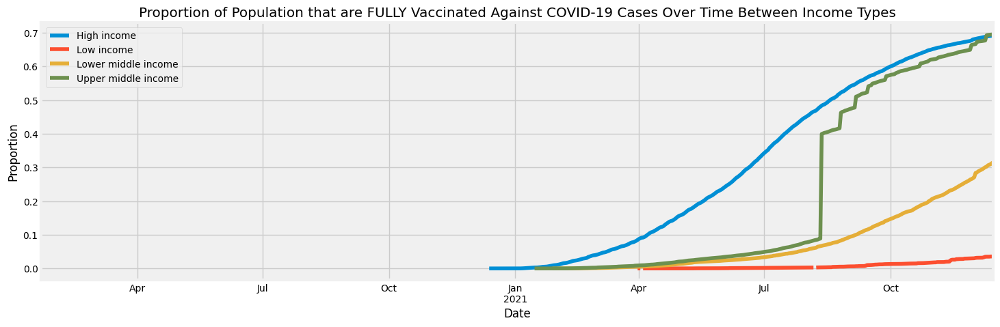

In [ ]:
plt.figure(figsize=(16,5), dpi=100)
incomes_covid_data.groupby('location')['Proportion_of_fully_vaccinated_of_population'].plot(legend='True')
title = 'Proportion of Population that are FULLY Vaccinated Against COVID-19 Cases Over Time Between Income Types'
plt.gca().set(title=title, 
                xlabel='Date', ylabel='Proportion')
plt.show()

## Total Number of COVID-Cases Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_cases"].sum()
print("Total Number of COVID-19 Cases Between Income Types")
print("                   ")
group

Total Number of COVID-19 Cases Between Income Types
                   


location
High income            122416800.0
Low income               1402802.0
Lower middle income     64460377.0
Upper middle income     83325463.0
Name: new_cases, dtype: float64

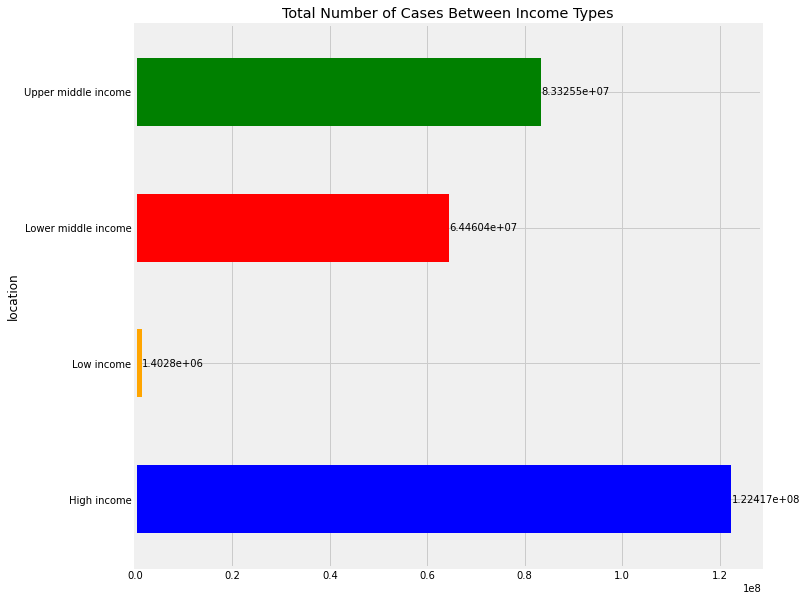

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Cases Between Income Types")
plt.ylabel("Total Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Cases Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_cases"].mean()
print("Mean Daily New Number of COVID-19 Cases Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Cases Between Income Types
                   


location
High income            176393.083573
Low income               2119.036254
Lower middle income     92882.387608
Upper middle income    120065.508646
Name: new_cases, dtype: float64

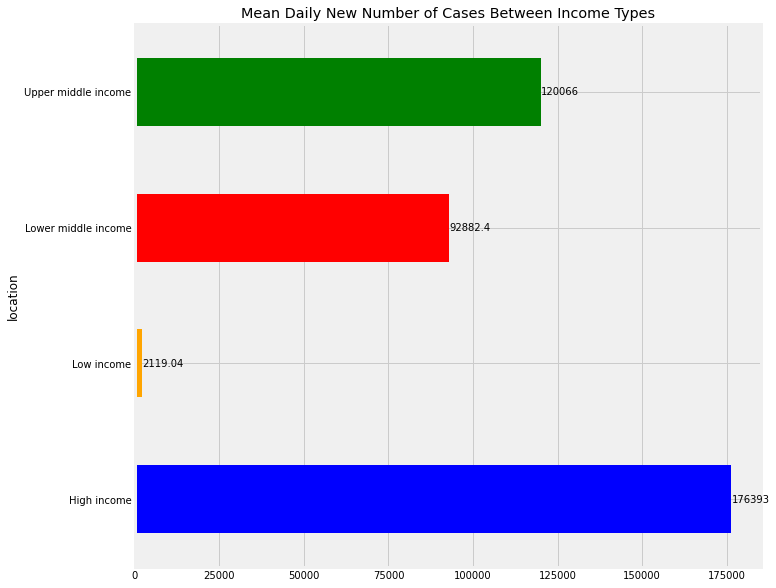

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Cases Between Income Types")
plt.ylabel("Mean Daily New Number of Cases")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Deaths Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_deaths"].sum()
print("Total Number of COVID-19 Deaths Between Income Types")
print("                   ")
group

Total Number of COVID-19 Deaths Between Income Types
                   


location
High income            1885131.0
Low income               37778.0
Lower middle income    1177330.0
Upper middle income    2212698.0
Name: new_deaths, dtype: float64

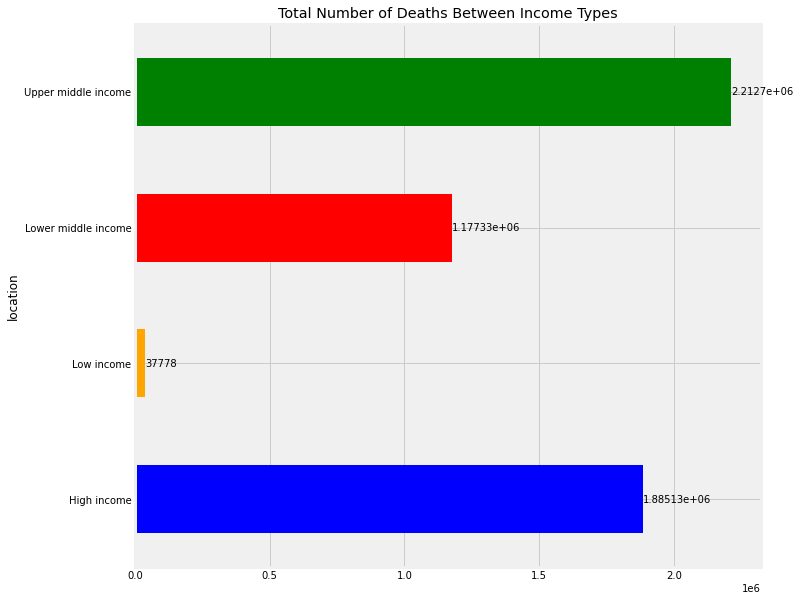

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Deaths Between Income Types")
plt.ylabel("Total Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Deaths Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_deaths"].mean()
print("Mean Daily New Number of COVID-19 Deaths Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Deaths Between Income Types
                   


location
High income            2716.327089
Low income               57.066465
Lower middle income    1696.440922
Upper middle income    3188.325648
Name: new_deaths, dtype: float64

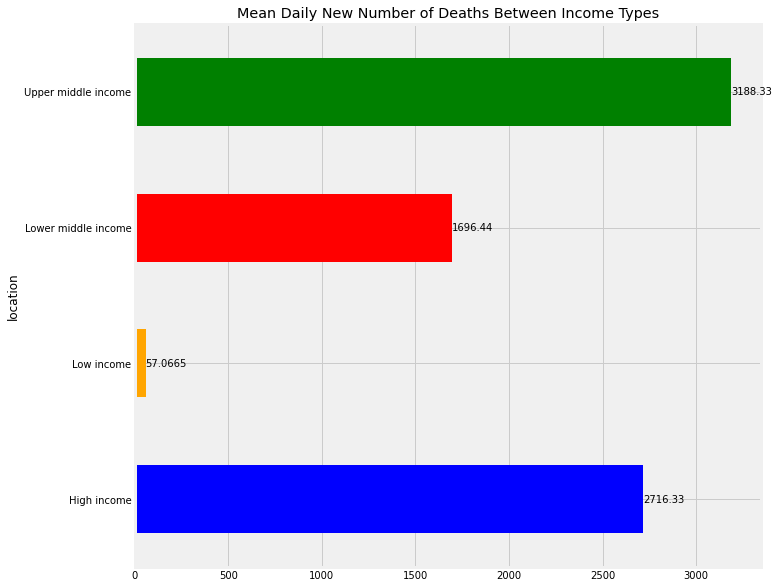

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Deaths Between Income Types")
plt.ylabel("Mean Daily New Number of Deaths")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of COVID-19 Vaccinations Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_vaccinations"].sum()
print("Total Number of COVID-19 Vaccinations Between Income Types")
print("                   ")
group

Total Number of COVID-19 Vaccinations Between Income Types
                   


location
High income            1.929489e+09
Low income             6.863734e+07
Lower middle income    2.629780e+09
Upper middle income    3.955610e+09
Name: new_vaccinations, dtype: float64

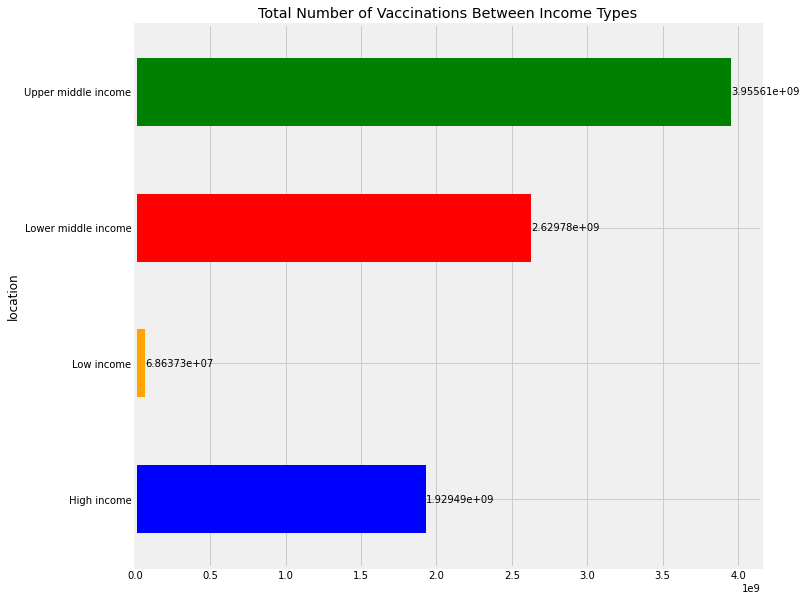

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinations Between Income Types")
plt.ylabel("Total Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Mean Daily New Number of COVID-19 Vaccinations Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["new_vaccinations"].mean()
print("Mean Daily New Number of COVID-19 Vaccinations Between Income Types")
print("                   ")
group

Mean Daily New Number of COVID-19 Vaccinations Between Income Types
                   


location
High income            5.091000e+06
Low income             2.433948e+05
Lower middle income    7.873591e+06
Upper middle income    1.120569e+07
Name: new_vaccinations, dtype: float64

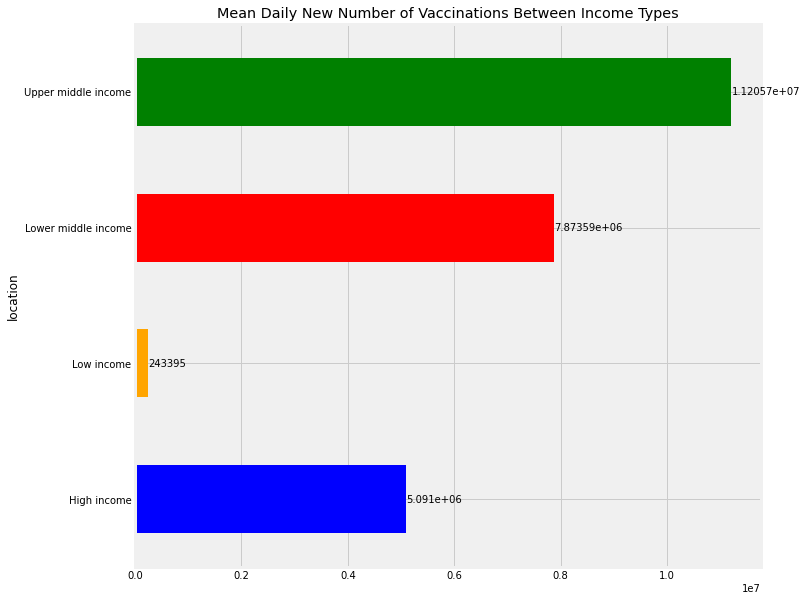

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Mean Daily New Number of Vaccinations Between Income Types")
plt.ylabel("Mean Daily New Number of Vaccinations")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["people_vaccinated"].max()
print("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types")
print("                   ")
group

Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types
                   


location
High income            9.142368e+08
Low income             5.022625e+07
Lower middle income    1.565503e+09
Upper middle income    1.922957e+09
Name: people_vaccinated, dtype: float64

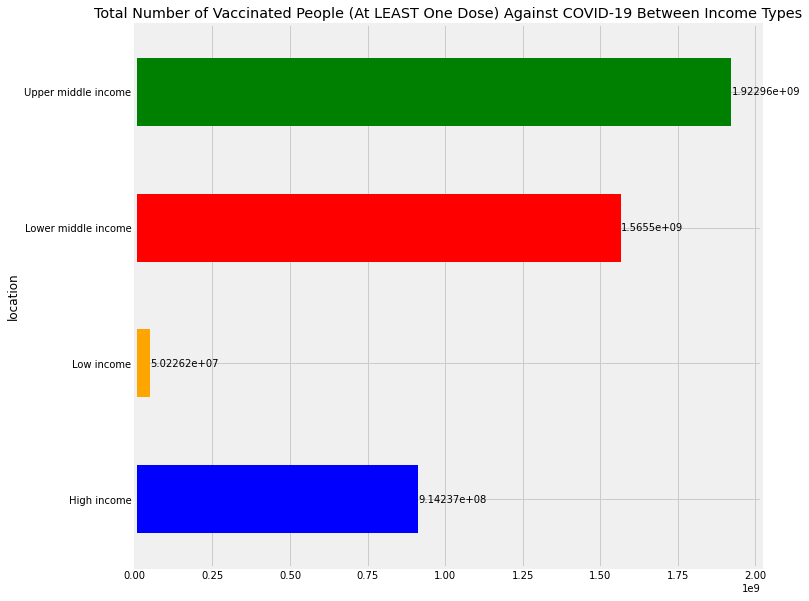

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Vaccinated People (At LEAST One Dose) Against COVID-19 Between Income Types")
plt.ylabel("Total Number of Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')

## Total Number of Fully Vaccinated People Against COVID-19 Between Income Types

In [ ]:
group = incomes_covid_data.groupby("location")["people_fully_vaccinated"].max()
print("Total Number of Fully Vaccinated People Against COVID-19 Between Income Types")
print("                   ")
group

Total Number of Fully Vaccinated People Against COVID-19 Between Income Types
                   


location
High income            8.405572e+08
Low income             2.412480e+07
Lower middle income    1.051260e+09
Upper middle income    1.749493e+09
Name: people_fully_vaccinated, dtype: float64

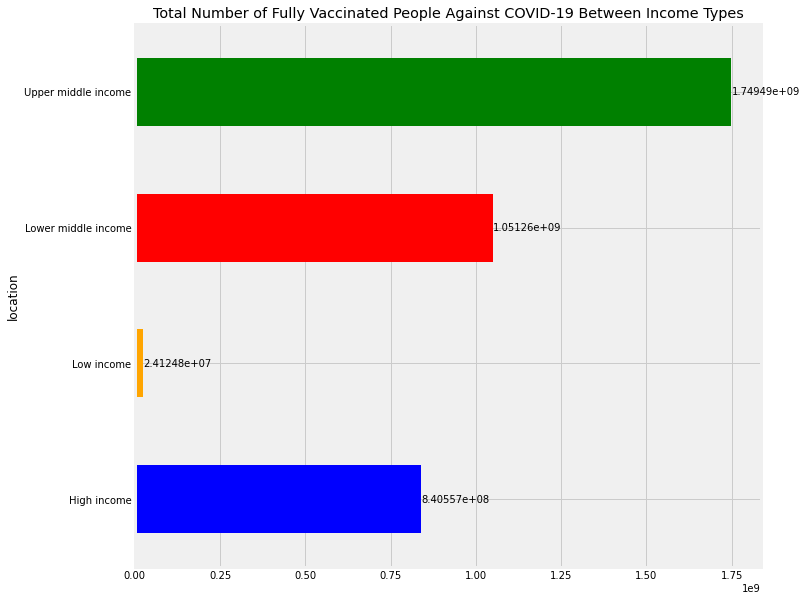

In [ ]:
fig, axe = plt.subplots(figsize=(10,10)) 

plt.title("Total Number of Fully Vaccinated People Against COVID-19 Between Income Types")
plt.ylabel("Total Number of Fully Vaccinated People")


ax = group.plot(kind='barh', color=['blue','orange', 'red', 'green'], stacked=False,  ax=axe, rot=0)

# add annotations if desired
for c in ax.containers:
    
    # set the bar label
    ax.bar_label(c, label_type='edge')